# NAME :- SHUBHAM PRABHAKAR WANKAR
# BATCH :- 91

                       
# <font color = red>Importing Required Libraries</font>             

In [203]:
# We are using this library to interact with websites / services and getting the data into our application

import warnings
warnings.filterwarnings("ignore")


import joblib

import requests
from bs4 import BeautifulSoup

import re

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

       
# <font color = Green><h1><center>WEB SCRAPPING PART</center></h1></font>    


                       

# <font color = Red>Web - Scrapping is done on this website</font>

## https://www.iplt20.com/stats
## https://www.iplt20.com/stats/most-fours-innings
## https://www.iplt20.com/stats/player-points

                            


# <font color = Red>To Extract Data For Over All Season</font>
                               

In [204]:
years = []     # For years
team = []      # For Team Name
players = []   # For Player Names
mat = []       # For Matches Played
inns = []      # For Innings
no = []        # For Not Outs
runs = []      # For Total Runs
hs = []        # For Highest Scores
avg = []       # For Average
bf = []        # For Balls Faced
sr = []        # For Strike Rate
hundreds = []  # For No. Of Hundreds
fifty = []     # For No. Of Fifties
fours = []     # For No. Of Fours 
sixs = []      # For No. Of Sixs 

In [205]:

year = [2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021]

l = {1:'Chennai Super Kings',2:'Deccan Charges',62:'Sunrises Hyderabad',3:'Delhi Capitals',4:'Kings Xi Punjab',5:'Kolakata Knight Riders',6:'Mumbai Indians',7:'Pune Warriors',8:'Rajasthan Royals',9:'Royal Challengers Banglore',10:'kochi Tuskers Kerala',433:'Gujarat Lions',434:'Rising Pune Supergiant'}


In [206]:
# This for loop is to extract data year wise and years

for yr in year:    
    
    # This piece of code is to get the HTML tags into our code    
        
    URL = 'https://www.iplt20.com/stats/{}'.format(yr)
    html_page = requests.get(URL)
    content = html_page.content   
   
    
    # This line is to create BeautifulSoup Object Which is used to parse the
    # HTML hierarchichal pattern tags
    
    soup = BeautifulSoup(content)
    
        
    # This loop is to extract Team Name 
    
    for i in l:
        
        # This loop is to extract Player Name 
        
        for x in soup.findAll('tr',{'data-team-id':i}):
            
            years.append(yr)
            
            if i == 1:
                team.append(l[i])           
            elif i == 62:
                team.append(l[i])
            elif i == 3:
                team.append(l[i])
            elif i == 4:
                team.append(l[i])
            elif i == 5:
                team.append(l[i])
            elif i == 6:
                team.append(l[i])
            elif i == 8:
                team.append(l[i])
            elif i == 9:
                team.append(l[i])
                

            if i !=7 and i != 433 and i != 434 and i != 2 and i != 10:
                
                
                p = x.find('a',{'class':'top-players__player-link'})
                
                if p is None:
                    players.append(np.nan)
                else:
                    players.append(''.join(p.text.strip().replace('\n','').replace(' ','',27)))    

            elif i == 7:
                
                q = x.find('div',{'class':'top-players__player-name'})
                team.append(l[7])
                
                if q is None:
                    players.append(np.nan)
                else:
                    players.append(''.join(q.text.replace('\n','').replace(' ','',47)))
                    
            elif i == 433:
                
                q = x.find('div',{'class':'top-players__player-name'})
                team.append(l[433])
                if q is None:
                    players.append(np.nan)
                else:
                    players.append(''.join(q.text.replace('\n','').replace(' ','',47)))
            
            elif i == 434:
                
                q = x.find('div',{'class':'top-players__player-name'})
                team.append(l[434])
                if q is None:
                    players.append(np.nan)
                else:
                    players.append(''.join(q.text.replace('\n','').replace(' ','',47)))
                    
            elif i == 2:
                
                q = x.find('div',{'class':'top-players__player-name'})
                team.append(l[2])
                if q is None:
                    players.append(np.nan)
                else:
                    players.append(''.join(q.text.replace('\n','').replace(' ','',47)))
            
            elif i == 10:
                
                q = x.find('div',{'class':'top-players__player-name'})
                team.append(l[10])
                if q is None:
                    players.append(np.nan)
                else:
                    players.append(''.join(q.text.replace('\n','').replace(' ','',47)))
            
            
            
            
            match = x.find('td',{'class':'top-players__m top-players__padded'})
            innings = x.find('td',{'class':'top-players__inns'})
            not_out = x.find('td',{'class':'top-players__no'})
            total_runs = x.find('td',{'class':'top-players__r is-active'})
            high_score = x.find('td',{'class':'top-players__hs'})
            average = x.find('td',{'class':'top-players__a'})
            ball_faced = x.find('td',{'class':'top-players__b'})
            strike_rate = x.find('td',{'class':'top-players__sr'})
            h_100 = x.find('td',{'class':'top-players__100s'})
            f_50 = x.find('td',{'class':'top-players__50s'})
            f_4 = x.find('td',{'class':'top-players__4s'})
            s_6 = x.find('td',{'class':'top-players__6s'})
            
            if match is None:
                mat.append(np.nan)
            else:
                mat.append(''.join(match.text.replace('\n','').strip()))
                
            if innings is None:
                inns.append(np.nan)
            else:
                inns.append(''.join(innings.text.replace('\n','').strip()))
                
            if not_out is None:
                no.append(np.nan)
            else:
                no.append(''.join(not_out.text.replace('\n','').strip()))
                
            if total_runs is None:
                runs.append(np.nan)
            else:
                runs.append(''.join(total_runs.text.replace('\n','').strip()))
            
            if high_score is None:
                hs.append(np.nan)
            else:
                hs.append(''.join(high_score.text.replace('\n','').strip()))
                
            if average is None:
                avg.append(np.nan)
            else:
                avg.append(''.join(average.text.replace('\n','').strip()))
                
            if ball_faced is None:
                bf.append(np.nan)
            else:
                bf.append(''.join(ball_faced.text.replace('\n','').strip()))
                
            if strike_rate is None:
                sr.append(np.nan)
            else:
                sr.append(''.join(strike_rate.text.replace('\n','').strip()))
                
            if h_100 is None:
                hundreds.append(np.nan)
            else:
                hundreds.append(''.join(h_100.text.replace('\n','').strip()))
                
            if f_50 is None:
                fifty.append(np.nan)
            else:
                fifty.append(''.join(f_50.text.replace('\n','').strip()))
                
            if f_4 is None:
                fours.append(np.nan)
            else:
                fours.append(''.join(f_4.text.replace('\n','').strip()))
                
            if s_6 is None:
                sixs.append(np.nan)
            else:
                sixs.append(''.join(s_6.text.replace('\n','').strip()))
          

                         

# <font color = Red>Creating DataFrame Using Pandas Library</font>

                          

In [207]:
# This line is used for formatting our floating point values with decimal point 2.

pd.set_option('display.float_format','{:.2f}'.format)

ipl_df = pd.DataFrame({'YEARS':years,
                      'TEAMS':team,
                      'PLAYERS':players,                      
                      'MATCHES':mat,
                      'INNINGS':inns,
                      'NOT OUTS':no,
                      'RUNS':runs,
                      'HIGHEST SCORES':hs,
                      'AVERAGE':avg,
                      'BALLS FACED':bf,                      
                      'STRIKE RATE':sr,
                      'HUNDREDS':hundreds,
                      'FIFTY':fifty,
                      'FOURS':fours,
                      'SIXES':sixs,
                      })


In [208]:
ipl_df = joblib.load("ipl_df.pkl")

In [209]:
ipl_df

,YEARS,TEAMS,PLAYERS,MATCHES,INNINGS,NOT OUTS,RUNS,HIGHEST SCORES,AVERAGE,BALLS FACED,STRIKE RATE,HUNDREDS,FIFTY,FOURS,SIXES,OUTS
0,2008,Chennai Super Kings,Suresh Raina,16,14,3,421,55,30.07,296,142.22,0,3,35,18,11
1,2008,Chennai Super Kings,MS Dhoni,16,14,4,414,65,29.57,310,133.54,0,2,38,15,10
2,2008,Chennai Super Kings,Parthiv Patel,13,13,2,302,54,23.23,297,101.68,0,2,42,3,11
3,2008,Chennai Super Kings,Albie Morkel,13,10,3,241,71,24.10,163,147.85,0,1,18,14,7
4,2008,Chennai Super Kings,Stephen Fleming,10,10,1,196,45,19.60,164,119.51,0,0,27,3,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1395,2021,Royal Challengers Banglore,Mohammed Siraj,7,3,3,12,12,4.00,16,75.00,0,0,0,1,0
1396,2021,Royal Challengers Banglore,Yuzvendra Chahal,7,1,1,8,8,8.00,21,38.09,0,0,0,0,0
1397,2021,Royal Challengers Banglore,Daniel Sams,2,2,1,6,3,6.00,6,100.00,0,0,0,0,1
1398,2021,Royal Challengers Banglore,Dan Christian,3,3,0,3,1,1.00,8,37.50,0,0,0,0,3


In [210]:
ipl_df.tail()

,YEARS,TEAMS,PLAYERS,MATCHES,INNINGS,NOT OUTS,RUNS,HIGHEST SCORES,AVERAGE,BALLS FACED,STRIKE RATE,HUNDREDS,FIFTY,FOURS,SIXES,OUTS
1395,2021,Royal Challengers Banglore,Mohammed Siraj,7,3,3,12,12,4.00,16,75.00,0,0,0,1,0
1396,2021,Royal Challengers Banglore,Yuzvendra Chahal,7,1,1,8,8,8.00,21,38.09,0,0,0,0,0
1397,2021,Royal Challengers Banglore,Daniel Sams,2,2,1,6,3,6.00,6,100.00,0,0,0,0,1
1398,2021,Royal Challengers Banglore,Dan Christian,3,3,0,3,1,1.00,8,37.50,0,0,0,0,3
1399,2021,Royal Challengers Banglore,Navdeep Saini,1,1,0,2,2,2.00,4,50.00,0,0,0,0,1


In [211]:
ipl_df.shape

(1400, 16)

In [212]:
print('DataFrame has {} Number of Rows'.format(ipl_df.shape[0]))
print('DataFrame has {} Number of Columns'.format(ipl_df.shape[1]))

DataFrame has 1400 Number of Rows
DataFrame has 16 Number of Columns


In [213]:
# This line is used to check which columns are present in our DataFrame 

ipl_df.columns

Index(['YEARS', 'TEAMS', 'PLAYERS', 'MATCHES', 'INNINGS', 'NOT OUTS', 'RUNS',
       'HIGHEST SCORES', 'AVERAGE', 'BALLS FACED', 'STRIKE RATE', 'HUNDREDS',
       'FIFTY', 'FOURS', 'SIXES', 'OUTS'],
      dtype='object')

In [214]:
# This line is used to check Non-Null Values Count And Types of Data Present in each column in our DataFrame

ipl_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1400 entries, 0 to 1399
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   YEARS           1400 non-null   int64  
 1   TEAMS           1400 non-null   object 
 2   PLAYERS         1400 non-null   object 
 3   MATCHES         1400 non-null   int32  
 4   INNINGS         1400 non-null   int64  
 5   NOT OUTS        1400 non-null   int64  
 6   RUNS            1400 non-null   int64  
 7   HIGHEST SCORES  1400 non-null   int64  
 8   AVERAGE         1400 non-null   float64
 9   BALLS FACED     1400 non-null   int64  
 10  STRIKE RATE     1400 non-null   float64
 11  HUNDREDS        1400 non-null   int64  
 12  FIFTY           1400 non-null   int64  
 13  FOURS           1400 non-null   int64  
 14  SIXES           1400 non-null   int64  
 15  OUTS            1400 non-null   int64  
dtypes: float64(2), int32(1), int64(11), object(2)
memory usage: 169.7+ KB


In [215]:
# This line is used to check Null Values Present in our DataFrame

ipl_df.isnull().sum()

YEARS             0
TEAMS             0
PLAYERS           0
MATCHES           0
INNINGS           0
NOT OUTS          0
RUNS              0
HIGHEST SCORES    0
AVERAGE           0
BALLS FACED       0
STRIKE RATE       0
HUNDREDS          0
FIFTY             0
FOURS             0
SIXES             0
OUTS              0
dtype: int64

In [216]:
# This line is used to check Non-Null Values present in our DataFrame

ipl_df.count()

YEARS             1400
TEAMS             1400
PLAYERS           1400
MATCHES           1400
INNINGS           1400
NOT OUTS          1400
RUNS              1400
HIGHEST SCORES    1400
AVERAGE           1400
BALLS FACED       1400
STRIKE RATE       1400
HUNDREDS          1400
FIFTY             1400
FOURS             1400
SIXES             1400
OUTS              1400
dtype: int64

In [217]:
# This line is used to check which type of data is present in each columns in our DataFrame

ipl_df.dtypes

YEARS               int64
TEAMS              object
PLAYERS            object
MATCHES             int32
INNINGS             int64
NOT OUTS            int64
RUNS                int64
HIGHEST SCORES      int64
AVERAGE           float64
BALLS FACED         int64
STRIKE RATE       float64
HUNDREDS            int64
FIFTY               int64
FOURS               int64
SIXES               int64
OUTS                int64
dtype: object

In [218]:
# Here you can notice in Highest Scores column * is there so we have to remove that *

In [219]:
ipl_df.head()

,YEARS,TEAMS,PLAYERS,MATCHES,INNINGS,NOT OUTS,RUNS,HIGHEST SCORES,AVERAGE,BALLS FACED,STRIKE RATE,HUNDREDS,FIFTY,FOURS,SIXES,OUTS
0,2008,Chennai Super Kings,Suresh Raina,16,14,3,421,55,30.07,296,142.22,0,3,35,18,11
1,2008,Chennai Super Kings,MS Dhoni,16,14,4,414,65,29.57,310,133.54,0,2,38,15,10
2,2008,Chennai Super Kings,Parthiv Patel,13,13,2,302,54,23.23,297,101.68,0,2,42,3,11
3,2008,Chennai Super Kings,Albie Morkel,13,10,3,241,71,24.10,163,147.85,0,1,18,14,7
4,2008,Chennai Super Kings,Stephen Fleming,10,10,1,196,45,19.60,164,119.51,0,0,27,3,9


In [220]:
ipl_df['HIGHEST SCORES'] = ipl_df['HIGHEST SCORES'].astype(str).str.replace('*','')

In [221]:
ipl_df.head()

,YEARS,TEAMS,PLAYERS,MATCHES,INNINGS,NOT OUTS,RUNS,HIGHEST SCORES,AVERAGE,BALLS FACED,STRIKE RATE,HUNDREDS,FIFTY,FOURS,SIXES,OUTS
0,2008,Chennai Super Kings,Suresh Raina,16,14,3,421,55,30.07,296,142.22,0,3,35,18,11
1,2008,Chennai Super Kings,MS Dhoni,16,14,4,414,65,29.57,310,133.54,0,2,38,15,10
2,2008,Chennai Super Kings,Parthiv Patel,13,13,2,302,54,23.23,297,101.68,0,2,42,3,11
3,2008,Chennai Super Kings,Albie Morkel,13,10,3,241,71,24.10,163,147.85,0,1,18,14,7
4,2008,Chennai Super Kings,Stephen Fleming,10,10,1,196,45,19.60,164,119.51,0,0,27,3,9


In [222]:
# Here we can see the data type of  all the columns are in object form .
# so we have to converet each column into desrired data type.

ipl_df.dtypes

YEARS               int64
TEAMS              object
PLAYERS            object
MATCHES             int32
INNINGS             int64
NOT OUTS            int64
RUNS                int64
HIGHEST SCORES     object
AVERAGE           float64
BALLS FACED         int64
STRIKE RATE       float64
HUNDREDS            int64
FIFTY               int64
FOURS               int64
SIXES               int64
OUTS                int64
dtype: object

In [223]:
# There are two ways to convert data types

ipl_df['MATCHES'] = ipl_df['MATCHES'].astype(int)

In [224]:
ipl_df.dtypes

YEARS               int64
TEAMS              object
PLAYERS            object
MATCHES             int32
INNINGS             int64
NOT OUTS            int64
RUNS                int64
HIGHEST SCORES     object
AVERAGE           float64
BALLS FACED         int64
STRIKE RATE       float64
HUNDREDS            int64
FIFTY               int64
FOURS               int64
SIXES               int64
OUTS                int64
dtype: object

In [225]:
# Instead of doing one by one we can convert multiple columns data type at a time.
# By using .apply ( pd.to_numeric )

ipl_df[['INNINGS','NOT OUTS','RUNS','HIGHEST SCORES','BALLS FACED','HUNDREDS','FIFTY','FOURS','SIXES']] = ipl_df[['INNINGS','NOT OUTS','RUNS','HIGHEST SCORES','BALLS FACED','HUNDREDS','FIFTY','FOURS','SIXES']].apply(pd.to_numeric)

In [226]:
ipl_df.dtypes

YEARS               int64
TEAMS              object
PLAYERS            object
MATCHES             int32
INNINGS             int64
NOT OUTS            int64
RUNS                int64
HIGHEST SCORES      int64
AVERAGE           float64
BALLS FACED         int64
STRIKE RATE       float64
HUNDREDS            int64
FIFTY               int64
FOURS               int64
SIXES               int64
OUTS                int64
dtype: object

In [227]:
ipl_df.head()

,YEARS,TEAMS,PLAYERS,MATCHES,INNINGS,NOT OUTS,RUNS,HIGHEST SCORES,AVERAGE,BALLS FACED,STRIKE RATE,HUNDREDS,FIFTY,FOURS,SIXES,OUTS
0,2008,Chennai Super Kings,Suresh Raina,16,14,3,421,55,30.07,296,142.22,0,3,35,18,11
1,2008,Chennai Super Kings,MS Dhoni,16,14,4,414,65,29.57,310,133.54,0,2,38,15,10
2,2008,Chennai Super Kings,Parthiv Patel,13,13,2,302,54,23.23,297,101.68,0,2,42,3,11
3,2008,Chennai Super Kings,Albie Morkel,13,10,3,241,71,24.10,163,147.85,0,1,18,14,7
4,2008,Chennai Super Kings,Stephen Fleming,10,10,1,196,45,19.60,164,119.51,0,0,27,3,9


In [228]:
# To calculate Average we need OUTS Column. 

# OUTS = INNINGS - NOT OUTS

# Average = Total NO. of Runs / OUTS

In [229]:
# There is a problem in AVERAGE column so lets what is that problem

In [230]:
ipl_df['OUTS'] = ipl_df.loc[0:,'INNINGS'] - ipl_df.loc[0:,'NOT OUTS']

In [231]:
ipl_df.head()

,YEARS,TEAMS,PLAYERS,MATCHES,INNINGS,NOT OUTS,RUNS,HIGHEST SCORES,AVERAGE,BALLS FACED,STRIKE RATE,HUNDREDS,FIFTY,FOURS,SIXES,OUTS
0,2008,Chennai Super Kings,Suresh Raina,16,14,3,421,55,30.07,296,142.22,0,3,35,18,11
1,2008,Chennai Super Kings,MS Dhoni,16,14,4,414,65,29.57,310,133.54,0,2,38,15,10
2,2008,Chennai Super Kings,Parthiv Patel,13,13,2,302,54,23.23,297,101.68,0,2,42,3,11
3,2008,Chennai Super Kings,Albie Morkel,13,10,3,241,71,24.10,163,147.85,0,1,18,14,7
4,2008,Chennai Super Kings,Stephen Fleming,10,10,1,196,45,19.60,164,119.51,0,0,27,3,9


In [232]:
# What is the Problem in Average Column
# In AVERAGE column we can see - is there
# We cant impute the average and we cant delete the row also as it is important feature.
# So lets see how average is calculated
# Average is calculated as number of runes scored / number of outs.
# But here the problem is player as played only 1 inning and he was not out for that inning.
# SO it is not possible to divide run with 0.
# So to impute average as he has played only one inning and he remains  not out.
# So his average will be calculated by numbers runs scored divided by number of innings he played.


ipl_df.loc[45]

YEARS                        2008
TEAMS             Kings Xi Punjab
PLAYERS              Ramesh Powar
MATCHES                         5
INNINGS                         1
NOT OUTS                        1
RUNS                           28
HIGHEST SCORES                 28
AVERAGE                     28.00
BALLS FACED                    21
STRIKE RATE                133.33
HUNDREDS                        0
FIFTY                           0
FOURS                           4
SIXES                           1
OUTS                            0
Name: 45, dtype: object

In [233]:
ipl_df.loc[ipl_df['AVERAGE']=='-']

,YEARS,TEAMS,PLAYERS,MATCHES,INNINGS,NOT OUTS,RUNS,HIGHEST SCORES,AVERAGE,BALLS FACED,STRIKE RATE,HUNDREDS,FIFTY,FOURS,SIXES,OUTS


In [234]:

for i in range(ipl_df['AVERAGE'].size):    
    for x in ipl_df['AVERAGE']:
        if x =='-':
            ipl_df.loc[i,'AVERAGE'] = ipl_df.loc[i,'RUNS']/ipl_df.loc[i,'INNINGS']
            

In [235]:
ipl_df.loc[152]

YEARS                               2009
TEAMS             Kolakata Knight Riders
PLAYERS                    Murali Kartik
MATCHES                               10
INNINGS                                2
NOT OUTS                               2
RUNS                                  21
HIGHEST SCORES                        11
AVERAGE                            10.50
BALLS FACED                           20
STRIKE RATE                       105.00
HUNDREDS                               0
FIFTY                                  0
FOURS                                  0
SIXES                                  0
OUTS                                   0
Name: 152, dtype: object

In [236]:
# Here we can see ' - ' values got imputed with proper value

ipl_df.loc[ipl_df['AVERAGE']=='-']

,YEARS,TEAMS,PLAYERS,MATCHES,INNINGS,NOT OUTS,RUNS,HIGHEST SCORES,AVERAGE,BALLS FACED,STRIKE RATE,HUNDREDS,FIFTY,FOURS,SIXES,OUTS


In [237]:
# As now we can see all the ' - ' got imputed with the desired values.

In [238]:
ipl_df[['AVERAGE','STRIKE RATE']] = ipl_df[['AVERAGE','STRIKE RATE']].apply(pd.to_numeric)

In [239]:
ipl_df.dtypes

YEARS               int64
TEAMS              object
PLAYERS            object
MATCHES             int32
INNINGS             int64
NOT OUTS            int64
RUNS                int64
HIGHEST SCORES      int64
AVERAGE           float64
BALLS FACED         int64
STRIKE RATE       float64
HUNDREDS            int64
FIFTY               int64
FOURS               int64
SIXES               int64
OUTS                int64
dtype: object

In [240]:
# This line is used to store ipl_df object into my local system.
# Because instead of running all the from starting we start it from here only next time.


# joblib.dump(ipl_df,"E:\DATA SCIENCE\Batch 91\Projects\IPL Analysis Project\ipl_df.pkl")

ipl_df.to_excel('ipl_df.xlsx')



In [241]:
ipl_df.isnull().sum()

YEARS             0
TEAMS             0
PLAYERS           0
MATCHES           0
INNINGS           0
NOT OUTS          0
RUNS              0
HIGHEST SCORES    0
AVERAGE           0
BALLS FACED       0
STRIKE RATE       0
HUNDREDS          0
FIFTY             0
FOURS             0
SIXES             0
OUTS              0
dtype: int64

In [242]:
# This line is used to show only numerical variables 

ipl_df.select_dtypes(include='number').head()

,YEARS,MATCHES,INNINGS,NOT OUTS,RUNS,HIGHEST SCORES,AVERAGE,BALLS FACED,STRIKE RATE,HUNDREDS,FIFTY,FOURS,SIXES,OUTS
0,2008,16,14,3,421,55,30.07,296,142.22,0,3,35,18,11
1,2008,16,14,4,414,65,29.57,310,133.54,0,2,38,15,10
2,2008,13,13,2,302,54,23.23,297,101.68,0,2,42,3,11
3,2008,13,10,3,241,71,24.10,163,147.85,0,1,18,14,7
4,2008,10,10,1,196,45,19.60,164,119.51,0,0,27,3,9


In [243]:
# This line returns the list of columns related to Numerical Variables / Features.

ipl_df.select_dtypes(include='number').head().columns

Index(['YEARS', 'MATCHES', 'INNINGS', 'NOT OUTS', 'RUNS', 'HIGHEST SCORES',
       'AVERAGE', 'BALLS FACED', 'STRIKE RATE', 'HUNDREDS', 'FIFTY', 'FOURS',
       'SIXES', 'OUTS'],
      dtype='object')

In [244]:
ipl_df.select_dtypes(include='object').head()

,TEAMS,PLAYERS
0,Chennai Super Kings,Suresh Raina
1,Chennai Super Kings,MS Dhoni
2,Chennai Super Kings,Parthiv Patel
3,Chennai Super Kings,Albie Morkel
4,Chennai Super Kings,Stephen Fleming


In [245]:
# This line returns the list of columns related to Categorical Variables / Features.

ipl_df.select_dtypes(include='object').head().columns

Index(['TEAMS', 'PLAYERS'], dtype='object')

In [246]:
ipl_df['TEAMS'].value_counts()

Royal Challengers Banglore    184
Kings Xi Punjab               183
Mumbai Indians                170
Delhi Capitals                165
Kolakata Knight Riders        164
Rajasthan Royals              139
Chennai Super Kings           125
Sunrises Hyderabad            117
Deccan Charges                 62
Pune Warriors                  35
Gujarat Lions                  24
Rising Pune Supergiant         23
kochi Tuskers Kerala            9
Name: TEAMS, dtype: int64



                       

# <font color = Red>Web - Scrapping is done on this website</font>

## https://www.iplt20.com/stats/most-fours-innings

                            



# <font color = Red>Extracting Data Per Innings</font> 

In [247]:

years_pi = []      # For years
team_pi = []       # For Team Name
players_pi = []    # For Player Names
runs_pi = []       # For Total Runs
bf_pi = []         # For Balls Faced
fours_pi = []      # For No. Of Fours 
sixs_pi = []       # For No. Of Sixs 
sr_pi = []         # For Strike Rate
against_pi = []    # Opposition Team
venue_pi = []      # Stadium Name
match_date_pi = [] # Match Date


In [248]:

year = [2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021]

l = {1:'Chennai Super Kings',2:'Deccan Charges',62:'Sunrises Hyderabad',3:'Delhi Capitals',4:'Kings Xi Punjab',5:'Kolakata Knight Riders',6:'Mumbai Indians',7:'Pune Warriors',8:'Rajasthan Royals',9:'Royal Challengers Banglore',10:'kochi Tuskers Kerala',433:'Gujarat Lions',434:'Rising Pune Supergiant'}


In [249]:
# This for loop is to extract data year wise and years

for yr in year:    
    
    # This piece of code is to get the HTML tags into our code    
        
    URL = 'https://www.iplt20.com/stats/{}/most-sixes-innings'.format(yr)
    html_page = requests.get(URL)
    content = html_page.content   
   
    
    # This line is to create BeautifulSoup Object Which is used to parse the
    # HTML hierarchichal pattern tags
    
    soup = BeautifulSoup(content)
    
    # This loop is to extract Team Name 
    
    for i in l:
        
        for x in soup.findAll('tr',{'data-team-id':i}):
            
            years_pi.append(yr)

            if i == 1:
                team_pi.append(l[i])
            elif i == 62:
                team_pi.append(l[i])
            elif i == 3:
                team_pi.append(l[i])
            elif i == 4:
                team_pi.append(l[i])
            elif i == 5:
                team_pi.append(l[i])
            elif i == 6:
                team_pi.append(l[i])
            elif i == 8:
                team_pi.append(l[i])
            elif i == 9:
                team_pi.append(l[i])
                
            
            if i !=7 and i != 433 and i != 434 and i != 2 and i != 10:

                p = x.find('a',{'class':'top-players__player-link'})

                if p is None:
                    players_pi.append(np.nan)
                else:
                    players_pi.append(''.join(p.text.strip().replace('\n','').replace(' ','',27)))    

            elif i == 7:

                q = x.find('div',{'class':'top-players__player-name'})
                team_pi.append(l[7])
                if q is None:
                    players_pi.append(np.nan)
                else:
                    players_pi.append(''.join(q.text.replace('\n','').replace(' ','',47)))

            elif i == 433:

                q = x.find('div',{'class':'top-players__player-name'})
                team_pi.append(l[433])
                if q is None:
                    players_pi.append(np.nan)
                else:
                    players_pi.append(''.join(q.text.replace('\n','').replace(' ','',47)))

            elif i == 434:

                q = x.find('div',{'class':'top-players__player-name'})
                team_pi.append(l[434])
                if q is None:
                    players_pi.append(np.nan)
                else:
                    players_pi.append(''.join(q.text.replace('\n','').replace(' ','',47)))
                    
            elif i == 2:
                
                q = x.find('div',{'class':'top-players__player-name'})
                team_pi.append(l[2])
                if q is None:
                    players_pi.append(np.nan)
                else:
                    players_pi.append(''.join(q.text.replace('\n','').replace(' ','',47)))
            
            elif i == 10:
                
                q = x.find('div',{'class':'top-players__player-name'})
                team_pi.append(l[10])
                if q is None:
                    players_pi.append(np.nan)
                else:
                    players_pi.append(''.join(q.text.replace('\n','').replace(' ','',47)))

            # This Code is to extract remaining columns in the table.
            
            total_runs = x.find('td',{'class':'top-players__r top-players__padded'})
            ball_face = x.find('td',{'class':'top-players__b'})           
            f_4 = x.find('td',{'class':'top-players__4s'})
            s_6 = x.find('td',{'class':'top-players__6s'})
            strike_rate = x.find('td',{'class':'top-players__sr'})
            ag = x.find('td',{'class':'top-players__opposition'})
            vnu = x.find('td',{'class':'top-players__venue top-players__text'})
            md = x.find('td',{'class':'top-players__matchDate'})
            

                
            if total_runs is None:
                runs_pi.append(np.nan)
            else:
                runs_pi.append(''.join(total_runs.text.replace('\n','').strip()))                
                
            if ball_face is None:
                bf_pi.append(np.nan)
            else:
                bf_pi.append(''.join(ball_face.text.replace('\n','').strip()))           
                    
            if f_4 is None:
                fours_pi.append(np.nan)
            else:
                fours_pi.append(''.join(f_4.text.replace('\n','').strip()))

            if s_6 is None:
                sixs_pi.append(np.nan)
            else:
                sixs_pi.append(''.join(s_6.text.replace('\n','').strip()))

            if strike_rate is None:
                sr_pi.append(np.nan)
            else:
                sr_pi.append(''.join(strike_rate.text.replace('\n','').strip()))
                
            if ag is None:
                against_pi.append(np.nan)
            else:
                against_pi.append(''.join(ag.text.replace('\n','').strip()))           
                
            if vnu is None:
                venue_pi.append(np.nan)
            else:
                venue_pi.append(''.join(vnu.text.replace('\n','').strip()))
                
            if md is None:
                match_date_pi.append(np.nan)
            else:
                match_date_pi.append(''.join(md.text.replace('\n','').strip()))



In [250]:
# This line is used for formatting our floating point values with decimal point 2.

pd.set_option('display.float_format','{:.2f}'.format)

ipl_df_pi = pd.DataFrame({'YEARS':years_pi,
                          'TEAMS':team_pi,
                          'PLAYERS':players_pi,                      
                          'HIGHEST SCORES':runs_pi,                      
                          'BALLS FACED':bf_pi,                      
                          'STRIKE RATE':sr_pi,                      
                          'FOURS':fours_pi,
                          'SIXES':sixs_pi,
                          'AGAINST':against_pi,
                          'VENUE':venue_pi,
                          'MATCH DATE':match_date_pi                       
                        })


In [251]:
ipl_df_pi = joblib.load("ipl_df_pi.pkl")

In [252]:
ipl_df_pi.head()

,YEARS,TEAMS,PLAYERS,HIGHEST SCORES,BALLS FACED,STRIKE RATE,FOURS,SIXES,AGAINST,VENUE,MATCH DATE
0,2008,Chennai Super Kings,Michael Hussey,116,54,214.81,8,9,PBKS,IS Bindra Stadium,19 April 2008
1,2008,Chennai Super Kings,Albie Morkel,71,40,177.50,6,4,RR,Chidambaram,24 May 2008
2,2008,Chennai Super Kings,Suresh Raina,55,34,161.76,4,4,PBKS,Wankhede Stadium,31 May 2008
3,2008,Chennai Super Kings,MS Dhoni,60,43,139.53,2,4,PBKS,Chidambaram,10 May 2008
4,2008,Chennai Super Kings,Suresh Raina,32,13,246.15,2,3,PBKS,IS Bindra Stadium,19 April 2008


In [253]:
ipl_df_pi.tail()

,YEARS,TEAMS,PLAYERS,HIGHEST SCORES,BALLS FACED,STRIKE RATE,FOURS,SIXES,AGAINST,VENUE,MATCH DATE
1395,2021,Royal Challengers Banglore,Devdutt Padikkal,34,15,226.66,4,2,CSK,Wankhede Stadium,25 April 2021
1396,2021,Royal Challengers Banglore,AB de Villiers,48,27,177.77,4,2,MI,Chidambaram,09 April 2021
1397,2021,Royal Challengers Banglore,Rajat Patidar,31,22,140.90,0,2,DC,Narendra Modi Stadium,27 April 2021
1398,2021,Royal Challengers Banglore,Glenn Maxwell,39,28,139.28,3,2,MI,Chidambaram,09 April 2021
1399,2021,Royal Challengers Banglore,Glenn Maxwell,25,20,125.00,1,2,DC,Narendra Modi Stadium,27 April 2021


In [254]:
# This line is used to check Non-Null Values Count And Types of Data Present in each column in our DataFrame

ipl_df_pi.dtypes

YEARS               int64
TEAMS              object
PLAYERS            object
HIGHEST SCORES      int64
BALLS FACED         int64
STRIKE RATE       float64
FOURS               int64
SIXES               int64
AGAINST            object
VENUE              object
MATCH DATE         object
dtype: object

In [255]:
ipl_df_pi['HIGHEST SCORES'].dtypes

dtype('int64')

In [256]:
ipl_df_pi[['HIGHEST SCORES','BALLS FACED','STRIKE RATE','FOURS','SIXES']] = ipl_df_pi[['HIGHEST SCORES','BALLS FACED','STRIKE RATE','FOURS','SIXES']].apply(pd.to_numeric)

In [257]:
ipl_df_pi.dtypes

YEARS               int64
TEAMS              object
PLAYERS            object
HIGHEST SCORES      int64
BALLS FACED         int64
STRIKE RATE       float64
FOURS               int64
SIXES               int64
AGAINST            object
VENUE              object
MATCH DATE         object
dtype: object

In [258]:
# This line is used to store ipl_df object into my local system.
# Because instead of running all the cells from starting we start it from here only next time.



# joblib.dump(ipl_df_pi,"E:\DATA SCIENCE\Batch 91\Projects\IPL Analysis Project\ipl_df_pi.pkl")

ipl_df_pi.to_excel('ipl_df_pi.xlsx')



In [259]:
ipl_df_pi

,YEARS,TEAMS,PLAYERS,HIGHEST SCORES,BALLS FACED,STRIKE RATE,FOURS,SIXES,AGAINST,VENUE,MATCH DATE
0,2008,Chennai Super Kings,Michael Hussey,116,54,214.81,8,9,PBKS,IS Bindra Stadium,19 April 2008
1,2008,Chennai Super Kings,Albie Morkel,71,40,177.50,6,4,RR,Chidambaram,24 May 2008
2,2008,Chennai Super Kings,Suresh Raina,55,34,161.76,4,4,PBKS,Wankhede Stadium,31 May 2008
3,2008,Chennai Super Kings,MS Dhoni,60,43,139.53,2,4,PBKS,Chidambaram,10 May 2008
4,2008,Chennai Super Kings,Suresh Raina,32,13,246.15,2,3,PBKS,IS Bindra Stadium,19 April 2008
...,...,...,...,...,...,...,...,...,...,...,...
1395,2021,Royal Challengers Banglore,Devdutt Padikkal,34,15,226.66,4,2,CSK,Wankhede Stadium,25 April 2021
1396,2021,Royal Challengers Banglore,AB de Villiers,48,27,177.77,4,2,MI,Chidambaram,09 April 2021
1397,2021,Royal Challengers Banglore,Rajat Patidar,31,22,140.90,0,2,DC,Narendra Modi Stadium,27 April 2021
1398,2021,Royal Challengers Banglore,Glenn Maxwell,39,28,139.28,3,2,MI,Chidambaram,09 April 2021




                       

# <font color = Red>Web - Scrapping is done on this website</font>

## https://www.iplt20.com/stats/{}/player-points
                            



# <font color = Red>Extracting Most Valuable Team Table Overall Season</font>

In [260]:

years_mvp = []     # For years
team_mvp = []      # For Team Name
players_mvp = []   # For Player Names
pts_mvp = []       # For Points
mat_mvp = []       # For Matches Played
dot_mvp = []       # For Dot Balls
fours_mvp = []     # For No. Of Fours
sixs_mvp = []      # For No. Of Sixs
catch_mvp = []     # For No. Of Catches
run_out_mvp = []   # For No. Of Run Outs
stumpings_mvp = [] # For No. Of Stupings 
wkct_mvp = []      # For No. Of Wickets


In [261]:

year = [2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021]

l = {1:'Chennai Super Kings',2:'Deccan Charges',62:'Sunrises Hyderabad',3:'Delhi Capitals',4:'Kings Xi Punjab',5:'Kolakata Knight Riders',6:'Mumbai Indians',7:'Pune Warriors',8:'Rajasthan Royals',9:'Royal Challengers Banglore',10:'kochi Tuskers Kerala',433:'Gujarat Lions',434:'Rising Pune Supergiant'}


In [262]:
# This for loop is to extract data year wise and years

for yr in year:    
    
    # This piece of code is to get the HTML tags into our code    
        
    URL = 'https://www.iplt20.com/stats/{}/player-points'.format(yr)
    html_page = requests.get(URL)
    content = html_page.content   
   
    
    # This line is to create BeautifulSoup Object Which is used to parse the
    # HTML hierarchichal pattern tags
    
    soup = BeautifulSoup(content)
    
    # This loop is to extract Team Name 
    
    for i in l:
        
        for x in soup.findAll('tr',{'data-team-id':i}):
            
            years_mvp.append(yr)

            if i == 1:
                team_mvp.append(l[i])
            elif i == 62:
                team_mvp.append(l[i])
            elif i == 3:
                team_mvp.append(l[i])
            elif i == 4:
                team_mvp.append(l[i])
            elif i == 5:
                team_mvp.append(l[i])
            elif i == 6:
                team_mvp.append(l[i])
            elif i == 8:
                team_mvp.append(l[i])
            elif i == 9:
                team_mvp.append(l[i])
                
            
            if i !=7 and i != 433 and i != 434 and i != 2 and i != 10:

                p = x.find('a',{'class':'top-players__player-link'})

                if p is None:
                    players_mvp.append(np.nan)
                else:
                    players_mvp.append(''.join(p.text.strip().replace('\n','').replace(' ','',27)))    

            elif i == 7:

                q = x.find('div',{'class':'top-players__player-name'})
                team_mvp.append(l[7])
                if q is None:
                    players_mvp.append(np.nan)
                else:
                       players_mvp.append(''.join(q.text.replace('\n','').replace(' ','',47)))

            elif i == 433:

                q = x.find('div',{'class':'top-players__player-name'})
                team_mvp.append(l[433])
                if q is None:
                    players_mvp.append(np.nan)
                else:
                    players_mvp.append(''.join(q.text.replace('\n','').replace(' ','',47)))

            elif i == 434:

                q = x.find('div',{'class':'top-players__player-name'})
                team_mvp.append(l[434])
                if q is None:
                    players_mvp.append(np.nan)
                else:
                    players_mvp.append(''.join(q.text.replace('\n','').replace(' ','',47)))
                    
            elif i == 2:
                
                q = x.find('div',{'class':'top-players__player-name'})
                team_mvp.append(l[2])
                if q is None:
                    players_mvp.append(np.nan)
                else:
                    players_mvp.append(''.join(q.text.replace('\n','').replace(' ','',47)))
            
            elif i == 10:
                
                q = x.find('div',{'class':'top-players__player-name'})
                team_mvp.append(l[10])
                if q is None:
                    players_mvp.append(np.nan)
                else:
                    players_mvp.append(''.join(q.text.replace('\n','').replace(' ','',47)))


            # This Code is to extract remaining columns in the table.
            
            match = x.find('td',{'class':'top-players__m'})
            f_4 = x.find('td',{'class':'top-players__4s'})
            s_6 = x.find('td',{'class':'top-players__6s'})                
            points = x.find('td',{'class':'top-players__pts top-players__padded is-active'})
            dots = x.find('td',{'class':'top-players__d'})
            catches = x.find('td',{'class':'top-players__c'})
            ro = x.find('td',{'class':'top-players__ro'})
            stumps = x.find('td',{'class':'top-players__s'})
            wicket = x.find('td',{'class':'top-players__w'})

                
            if match is None:
                mat_mvp.append(np.nan)
            else:
                mat_mvp.append(''.join(match.text.replace('\n','').strip()))                    
                    
            if f_4 is None:
                fours_mvp.append(np.nan)
            else:
                fours_mvp.append(''.join(f_4.text.replace('\n','').strip()))

            if s_6 is None:
                sixs_mvp.append(np.nan)
            else:
                sixs_mvp.append(''.join(s_6.text.replace('\n','').strip()))
                
            if points is None:
                pts_mvp.append(np.nan)
            else:
                pts_mvp.append(''.join(points.text.replace('\n','').strip()))

            if dots is None:
                dot_mvp.append(np.nan)
            else:
                dot_mvp.append(''.join(dots.text.replace('\n','').strip()))

            if catches is None:
                catch_mvp.append(np.nan)
            else:
                catch_mvp.append(''.join(catches.text.replace('\n','').strip()))

            if ro is None:
                run_out_mvp.append(np.nan)
            else:
                run_out_mvp.append(''.join(ro.text.replace('\n','').strip()))

            if stumps is None:
                stumpings_mvp.append(np.nan)
            else:
                stumpings_mvp.append(''.join(stumps.text.replace('\n','').strip()))

            if wicket is None:
                wkct_mvp.append(np.nan)
            else:
                wkct_mvp.append(''.join(wicket.text.replace('\n','').strip()))


In [263]:
# This line is used for formatting our floating point values with decimal point 2.

pd.set_option('display.float_format','{:.2f}'.format)

ipl_df_mvp = pd.DataFrame({'YEARS':years_mvp,
                           'TEAMS':team_mvp,
                           'PLAYERS':players_mvp,
                           'POINTS':pts_mvp,
                           'MATCHES':mat_mvp,
                           'DOTS': dot_mvp,
                           'FOURS':fours_mvp,
                           'SIXES':sixs_mvp,
                           'CATCHES':catch_mvp,
                           'RUN OUT':run_out_mvp,
                           'STUMPINGS':stumpings_mvp,
                           'WICKETS':wkct_mvp                    
                         })


In [264]:
ipl_df_mvp = joblib.load("ipl_df_mvp.pkl")

In [265]:
ipl_df_mvp.head()

,YEARS,TEAMS,PLAYERS,POINTS,MATCHES,DOTS,FOURS,SIXES,CATCHES,RUN OUT,STUMPINGS,WICKETS
0,2008,Chennai Super Kings,Albie Morkel,261.00,13,100,18,14,3,0,0,17
1,2008,Chennai Super Kings,Manpreet Gony,238.00,16,157,2,3,2,1,0,17
2,2008,Chennai Super Kings,Suresh Raina,185.00,16,4,35,18,10,2,0,1
3,2008,Chennai Super Kings,Muttiah Muralitharan,177.50,15,129,0,0,4,0,0,11
4,2008,Chennai Super Kings,MS Dhoni,164.50,16,0,38,15,6,2,0,0


In [266]:
ipl_df_mvp.tail()

,YEARS,TEAMS,PLAYERS,POINTS,MATCHES,DOTS,FOURS,SIXES,CATCHES,RUN OUT,STUMPINGS,WICKETS
1395,2021,Royal Challengers Banglore,Devdutt Padikkal,91.50,6,0,22,9,2,0,0,0
1396,2021,Royal Challengers Banglore,Yuzvendra Chahal,76.50,7,54,0,0,3,1,0,4
1397,2021,Royal Challengers Banglore,Virat Kohli,76.00,7,0,21,4,3,2,0,0
1398,2021,Royal Challengers Banglore,Washington Sundar,52.50,6,32,2,0,2,0,0,3
1399,2021,Royal Challengers Banglore,Shahbaz Ahmed,38.00,5,8,1,1,4,0,0,4


In [267]:
# This line is used to check which type of data is present in each columns in our DataFrame

ipl_df_mvp.dtypes

YEARS          int64
TEAMS         object
PLAYERS       object
POINTS       float64
MATCHES        int64
DOTS           int64
FOURS          int64
SIXES          int64
CATCHES        int64
RUN OUT        int64
STUMPINGS      int64
WICKETS        int64
dtype: object

In [268]:
ipl_df_mvp[['POINTS','MATCHES','DOTS','CATCHES','RUN OUT','STUMPINGS','WICKETS','FOURS','SIXES']] = ipl_df_mvp[['POINTS','MATCHES','DOTS','CATCHES','RUN OUT','STUMPINGS','WICKETS','FOURS','SIXES']].apply(pd.to_numeric)

In [269]:
ipl_df_mvp.dtypes

YEARS          int64
TEAMS         object
PLAYERS       object
POINTS       float64
MATCHES        int64
DOTS           int64
FOURS          int64
SIXES          int64
CATCHES        int64
RUN OUT        int64
STUMPINGS      int64
WICKETS        int64
dtype: object

In [270]:
# This line is used to store ipl_df object into my local system.
# Because instead of running all the from starting we start it from here only next time.


# joblib.dump(ipl_df_mvp,"E:\DATA SCIENCE\Batch 91\Projects\IPL Analysis Project\ipl_df_mvp.pkl")

ipl_df_mvp.to_excel('ipl_df_mvp.xlsx')



In [271]:
ipl_df_mvp.head()

,YEARS,TEAMS,PLAYERS,POINTS,MATCHES,DOTS,FOURS,SIXES,CATCHES,RUN OUT,STUMPINGS,WICKETS
0,2008,Chennai Super Kings,Albie Morkel,261.00,13,100,18,14,3,0,0,17
1,2008,Chennai Super Kings,Manpreet Gony,238.00,16,157,2,3,2,1,0,17
2,2008,Chennai Super Kings,Suresh Raina,185.00,16,4,35,18,10,2,0,1
3,2008,Chennai Super Kings,Muttiah Muralitharan,177.50,15,129,0,0,4,0,0,11
4,2008,Chennai Super Kings,MS Dhoni,164.50,16,0,38,15,6,2,0,0


# <font color = Red>Final Data Frame Result of  Entire IPL Seasons.</font>

In [272]:
ipl_df = joblib.load("final_df.pkl")

In [273]:
final_df = ipl_df.groupby(by=['PLAYERS'],as_index=False)[['MATCHES','INNINGS','RUNS','BALLS FACED','HUNDREDS','FIFTY','FOURS','SIXES','OUTS','NOT OUTS']].sum()

In [274]:
final_df.head()

,PLAYERS,MATCHES,INNINGS,RUNS,BALLS FACED,HUNDREDS,FIFTY,FOURS,SIXES,OUTS,NOT OUTS
0,AB de Villiers,161,149,4591,2963,2,37,367,233,55,154
1,Aakash Chopra,7,6,53,71,0,0,7,0,65,74
2,Aaron Finch,86,84,1984,1549,0,14,204,74,54,128
3,Abdul Samad,16,12,147,91,0,0,9,9,71,161
4,Abhimanyu Mithun,12,6,27,20,0,0,3,1,45,135


In [275]:
final_df.dtypes

PLAYERS        object
MATCHES         int32
INNINGS         int32
RUNS            int32
BALLS FACED     int32
HUNDREDS        int32
FIFTY           int32
FOURS           int32
SIXES           int32
OUTS            int32
NOT OUTS        int32
dtype: object

In [276]:
# Instead of doing one by one we can convert multiple columns data type at a time.
# By using .apply ( pd.to_numeric ) or .astype() method

final_df[['INNINGS','NOT OUTS','OUTS','RUNS','BALLS FACED','HUNDREDS','FIFTY','FOURS','SIXES']] = final_df[['INNINGS','NOT OUTS','OUTS','RUNS','BALLS FACED','HUNDREDS','FIFTY','FOURS','SIXES']].astype(int)

In [277]:
final_df.dtypes

PLAYERS        object
MATCHES         int32
INNINGS         int32
RUNS            int32
BALLS FACED     int32
HUNDREDS        int32
FIFTY           int32
FOURS           int32
SIXES           int32
OUTS            int32
NOT OUTS        int32
dtype: object

In [278]:
# To calculate Average we need OUTS Column. 

# OUTS = INNINGS - NOT OUTS

# Average = Total NO. of Runs / OUTS

In [279]:
final_df['AVERAGE'] = final_df['RUNS'] / final_df['OUTS']

In [280]:
final_df['STRIKE RATE'] = (final_df['RUNS']/final_df['BALLS FACED'])*100

In [281]:
final_df

,PLAYERS,MATCHES,INNINGS,RUNS,BALLS FACED,HUNDREDS,FIFTY,FOURS,SIXES,OUTS,NOT OUTS,AVERAGE,STRIKE RATE
0,AB de Villiers,161,149,4591,2963,2,37,367,233,55,154,83.47,154.94
1,Aakash Chopra,7,6,53,71,0,0,7,0,65,74,0.82,74.65
2,Aaron Finch,86,84,1984,1549,0,14,204,74,54,128,36.74,128.08
3,Abdul Samad,16,12,147,91,0,0,9,9,71,161,2.07,161.54
4,Abhimanyu Mithun,12,6,27,20,0,0,3,1,45,135,0.60,135.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
382,Yogesh Takawale,5,5,104,91,0,0,17,1,65,114,1.60,114.29
383,Yusuf Pathan,174,154,3204,2241,1,13,262,158,59,142,54.31,142.97
384,Yuvraj Singh,132,126,2750,2120,0,13,217,149,42,129,65.48,129.72
385,Yuzvendra Chahal,7,1,8,21,0,0,0,0,41,38,0.20,38.10


In [282]:
final_df['HIGHEST SCORES'] = ipl_df['HIGHEST SCORES']

In [283]:
final_df

,PLAYERS,MATCHES,INNINGS,RUNS,BALLS FACED,HUNDREDS,FIFTY,FOURS,SIXES,OUTS,NOT OUTS,AVERAGE,STRIKE RATE,HIGHEST SCORES
0,AB de Villiers,161,149,4591,2963,2,37,367,233,55,154,83.47,154.94,115
1,Aakash Chopra,7,6,53,71,0,0,7,0,65,74,0.82,74.65,6
2,Aaron Finch,86,84,1984,1549,0,14,204,74,54,128,36.74,128.08,77
3,Abdul Samad,16,12,147,91,0,0,9,9,71,161,2.07,161.54,8
4,Abhimanyu Mithun,12,6,27,20,0,0,3,1,45,135,0.60,135.00,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
382,Yogesh Takawale,5,5,104,91,0,0,17,1,65,114,1.60,114.29,5
383,Yusuf Pathan,174,154,3204,2241,1,13,262,158,59,142,54.31,142.97,110
384,Yuvraj Singh,132,126,2750,2120,0,13,217,149,42,129,65.48,129.72,111
385,Yuzvendra Chahal,7,1,8,21,0,0,0,0,41,38,0.20,38.10,0


In [284]:
col_list = list(final_df)
col_list[9], col_list[13] = col_list[13], col_list[9]
final_df.columns = col_list

In [285]:
final_df

,PLAYERS,MATCHES,INNINGS,RUNS,BALLS FACED,HUNDREDS,FIFTY,FOURS,SIXES,HIGHEST SCORES,NOT OUTS,AVERAGE,STRIKE RATE,OUTS
0,AB de Villiers,161,149,4591,2963,2,37,367,233,55,154,83.47,154.94,115
1,Aakash Chopra,7,6,53,71,0,0,7,0,65,74,0.82,74.65,6
2,Aaron Finch,86,84,1984,1549,0,14,204,74,54,128,36.74,128.08,77
3,Abdul Samad,16,12,147,91,0,0,9,9,71,161,2.07,161.54,8
4,Abhimanyu Mithun,12,6,27,20,0,0,3,1,45,135,0.60,135.00,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
382,Yogesh Takawale,5,5,104,91,0,0,17,1,65,114,1.60,114.29,5
383,Yusuf Pathan,174,154,3204,2241,1,13,262,158,59,142,54.31,142.97,110
384,Yuvraj Singh,132,126,2750,2120,0,13,217,149,42,129,65.48,129.72,111
385,Yuzvendra Chahal,7,1,8,21,0,0,0,0,41,38,0.20,38.10,0


In [286]:
col_list = list(final_df)
col_list[10], col_list[12] = col_list[12], col_list[10]
final_df.columns = col_list

In [287]:
final_df.dtypes

PLAYERS            object
MATCHES             int32
INNINGS             int32
RUNS                int32
BALLS FACED         int32
HUNDREDS            int32
FIFTY               int32
FOURS               int32
SIXES               int32
HIGHEST SCORES      int32
STRIKE RATE         int32
AVERAGE           float64
NOT OUTS          float64
OUTS                int32
dtype: object

In [288]:
final_df.loc[final_df['AVERAGE']==np.inf]

,PLAYERS,MATCHES,INNINGS,RUNS,BALLS FACED,HUNDREDS,FIFTY,FOURS,SIXES,HIGHEST SCORES,STRIKE RATE,AVERAGE,NOT OUTS,OUTS


In [289]:
# Here we can see we are inf ( infinity ) value.
# So to convert it into desired values we have to do typecast of every columns into int.
# After that divide it with RUNS column and OUTS column

In [290]:
# Instead of doing one by one we can convert multiple columns data type at a time.
# By using .apply ( pd.to_numeric )

final_df[['INNINGS','NOT OUTS','OUTS','RUNS','HIGHEST SCORES','BALLS FACED','HUNDREDS','FIFTY','FOURS','SIXES']] = final_df[['INNINGS','NOT OUTS','OUTS','RUNS','HIGHEST SCORES','BALLS FACED','HUNDREDS','FIFTY','FOURS','SIXES']].astype(int)

In [291]:
final_df['AVERAGE'] = final_df['RUNS'] / final_df['OUTS']

In [292]:
final_df.loc[final_df['AVERAGE']==np.inf]

,PLAYERS,MATCHES,INNINGS,RUNS,BALLS FACED,HUNDREDS,FIFTY,FOURS,SIXES,HIGHEST SCORES,STRIKE RATE,AVERAGE,NOT OUTS,OUTS
23,Alzarri Joseph,3,2,15,13,0,0,2,0,86,115,inf,115,0
40,Arshdeep Singh,6,2,2,3,0,0,0,0,40,66,inf,66,0
50,Basil Thampi,12,5,28,28,0,0,1,1,158,100,inf,100,0
120,Harpreet Brar,4,3,49,31,0,0,4,3,22,158,inf,158,0
182,Lockie Ferguson,5,2,43,29,0,0,4,1,11,148,inf,148,0
314,Shanthakumaran Sreesanth,6,3,27,21,0,0,5,0,60,128,inf,128,0
364,Varun Aaron,10,3,35,34,0,0,2,1,35,102,inf,102,0
385,Yuzvendra Chahal,7,1,8,21,0,0,0,0,41,38,inf,38,0


In [293]:
final_df.dtypes

PLAYERS            object
MATCHES             int32
INNINGS             int32
RUNS                int32
BALLS FACED         int32
HUNDREDS            int32
FIFTY               int32
FOURS               int32
SIXES               int32
HIGHEST SCORES      int32
STRIKE RATE         int32
AVERAGE           float64
NOT OUTS            int32
OUTS                int32
dtype: object

In [294]:
# This line is used to store ipl_df object into my local system.
# Because instead of running all the from starting we start it from here only next time.


# joblib.dump(final_df,"E:\\DATA SCIENCE\\Batch 91\\Projects\\IPL Analysis Project\\final_df.pkl")

final_df.to_excel('final_df.xlsx')



In [295]:
final_df

,PLAYERS,MATCHES,INNINGS,RUNS,BALLS FACED,HUNDREDS,FIFTY,FOURS,SIXES,HIGHEST SCORES,STRIKE RATE,AVERAGE,NOT OUTS,OUTS
0,AB de Villiers,161,149,4591,2963,2,37,367,233,55,154,39.92,154,115
1,Aakash Chopra,7,6,53,71,0,0,7,0,65,74,8.83,74,6
2,Aaron Finch,86,84,1984,1549,0,14,204,74,54,128,25.77,128,77
3,Abdul Samad,16,12,147,91,0,0,9,9,71,161,18.38,161,8
4,Abhimanyu Mithun,12,6,27,20,0,0,3,1,45,135,9.00,135,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
382,Yogesh Takawale,5,5,104,91,0,0,17,1,65,114,20.80,114,5
383,Yusuf Pathan,174,154,3204,2241,1,13,262,158,59,142,29.13,142,110
384,Yuvraj Singh,132,126,2750,2120,0,13,217,149,42,129,24.77,129,111
385,Yuzvendra Chahal,7,1,8,21,0,0,0,0,41,38,inf,38,0


                       
# <font color = Green><h1><center>EXPLORATORY DATA ANALYSIS</center></h1></font>
                           

     
    
    

                

            

                      
##  <font color = #e80c5c><h1><center>UNI-VARIATE ANALYSIS</center></h1></font>
                           

     
    
    

         

In [296]:
ipl_df=joblib.load("ipl_df.pkl")

# How many seasons we’ve got in the dataset?

In [297]:
ipl_df['YEARS'].unique()

array([2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018,
       2019, 2020, 2021], dtype=int64)

### What we can infer from this ?

- ### Till Now 13 Seasons Have Been Conducted


- ### 2021 Season Is Going On

# How many teams we’ve got in the dataset?

In [298]:
ipl_df['TEAMS'].unique()

array(['Chennai Super Kings', 'Deccan Charges', 'Delhi Capitals',
       'Kings Xi Punjab', 'Kolakata Knight Riders', 'Mumbai Indians',
       'Rajasthan Royals', 'Royal Challengers Banglore', 'Pune Warriors',
       'kochi Tuskers Kerala', 'Sunrises Hyderabad', 'Gujarat Lions',
       'Rising Pune Supergiant'], dtype=object)

### 13 Teams Have Participitate In IPL.

                        

                             

                

## <font color = Orange><h1><center>Analysis On Which Team Has Played More Number Of Matches From 2008 - 2021</center></h1></font>

                        

<Figure size 1000x600 with 0 Axes>

Text(0.5, 1.0, 'Total Number Of Matches Played By A Team From 2008 - 2021')

Text(0.5, 0, 'TEAM NAMES')

Text(0, 0.5, 'COUNT')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
 [Text(0, 0, 'Chennai Super Kings'),
  Text(1, 0, 'Deccan Charges'),
  Text(2, 0, 'Delhi Capitals'),
  Text(3, 0, 'Kings Xi Punjab'),
  Text(4, 0, 'Kolakata Knight Riders'),
  Text(5, 0, 'Mumbai Indians'),
  Text(6, 0, 'Rajasthan Royals'),
  Text(7, 0, 'Royal Challengers Banglore'),
  Text(8, 0, 'Pune Warriors'),
  Text(9, 0, 'kochi Tuskers Kerala'),
  Text(10, 0, 'Sunrises Hyderabad'),
  Text(11, 0, 'Gujarat Lions'),
  Text(12, 0, 'Rising Pune Supergiant')])

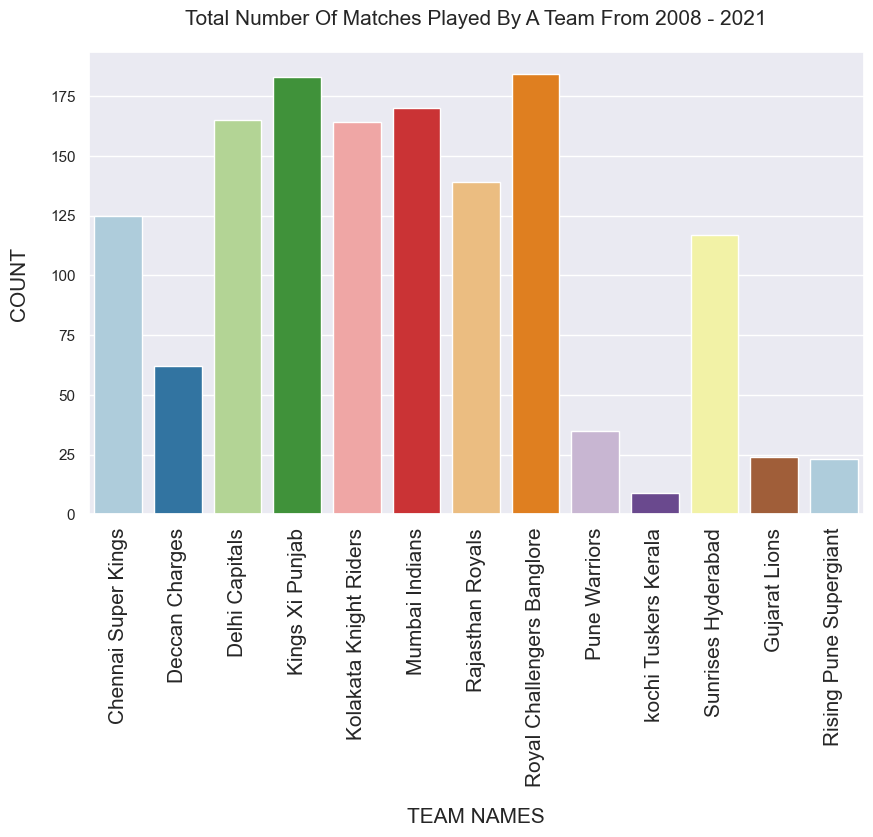

In [299]:
plt.figure(figsize=(10,6))
ax = sns.countplot(x='TEAMS', data=ipl_df,palette='Paired')
plt.title('Total Number Of Matches Played By A Team From 2008 - 2021',fontsize=15,pad=20)
plt.xlabel('TEAM NAMES',fontsize=15,labelpad =15)
plt.ylabel('COUNT',fontsize=15,labelpad=15)
plt.xticks(rotation = 90,fontsize=15)
#ax.figure.savefig("E:\\DATA SCIENCE\\Batch 91\\Projects\\team_overall.png")
ax.figure.tight_layout(pad = 40)
plt.show()

# What we can infer from this graph ?


- ### Royal Challengers Banglore and Kings Xi Punjab Has Played More Number of Matches In OVERALL SEASON ie. More than 175.


- ### Whereas Kochi Tuskers Kerala Has Played Less Number Of Matches.


                        

                             

                

## <font color = Orange><h1><center>Analysis On Which Team Has Participitated In Particular Season / Year</center></h1></font>

                        

<AxesSubplot:xlabel='TEAMS'>

Text(0.5, 1.0, 'Total Number Of Matches Played By A Team In One Season / Year')

Text(0.5, 0, 'TEAM NAMES')

Text(0, 0.5, 'COUNT')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
 [Text(0, 0, 'Chennai Super Kings'),
  Text(1, 0, 'Deccan Charges'),
  Text(2, 0, 'Delhi Capitals'),
  Text(3, 0, 'Gujarat Lions'),
  Text(4, 0, 'Kings Xi Punjab'),
  Text(5, 0, 'Kolakata Knight Riders'),
  Text(6, 0, 'Mumbai Indians'),
  Text(7, 0, 'Pune Warriors'),
  Text(8, 0, 'Rajasthan Royals'),
  Text(9, 0, 'Rising Pune Supergiant'),
  Text(10, 0, 'Royal Challengers Banglore'),
  Text(11, 0, 'Sunrises Hyderabad'),
  Text(12, 0, 'kochi Tuskers Kerala')])

(array([  0.,  25.,  50.,  75., 100., 125., 150., 175., 200.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

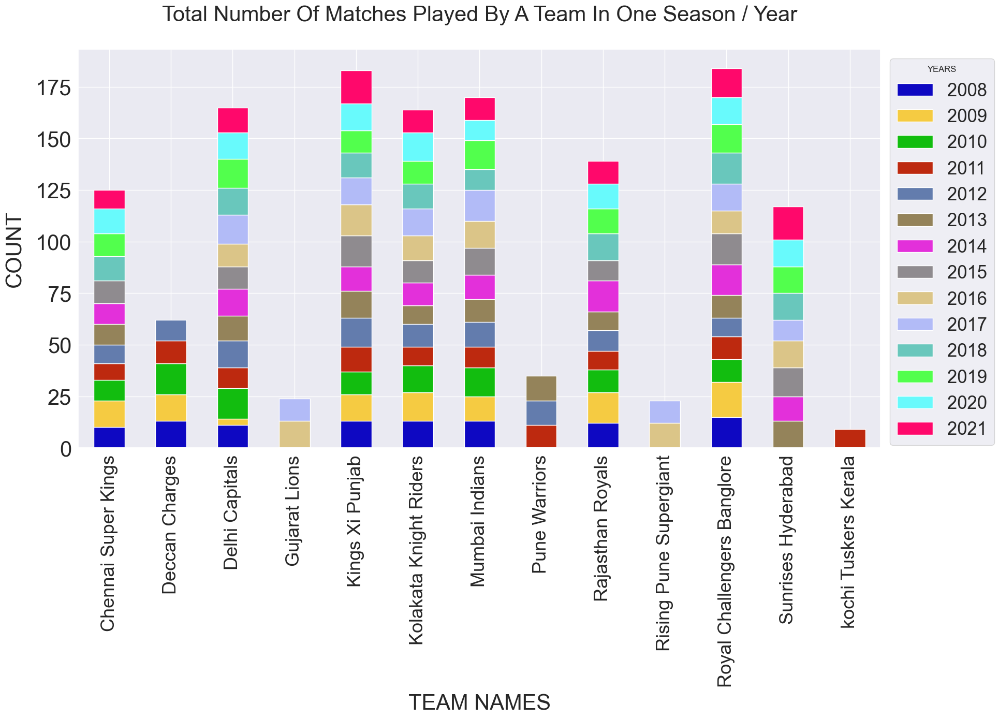

In [300]:

ax = pd.crosstab(ipl_df['TEAMS'], ipl_df['YEARS'])


ax.plot(figsize=(20,10),kind="bar",stacked=True,color=['#0e08c2','#f5cb42','#12bd0f','#bd290f','#637cad','#94835a','#e330da','#8f8b8f','#dbc588','#b2bbf7','#69c7bc','#52ff4d','#68fafc','#ff086b'])
plt.title('Total Number Of Matches Played By A Team In One Season / Year',fontsize=30,pad=40)
plt.xlabel('TEAM NAMES',fontsize=30,labelpad =10)
plt.ylabel('COUNT',fontsize=30,labelpad=15)
plt.xticks(rotation=90,fontsize=26)
plt.yticks(fontsize=30)
#plt.legend(bbox_to_anchor=(1,1),title="YEARS",)
plt.legend(title = 'YEARS', bbox_to_anchor = (1,1),fontsize=25)


# What we can infer from this graph ?


- ### Kings Xi Punjab & Kolkata Knight Riders & Mumbai Indians & Royal Challengers Banglore & Delhi Capitals has participitate in All the seasons.


- ### Whereas Kochi Tuskers Kerala had participitated only in One Season ie. in 2011 Season .


- ### Whereas Gujarat Lions & Rising Pune Supergaints had participitated in only two season ie. 2016 and 2017.


- ### Whereas Chennai Super Kings and Rajasthan Royals Has not participited in 2016 & 2017 Seasons .


- ### Whereas Deccan Charges has Appeared only in 5 Seasons ie. 2008 , 2009 , 2010 , 2011 , 2012 .


- ### Whereas Pune Warrirors India has Appeared only in 3 Seasons ie. 2011 , 2012 , 2013 .


- ### Whereas Sunrises Hyderabad has Appeared from 2013 Season Onwards.

                

            

                       
## <font color = #e80c5c><h1><center>BI-VARIATE AND MULTI-VARIATE ANALYSIS</center></h1></font>
                           

     
    
    

         

                

            

                       
### <font color = #e80c5c><h1><center>HISTOGRAM</center></h1></font>
                           

     
    
    

         

# Histogram On Matches And Innings

<Figure size 1500x800 with 0 Axes>

Text(0.5, 1.0, 'HISTOGRAM ON TOTAL NUMBER OF MATCHES')

Text(0.5, 0, 'MATCHES')

Text(0, 0.5, 'BATSMAN')

([<matplotlib.axis.XTick at 0x155b9b3fa30>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

([<matplotlib.axis.YTick at 0x155b9b2c9a0>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

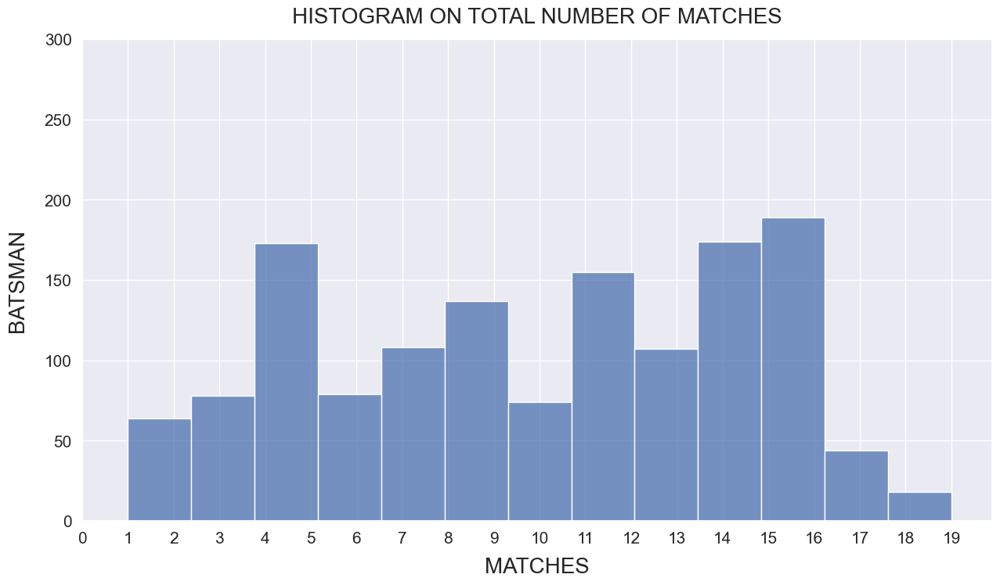

In [301]:
plt.figure(figsize=(15,8))

ax = sns.histplot(ipl_df["MATCHES"],kde=False)

plt.title('HISTOGRAM ON TOTAL NUMBER OF MATCHES',fontsize=20,pad=15)
plt.xlabel('MATCHES',fontsize=20,labelpad =10)
plt.ylabel('BATSMAN',fontsize=20,labelpad=15)


x_ticks = np.arange(0, 20, 1)
plt.xticks(x_ticks,fontsize=15)
y_ticks = np.arange(0, 350, 50)
plt.yticks(y_ticks,fontsize=15)

plt.show()

# What we can infer from this graph?

- ### More than 250 Batsman had played the 13 - 14 matches


- ### Around 220 Batsman had played the 4 - 5 matches


- ### Less number of batsman had played 17 - 19 matches


# Histogram On All The Remaining Features

<Figure size 1500x800 with 0 Axes>

<AxesSubplot:xlabel='MATCHES', ylabel='Count'>

<AxesSubplot:xlabel='MATCHES', ylabel='Count'>

Text(0.5, 1.0, 'HISTOGRAM ON MATCHES COLUMN AND INNINGS COLUMN')

Text(0.5, 0, 'MATCHES')

Text(0, 0.5, 'BATSMAN')

([<matplotlib.axis.XTick at 0x155b9d22730>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

([<matplotlib.axis.YTick at 0x155b9d29640>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

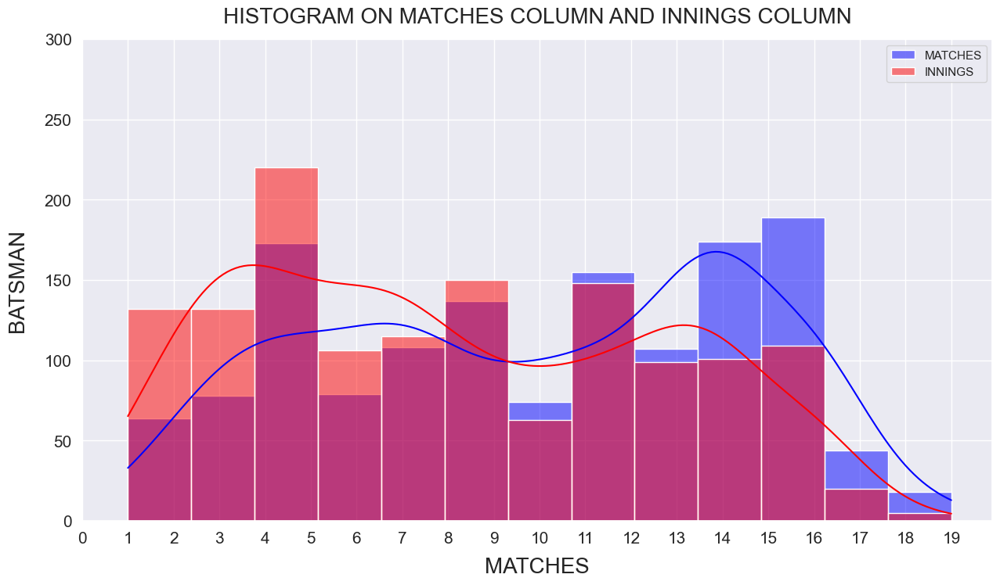

In [302]:
plt.figure(figsize=(15,8))
sns.set(style="darkgrid")
sns.histplot(data=ipl_df, x="MATCHES", color="blue", label="MATCHES", kde=True)
sns.histplot(data=ipl_df, x="INNINGS", color="red", label="INNINGS", kde=True)

plt.title('HISTOGRAM ON MATCHES COLUMN AND INNINGS COLUMN',fontsize=20,pad=15)
plt.xlabel('MATCHES',fontsize=20,labelpad =10)
plt.ylabel('BATSMAN',fontsize=20,labelpad=15)


x_ticks = np.arange(0, 20, 1)
plt.xticks(x_ticks,fontsize=15)
y_ticks = np.arange(0, 350, 50)
plt.yticks(y_ticks,fontsize=15)


plt.legend() 

# What we can infer from this graph?

- ### Around 240 Batsman had played the 4 to 5 innings 


- ### Around 140 Batsman had played the 11 to 12 innings


- ### Less number of batsman had played 17 - 19 innings


# Histogram On Runs and All Features

Text(0.5, 1.0, 'HISTOGRAM ON  MATCHES COLUMN')

Text(0.5, 0, 'MATCHES')

[Text(0.0, 0, '0.0'),
 Text(2.5, 0, '2.5'),
 Text(5.0, 0, '5.0'),
 Text(7.5, 0, '7.5'),
 Text(10.0, 0, '10.0'),
 Text(12.5, 0, '12.5'),
 Text(15.0, 0, '15.0'),
 Text(17.5, 0, '17.5'),
 Text(20.0, 0, '20.0')]

[Text(0, 0.0, '0.0'),
 Text(0, 25.0, '25.0'),
 Text(0, 50.0, '50.0'),
 Text(0, 75.0, '75.0'),
 Text(0, 100.0, '100.0'),
 Text(0, 125.0, '125.0'),
 Text(0, 150.0, '150.0'),
 Text(0, 175.0, '175.0'),
 Text(0, 200.0, '200.0')]

Text(0.5, 1.0, 'HISTOGRAM ON  INNINGS COLUMN')

Text(0.5, 0, 'INNINGS')

[Text(0.0, 0, '0.0'),
 Text(2.5, 0, '2.5'),
 Text(5.0, 0, '5.0'),
 Text(7.5, 0, '7.5'),
 Text(10.0, 0, '10.0'),
 Text(12.5, 0, '12.5'),
 Text(15.0, 0, '15.0'),
 Text(17.5, 0, '17.5'),
 Text(20.0, 0, '20.0')]

[Text(0, 0.0, '0.0'),
 Text(0, 50.0, '50.0'),
 Text(0, 100.0, '100.0'),
 Text(0, 150.0, '150.0'),
 Text(0, 200.0, '200.0'),
 Text(0, 250.0, '250.0')]

Text(0.5, 1.0, 'HISTOGRAM ON  HIGHEST SCORES COLUMN')

Text(0.5, 0, 'HIGHEST SCORES')

[Text(-25.0, 0, '-25.0'),
 Text(0.0, 0, '0.0'),
 Text(25.0, 0, '25.0'),
 Text(50.0, 0, '50.0'),
 Text(75.0, 0, '75.0'),
 Text(100.0, 0, '100.0'),
 Text(125.0, 0, '125.0'),
 Text(150.0, 0, '150.0'),
 Text(175.0, 0, '175.0'),
 Text(200.0, 0, '200.0')]

[Text(0, 0.0, '0.0'),
 Text(0, 25.0, '25.0'),
 Text(0, 50.0, '50.0'),
 Text(0, 75.0, '75.0'),
 Text(0, 100.0, '100.0'),
 Text(0, 125.0, '125.0'),
 Text(0, 150.0, '150.0'),
 Text(0, 175.0, '175.0'),
 Text(0, 200.0, '200.0')]

Text(0.5, 1.0, 'HISTOGRAM ON  BALLS FACED COLUMN')

Text(0.5, 0, 'BALLS FACED')

[Text(-100.0, 0, '-100.0'),
 Text(0.0, 0, '0.0'),
 Text(100.0, 0, '100.0'),
 Text(200.0, 0, '200.0'),
 Text(300.0, 0, '300.0'),
 Text(400.0, 0, '400.0'),
 Text(500.0, 0, '500.0'),
 Text(600.0, 0, '600.0'),
 Text(700.0, 0, '700.0')]

[Text(0, 0.0, '0.0'),
 Text(0, 50.0, '50.0'),
 Text(0, 100.0, '100.0'),
 Text(0, 150.0, '150.0'),
 Text(0, 200.0, '200.0'),
 Text(0, 250.0, '250.0'),
 Text(0, 300.0, '300.0'),
 Text(0, 350.0, '350.0')]

Text(0.5, 1.0, 'HISTOGRAM ON  NOT OUTS COLUMN')

Text(0.5, 0, 'NOT OUTS')

[Text(-2.0, 0, '-2.0'),
 Text(0.0, 0, '0.0'),
 Text(2.0, 0, '2.0'),
 Text(4.0, 0, '4.0'),
 Text(6.0, 0, '6.0'),
 Text(8.0, 0, '8.0'),
 Text(10.0, 0, '10.0'),
 Text(12.0, 0, '12.0')]

[Text(0, 0.0, '0.0'),
 Text(0, 50.0, '50.0'),
 Text(0, 100.0, '100.0'),
 Text(0, 150.0, '150.0'),
 Text(0, 200.0, '200.0'),
 Text(0, 250.0, '250.0'),
 Text(0, 300.0, '300.0'),
 Text(0, 350.0, '350.0'),
 Text(0, 400.0, '400.0'),
 Text(0, 450.0, '450.0')]

Text(0.5, 1.0, 'HISTOGRAM ON  OUTS COLUMN')

Text(0.5, 0, 'OUTS')

[Text(-2.5, 0, '-2.5'),
 Text(0.0, 0, '0.0'),
 Text(2.5, 0, '2.5'),
 Text(5.0, 0, '5.0'),
 Text(7.5, 0, '7.5'),
 Text(10.0, 0, '10.0'),
 Text(12.5, 0, '12.5'),
 Text(15.0, 0, '15.0'),
 Text(17.5, 0, '17.5'),
 Text(20.0, 0, '20.0')]

[Text(0, 0.0, '0.0'),
 Text(0, 25.0, '25.0'),
 Text(0, 50.0, '50.0'),
 Text(0, 75.0, '75.0'),
 Text(0, 100.0, '100.0'),
 Text(0, 125.0, '125.0'),
 Text(0, 150.0, '150.0'),
 Text(0, 175.0, '175.0'),
 Text(0, 200.0, '200.0')]

Text(0.5, 1.0, 'HISTOGRAM ON  AVERAGE COLUMN')

Text(0.5, 0, 'AVERAGE')

[Text(-10.0, 0, '-10.0'),
 Text(0.0, 0, '0.0'),
 Text(10.0, 0, '10.0'),
 Text(20.0, 0, '20.0'),
 Text(30.0, 0, '30.0'),
 Text(40.0, 0, '40.0'),
 Text(50.0, 0, '50.0'),
 Text(60.0, 0, '60.0'),
 Text(70.0, 0, '70.0')]

[Text(0, 0.0, '0.0'),
 Text(0, 20.0, '20.0'),
 Text(0, 40.0, '40.0'),
 Text(0, 60.0, '60.0'),
 Text(0, 80.0, '80.0'),
 Text(0, 100.0, '100.0'),
 Text(0, 120.0, '120.0'),
 Text(0, 140.0, '140.0'),
 Text(0, 160.0, '160.0')]

Text(0.5, 1.0, 'HISTOGRAM ON  STRIKE RATE COLUMN')

Text(0.5, 0, 'STRIKE RATE')

[Text(0.0, 0, '0.0'),
 Text(50.0, 0, '50.0'),
 Text(100.0, 0, '100.0'),
 Text(150.0, 0, '150.0'),
 Text(200.0, 0, '200.0'),
 Text(250.0, 0, '250.0'),
 Text(300.0, 0, '300.0'),
 Text(350.0, 0, '350.0')]

[Text(0, 0.0, '0.0'),
 Text(0, 20.0, '20.0'),
 Text(0, 40.0, '40.0'),
 Text(0, 60.0, '60.0'),
 Text(0, 80.0, '80.0'),
 Text(0, 100.0, '100.0'),
 Text(0, 120.0, '120.0'),
 Text(0, 140.0, '140.0')]

Text(0.5, 1.0, 'HISTOGRAM ON  HUNDREDS COLUMN')

Text(0.5, 0, 'HUNDREDS')

[Text(-0.5, 0, '-0.5'),
 Text(0.0, 0, '0.0'),
 Text(0.5, 0, '0.5'),
 Text(1.0, 0, '1.0'),
 Text(1.5, 0, '1.5'),
 Text(2.0, 0, '2.0'),
 Text(2.5, 0, '2.5'),
 Text(3.0, 0, '3.0'),
 Text(3.5, 0, '3.5'),
 Text(4.0, 0, '4.0'),
 Text(4.5, 0, '4.5')]

[Text(0, 0.0, '0.0'),
 Text(0, 500.0, '500.0'),
 Text(0, 1000.0, '1000.0'),
 Text(0, 1500.0, '1500.0'),
 Text(0, 2000.0, '2000.0'),
 Text(0, 2500.0, '2500.0'),
 Text(0, 3000.0, '3000.0'),
 Text(0, 3500.0, '3500.0')]

Text(0.5, 1.0, 'HISTOGRAM ON  FIFTY COLUMN')

Text(0.5, 0, 'FIFTY')

[Text(-2.0, 0, '-2.0'),
 Text(0.0, 0, '0.0'),
 Text(2.0, 0, '2.0'),
 Text(4.0, 0, '4.0'),
 Text(6.0, 0, '6.0'),
 Text(8.0, 0, '8.0'),
 Text(10.0, 0, '10.0')]

[Text(0, 0.0, '0.0'),
 Text(0, 100.0, '100.0'),
 Text(0, 200.0, '200.0'),
 Text(0, 300.0, '300.0'),
 Text(0, 400.0, '400.0'),
 Text(0, 500.0, '500.0'),
 Text(0, 600.0, '600.0'),
 Text(0, 700.0, '700.0'),
 Text(0, 800.0, '800.0'),
 Text(0, 900.0, '900.0')]

Text(0.5, 1.0, 'HISTOGRAM ON  FOURS COLUMN')

Text(0.5, 0, 'FOURS')

[Text(-20.0, 0, '-20.0'),
 Text(0.0, 0, '0.0'),
 Text(20.0, 0, '20.0'),
 Text(40.0, 0, '40.0'),
 Text(60.0, 0, '60.0'),
 Text(80.0, 0, '80.0'),
 Text(100.0, 0, '100.0')]

[Text(0, 0.0, '0.0'),
 Text(0, 50.0, '50.0'),
 Text(0, 100.0, '100.0'),
 Text(0, 150.0, '150.0'),
 Text(0, 200.0, '200.0'),
 Text(0, 250.0, '250.0'),
 Text(0, 300.0, '300.0'),
 Text(0, 350.0, '350.0'),
 Text(0, 400.0, '400.0')]

Text(0.5, 1.0, 'HISTOGRAM ON  SIXES COLUMN')

Text(0.5, 0, 'SIXES')

[Text(-10.0, 0, '-10.0'),
 Text(0.0, 0, '0.0'),
 Text(10.0, 0, '10.0'),
 Text(20.0, 0, '20.0'),
 Text(30.0, 0, '30.0'),
 Text(40.0, 0, '40.0'),
 Text(50.0, 0, '50.0'),
 Text(60.0, 0, '60.0'),
 Text(70.0, 0, '70.0')]

[Text(0, 0.0, '0.0'),
 Text(0, 50.0, '50.0'),
 Text(0, 100.0, '100.0'),
 Text(0, 150.0, '150.0'),
 Text(0, 200.0, '200.0'),
 Text(0, 250.0, '250.0'),
 Text(0, 300.0, '300.0'),
 Text(0, 350.0, '350.0'),
 Text(0, 400.0, '400.0'),
 Text(0, 450.0, '450.0')]

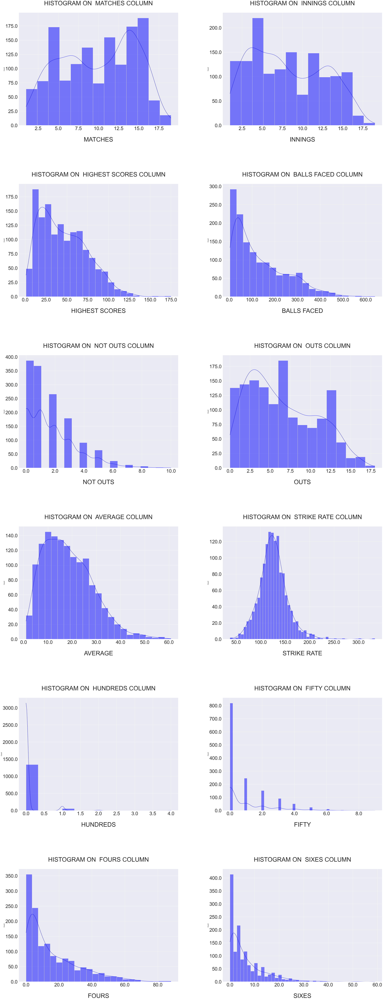

In [303]:
colors = ['Blues','Reds','Greens','Oranges','Blues','Reds','Greens','Oranges','Blues','Reds','Greens','Oranges']
independent = ['MATCHES','INNINGS','HIGHEST SCORES','BALLS FACED','NOT OUTS','OUTS','AVERAGE','STRIKE RATE','HUNDREDS','FIFTY','FOURS','SIXES']


nr_rows = 6
nr_cols = 2

fig, axs = plt.subplots(nr_rows, nr_cols, figsize=(50,120),constrained_layout=False)


for r in range(0,nr_rows):
    for c in range(0,nr_cols):
        i = r*nr_cols+c
    
        if i < len(independent):   
            
            ax = sns.set(style="darkgrid")           
            
            ax = sns.histplot(data=ipl_df, x=independent[i], color="blue", label=independent[i], kde=True,ax = axs[r][c])
            
            
            ax.set_title('HISTOGRAM ON ' + ' ' + independent[i] + ' ' + 'COLUMN',size=50,pad = 60 )
                    
            ax.set_xlabel(independent[i], fontsize = 50 , labelpad = 50)            
                    
            ax.set_xticklabels(ax.get_xticks(), size = 40)
            ax.set_yticklabels(ax.get_yticks(), size = 40)
                           
fig.tight_layout(pad = 20)
   
plt.show()

# What we can infer from above all the graphs ?


- ### Histogram on innings :-

    - ### Around 240 Batsman has played the innings from 4 - 5 .
    - ### Around 10 - 15 Batsman has Played the innings from 17 - 18 .
    
    
- ### Histogram on Highest Scores :-

    - ### More than 175 Batsman has scored highest runs from 10 -20 .
    - ### Around 100 Batsman has scored Fifty.
    - ### Around 25 Batsman has scored Century.
    - ### Less Number of Batsman are there who have scored more than 100 runs.


                

            

                       
## <font color = #e80c5c><h1><center>BOX PLOT</center></h1></font>
                           

     
    
    

         

# BOX PLOT ON RUNS

<Figure size 1500x500 with 0 Axes>

<AxesSubplot:xlabel='RUNS'>

Text(0.5, 1.0, 'BOX PLOT ON RUNS COLUMN')

Text(0.5, 0, 'RUNS')

([<matplotlib.axis.XTick at 0x155b9dd2940>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


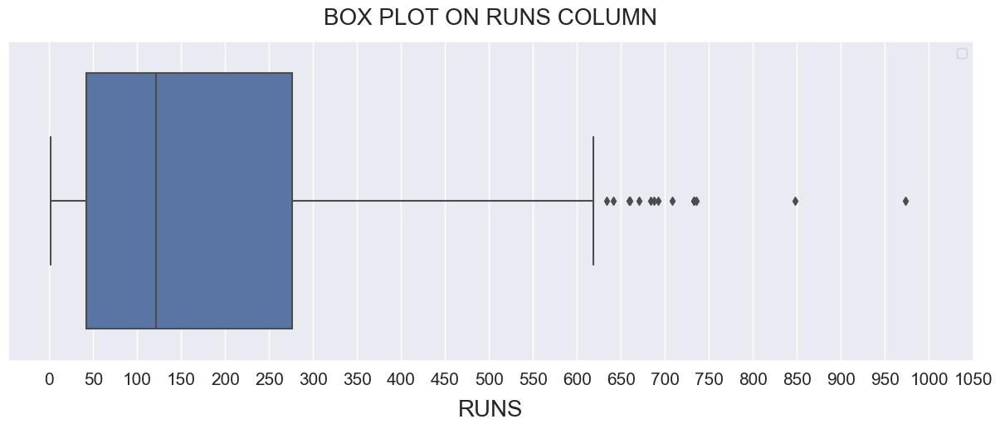

In [304]:
plt.figure(figsize=(15,5))
sns.set(style="darkgrid")



sns.boxplot(ipl_df["RUNS"])


plt.title('BOX PLOT ON RUNS COLUMN',fontsize=20,pad=15)
plt.xlabel('RUNS',fontsize=20,labelpad =10)


x_ticks = np.arange(0, 1100, 50)
plt.xticks(x_ticks,fontsize=15)

plt.legend() 

# What we can infer from the graph ?


### - While building Machine Learning Model Handling Outliers is the most important task.


### - As we can see above 610 runs ,  Dots is present in the graph which represents the outliers.

# BOX PLOT ON RUNS AND ALL FEATURES

Text(0.5, 1.0, 'SCATTER PLOT ON RUNS AND MATCHES COLUMN')

Text(0.5, 0, 'MATCHES')

[Text(0.0, 0, '0.0'),
 Text(2.5, 0, '2.5'),
 Text(5.0, 0, '5.0'),
 Text(7.5, 0, '7.5'),
 Text(10.0, 0, '10.0'),
 Text(12.5, 0, '12.5'),
 Text(15.0, 0, '15.0'),
 Text(17.5, 0, '17.5'),
 Text(20.0, 0, '20.0')]

Text(0.5, 1.0, 'SCATTER PLOT ON RUNS AND INNINGS COLUMN')

Text(0.5, 0, 'INNINGS')

[Text(0.0, 0, '0.0'),
 Text(2.5, 0, '2.5'),
 Text(5.0, 0, '5.0'),
 Text(7.5, 0, '7.5'),
 Text(10.0, 0, '10.0'),
 Text(12.5, 0, '12.5'),
 Text(15.0, 0, '15.0'),
 Text(17.5, 0, '17.5'),
 Text(20.0, 0, '20.0')]

Text(0.5, 1.0, 'SCATTER PLOT ON RUNS AND HIGHEST SCORES COLUMN')

Text(0.5, 0, 'HIGHEST SCORES')

[Text(-25.0, 0, '-25.0'),
 Text(0.0, 0, '0.0'),
 Text(25.0, 0, '25.0'),
 Text(50.0, 0, '50.0'),
 Text(75.0, 0, '75.0'),
 Text(100.0, 0, '100.0'),
 Text(125.0, 0, '125.0'),
 Text(150.0, 0, '150.0'),
 Text(175.0, 0, '175.0'),
 Text(200.0, 0, '200.0')]

Text(0.5, 1.0, 'SCATTER PLOT ON RUNS AND BALLS FACED COLUMN')

Text(0.5, 0, 'BALLS FACED')

[Text(-100.0, 0, '-100.0'),
 Text(0.0, 0, '0.0'),
 Text(100.0, 0, '100.0'),
 Text(200.0, 0, '200.0'),
 Text(300.0, 0, '300.0'),
 Text(400.0, 0, '400.0'),
 Text(500.0, 0, '500.0'),
 Text(600.0, 0, '600.0'),
 Text(700.0, 0, '700.0')]

Text(0.5, 1.0, 'SCATTER PLOT ON RUNS AND NOT OUTS COLUMN')

Text(0.5, 0, 'NOT OUTS')

[Text(-2.0, 0, '-2.0'),
 Text(0.0, 0, '0.0'),
 Text(2.0, 0, '2.0'),
 Text(4.0, 0, '4.0'),
 Text(6.0, 0, '6.0'),
 Text(8.0, 0, '8.0'),
 Text(10.0, 0, '10.0'),
 Text(12.0, 0, '12.0')]

Text(0.5, 1.0, 'SCATTER PLOT ON RUNS AND OUTS COLUMN')

Text(0.5, 0, 'OUTS')

[Text(-2.5, 0, '-2.5'),
 Text(0.0, 0, '0.0'),
 Text(2.5, 0, '2.5'),
 Text(5.0, 0, '5.0'),
 Text(7.5, 0, '7.5'),
 Text(10.0, 0, '10.0'),
 Text(12.5, 0, '12.5'),
 Text(15.0, 0, '15.0'),
 Text(17.5, 0, '17.5'),
 Text(20.0, 0, '20.0')]

Text(0.5, 1.0, 'SCATTER PLOT ON RUNS AND AVERAGE COLUMN')

Text(0.5, 0, 'AVERAGE')

[Text(-10.0, 0, '-10.0'),
 Text(0.0, 0, '0.0'),
 Text(10.0, 0, '10.0'),
 Text(20.0, 0, '20.0'),
 Text(30.0, 0, '30.0'),
 Text(40.0, 0, '40.0'),
 Text(50.0, 0, '50.0'),
 Text(60.0, 0, '60.0'),
 Text(70.0, 0, '70.0')]

Text(0.5, 1.0, 'SCATTER PLOT ON RUNS AND STRIKE RATE COLUMN')

Text(0.5, 0, 'STRIKE RATE')

[Text(0.0, 0, '0.0'),
 Text(50.0, 0, '50.0'),
 Text(100.0, 0, '100.0'),
 Text(150.0, 0, '150.0'),
 Text(200.0, 0, '200.0'),
 Text(250.0, 0, '250.0'),
 Text(300.0, 0, '300.0'),
 Text(350.0, 0, '350.0')]

Text(0.5, 1.0, 'SCATTER PLOT ON RUNS AND HUNDREDS COLUMN')

Text(0.5, 0, 'HUNDREDS')

[Text(-0.5, 0, '-0.5'),
 Text(0.0, 0, '0.0'),
 Text(0.5, 0, '0.5'),
 Text(1.0, 0, '1.0'),
 Text(1.5, 0, '1.5'),
 Text(2.0, 0, '2.0'),
 Text(2.5, 0, '2.5'),
 Text(3.0, 0, '3.0'),
 Text(3.5, 0, '3.5'),
 Text(4.0, 0, '4.0'),
 Text(4.5, 0, '4.5')]

Text(0.5, 1.0, 'SCATTER PLOT ON RUNS AND FIFTY COLUMN')

Text(0.5, 0, 'FIFTY')

[Text(-2.0, 0, '-2.0'),
 Text(0.0, 0, '0.0'),
 Text(2.0, 0, '2.0'),
 Text(4.0, 0, '4.0'),
 Text(6.0, 0, '6.0'),
 Text(8.0, 0, '8.0'),
 Text(10.0, 0, '10.0')]

Text(0.5, 1.0, 'SCATTER PLOT ON RUNS AND FOURS COLUMN')

Text(0.5, 0, 'FOURS')

[Text(-20.0, 0, '-20.0'),
 Text(0.0, 0, '0.0'),
 Text(20.0, 0, '20.0'),
 Text(40.0, 0, '40.0'),
 Text(60.0, 0, '60.0'),
 Text(80.0, 0, '80.0'),
 Text(100.0, 0, '100.0')]

Text(0.5, 1.0, 'SCATTER PLOT ON RUNS AND SIXES COLUMN')

Text(0.5, 0, 'SIXES')

[Text(-10.0, 0, '-10.0'),
 Text(0.0, 0, '0.0'),
 Text(10.0, 0, '10.0'),
 Text(20.0, 0, '20.0'),
 Text(30.0, 0, '30.0'),
 Text(40.0, 0, '40.0'),
 Text(50.0, 0, '50.0'),
 Text(60.0, 0, '60.0'),
 Text(70.0, 0, '70.0')]

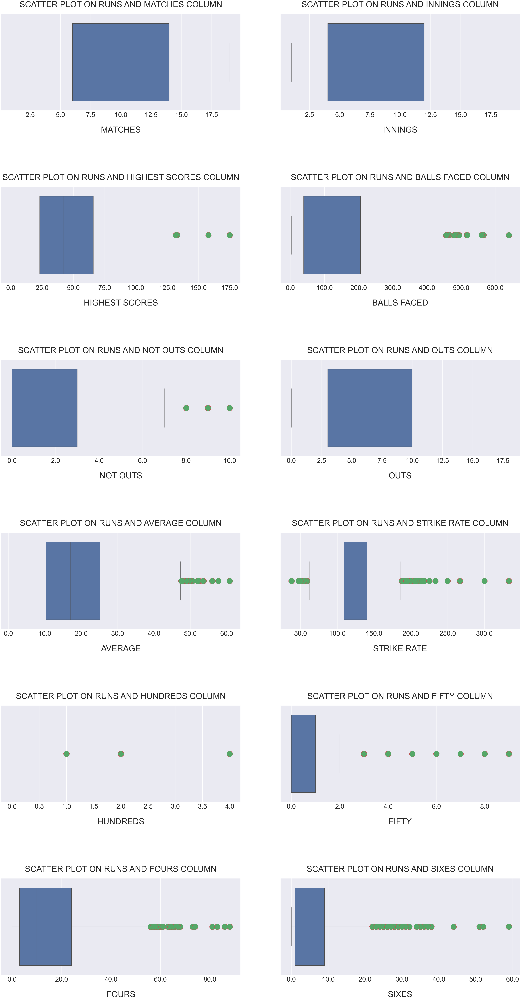

In [305]:
colors = ['Blues','Reds','Greens','Oranges','Blues','Reds','Greens','Oranges','Blues','Reds','Greens','Oranges']
independent = ['MATCHES','INNINGS','HIGHEST SCORES','BALLS FACED','NOT OUTS','OUTS','AVERAGE','STRIKE RATE','HUNDREDS','FIFTY','FOURS','SIXES']


nr_rows = 6
nr_cols = 2

fig, axs = plt.subplots(nr_rows, nr_cols, figsize=(50,90),constrained_layout=False)


for r in range(0,nr_rows):
    for c in range(0,nr_cols):
        i = r*nr_cols+c
    
        if i < len(independent):   
            
            ax = sns.set(style="darkgrid")
            
            flierprops = dict(marker='.', markerfacecolor='g', markersize=70,linestyle='none', markeredgecolor='r')
            
            ax = sns.boxplot(ipl_df[independent[i]],ax = axs[r][c],flierprops=flierprops)            
            
            ax.set_title('SCATTER PLOT ON RUNS AND' + ' ' + independent[i] + ' ' + 'COLUMN',size=50,pad = 40 )
                    
            ax.set_xlabel(independent[i], fontsize = 50 , labelpad = 50)            
           
            ax.set_xticklabels(ax.get_xticks(), size = 40)
                           
fig.tight_layout(pad = 20)
   
plt.show()

# What we can infer from the graph ?


- ### In Matches , Innings and Outs columns no outliers are present.


- ### In Highest Scores column more than 128 runs outliers are present.


- ### In Balls Faced column more than 450 balls outliers are present.


- ### In Not Outs column after 7 outliers are present.


- ### In Average column more than 48 average outliers are present.


- ### In Strike Rate column less than 50 strike rate and more than 180 strike rate outliers are present.


- ### In Hundreds column all are outliers.


- ### In Fifty column more than 2 fifty outliers are present.


- ### In Fours column more than 55 fours outliers are present.


- ### In Sixes column after more than 21 sixes outliers are present.



                

            

                       
## <font color = #e80c5c><h1><center>SCATTER PLOT</center></h1></font>
                           

     
    
    

         

# SCATTER PLOT ON RUNS AND BALLS FACED

### In ipl dataset Runs is the target variable and remaining are independent variables.
### So lets check the correlation between each individual independent variable with target variable.
### The range of linear correlation is between -1 to 1 .
### - 0.98 means ---- Strongly Negative Correlated.
### + 0.98 means ---- Strongly Positive Correlated.

<Figure size 1500x800 with 0 Axes>

<AxesSubplot:xlabel='RUNS', ylabel='BALLS FACED'>

Text(0.5, 1.0, 'SCATTER PLOT ON RUNS AND BALLS FACED COLUMN\n\nRUNS AND BALLS FACED ARE STRONGLY POSITIVE CORRELATED (0.98)')

Text(0.5, 0, 'RUNS AND BALLS FACED')

Text(0, 0.5, 'BALLS FACED')

([<matplotlib.axis.XTick at 0x155b9c85550>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

([<matplotlib.axis.YTick at 0x155b9c856d0>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


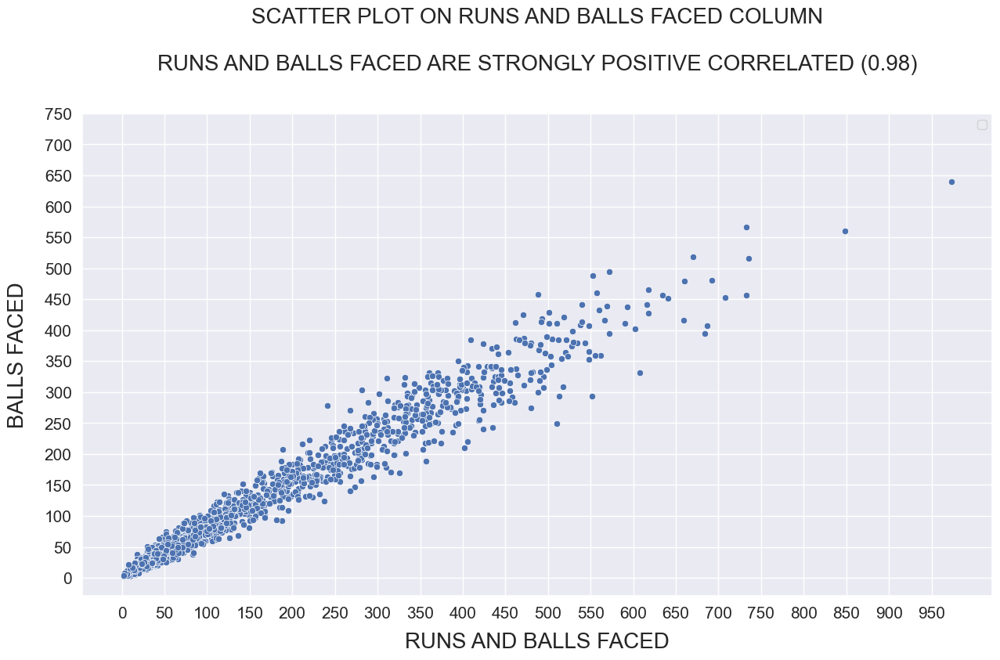

In [306]:
plt.figure(figsize=(15,8))
sns.set(style="darkgrid")


sns.scatterplot(ipl_df["RUNS"],ipl_df["BALLS FACED"])

a = ipl_df["RUNS"].corr(ipl_df['BALLS FACED'])          
            
if a >= 0.70 and a <= 0.99:
    t = 'RUNS AND BALLS FACED ARE STRONGLY POSITIVE CORRELATED'.format(independent[i])
elif a >= 0.50 and a < 0.70:
    t = 'RUNS AND BALLS FACED ARE WEAKLY POSITIVE CORRELATED'.format(independent[i])
elif a <= 0.40 and a == 0.01:
    t = 'RUNS AND BALLS FACED ARE SOMEHOW POSITIVE CORRELATED'.format(independent[i])


plt.title('SCATTER PLOT ON RUNS AND BALLS FACED COLUMN' + '\n' + '\n' + t + ' ' + '(' + '{:.2f}'.format(a) + ')',size=20,pad = 40 )

plt.xlabel('RUNS AND BALLS FACED',fontsize=20,labelpad =10)
plt.ylabel('BALLS FACED',fontsize=20,labelpad=15)


x_ticks = np.arange(0, 1000, 50)
plt.xticks(x_ticks,fontsize=15)


y_ticks = np.arange(0, 800, 50)
plt.yticks(y_ticks,fontsize=15)


plt.legend()

# Whar we can infer from the above graph ?

- ### Runs and Balls Faced are Strongly Positive correlated. It means it is the important feature.

# SCATTER PLOT ON RUNS AND ALL FEATURES

In [307]:
# This is how we calculate correlation programatically

ipl_df["RUNS"].corr(ipl_df["NOT OUTS"])

0.18896258171204552

Text(0.5, 1.0, 'SCATTER PLOT ON RUNS AND MATCHES COLUMN\n\nRUNS AND MATCHES ARE WEAKLY POSITIVE CORRELATED (0.63)')

Text(0, 0.5, 'MATCHES')

Text(0.5, 0, 'RUNS')

[Text(0, 0.0, '0.0'),
 Text(0, 2.5, '2.5'),
 Text(0, 5.0, '5.0'),
 Text(0, 7.5, '7.5'),
 Text(0, 10.0, '10.0'),
 Text(0, 12.5, '12.5'),
 Text(0, 15.0, '15.0'),
 Text(0, 17.5, '17.5'),
 Text(0, 20.0, '20.0')]

[Text(-200.0, 0, '-200.0'),
 Text(0.0, 0, '0.0'),
 Text(200.0, 0, '200.0'),
 Text(400.0, 0, '400.0'),
 Text(600.0, 0, '600.0'),
 Text(800.0, 0, '800.0'),
 Text(1000.0, 0, '1000.0'),
 Text(1200.0, 0, '1200.0')]

Text(0.5, 1.0, 'SCATTER PLOT ON RUNS AND INNINGS COLUMN\n\nRUNS AND INNINGS ARE STRONGLY POSITIVE CORRELATED (0.85)')

Text(0, 0.5, 'INNINGS')

Text(0.5, 0, 'RUNS')

[Text(0, 0.0, '0.0'),
 Text(0, 2.5, '2.5'),
 Text(0, 5.0, '5.0'),
 Text(0, 7.5, '7.5'),
 Text(0, 10.0, '10.0'),
 Text(0, 12.5, '12.5'),
 Text(0, 15.0, '15.0'),
 Text(0, 17.5, '17.5'),
 Text(0, 20.0, '20.0')]

[Text(-200.0, 0, '-200.0'),
 Text(0.0, 0, '0.0'),
 Text(200.0, 0, '200.0'),
 Text(400.0, 0, '400.0'),
 Text(600.0, 0, '600.0'),
 Text(800.0, 0, '800.0'),
 Text(1000.0, 0, '1000.0'),
 Text(1200.0, 0, '1200.0')]

Text(0.5, 1.0, 'SCATTER PLOT ON RUNS AND HIGHEST SCORES COLUMN\n\nRUNS AND HIGHEST SCORES ARE STRONGLY POSITIVE CORRELATED (0.84)')

Text(0, 0.5, 'HIGHEST SCORES')

Text(0.5, 0, 'RUNS')

[Text(0, -25.0, '-25.0'),
 Text(0, 0.0, '0.0'),
 Text(0, 25.0, '25.0'),
 Text(0, 50.0, '50.0'),
 Text(0, 75.0, '75.0'),
 Text(0, 100.0, '100.0'),
 Text(0, 125.0, '125.0'),
 Text(0, 150.0, '150.0'),
 Text(0, 175.0, '175.0'),
 Text(0, 200.0, '200.0')]

[Text(-200.0, 0, '-200.0'),
 Text(0.0, 0, '0.0'),
 Text(200.0, 0, '200.0'),
 Text(400.0, 0, '400.0'),
 Text(600.0, 0, '600.0'),
 Text(800.0, 0, '800.0'),
 Text(1000.0, 0, '1000.0'),
 Text(1200.0, 0, '1200.0')]

Text(0.5, 1.0, 'SCATTER PLOT ON RUNS AND BALLS FACED COLUMN\n\nRUNS AND BALLS FACED ARE STRONGLY POSITIVE CORRELATED (0.98)')

Text(0, 0.5, 'BALLS FACED')

Text(0.5, 0, 'RUNS')

[Text(0, -100.0, '-100.0'),
 Text(0, 0.0, '0.0'),
 Text(0, 100.0, '100.0'),
 Text(0, 200.0, '200.0'),
 Text(0, 300.0, '300.0'),
 Text(0, 400.0, '400.0'),
 Text(0, 500.0, '500.0'),
 Text(0, 600.0, '600.0'),
 Text(0, 700.0, '700.0')]

[Text(-200.0, 0, '-200.0'),
 Text(0.0, 0, '0.0'),
 Text(200.0, 0, '200.0'),
 Text(400.0, 0, '400.0'),
 Text(600.0, 0, '600.0'),
 Text(800.0, 0, '800.0'),
 Text(1000.0, 0, '1000.0'),
 Text(1200.0, 0, '1200.0')]

Text(0.5, 1.0, 'SCATTER PLOT ON RUNS AND NOT OUTS COLUMN\n\nRUNS AND NOT OUTS ARE SOMEHOW POSITIVE CORRELATED (0.19)')

Text(0, 0.5, 'NOT OUTS')

Text(0.5, 0, 'RUNS')

[Text(0, -2.0, '-2.0'),
 Text(0, 0.0, '0.0'),
 Text(0, 2.0, '2.0'),
 Text(0, 4.0, '4.0'),
 Text(0, 6.0, '6.0'),
 Text(0, 8.0, '8.0'),
 Text(0, 10.0, '10.0'),
 Text(0, 12.0, '12.0')]

[Text(-200.0, 0, '-200.0'),
 Text(0.0, 0, '0.0'),
 Text(200.0, 0, '200.0'),
 Text(400.0, 0, '400.0'),
 Text(600.0, 0, '600.0'),
 Text(800.0, 0, '800.0'),
 Text(1000.0, 0, '1000.0'),
 Text(1200.0, 0, '1200.0')]

Text(0.5, 1.0, 'SCATTER PLOT ON RUNS AND OUTS COLUMN\n\nRUNS AND OUTS ARE STRONGLY POSITIVE CORRELATED (0.84)')

Text(0, 0.5, 'OUTS')

Text(0.5, 0, 'RUNS')

[Text(0, -2.5, '-2.5'),
 Text(0, 0.0, '0.0'),
 Text(0, 2.5, '2.5'),
 Text(0, 5.0, '5.0'),
 Text(0, 7.5, '7.5'),
 Text(0, 10.0, '10.0'),
 Text(0, 12.5, '12.5'),
 Text(0, 15.0, '15.0'),
 Text(0, 17.5, '17.5'),
 Text(0, 20.0, '20.0')]

[Text(-200.0, 0, '-200.0'),
 Text(0.0, 0, '0.0'),
 Text(200.0, 0, '200.0'),
 Text(400.0, 0, '400.0'),
 Text(600.0, 0, '600.0'),
 Text(800.0, 0, '800.0'),
 Text(1000.0, 0, '1000.0'),
 Text(1200.0, 0, '1200.0')]

Text(0.5, 1.0, 'SCATTER PLOT ON RUNS AND AVERAGE COLUMN\n\nRUNS AND AVERAGE ARE STRONGLY POSITIVE CORRELATED (0.81)')

Text(0, 0.5, 'AVERAGE')

Text(0.5, 0, 'RUNS')

[Text(0, -10.0, '-10.0'),
 Text(0, 0.0, '0.0'),
 Text(0, 10.0, '10.0'),
 Text(0, 20.0, '20.0'),
 Text(0, 30.0, '30.0'),
 Text(0, 40.0, '40.0'),
 Text(0, 50.0, '50.0'),
 Text(0, 60.0, '60.0'),
 Text(0, 70.0, '70.0')]

[Text(-200.0, 0, '-200.0'),
 Text(0.0, 0, '0.0'),
 Text(200.0, 0, '200.0'),
 Text(400.0, 0, '400.0'),
 Text(600.0, 0, '600.0'),
 Text(800.0, 0, '800.0'),
 Text(1000.0, 0, '1000.0'),
 Text(1200.0, 0, '1200.0')]

Text(0.5, 1.0, 'SCATTER PLOT ON RUNS AND STRIKE RATE COLUMN\n\nRUNS AND STRIKE RATE ARE SOMEHOW POSITIVE CORRELATED (0.28)')

Text(0, 0.5, 'STRIKE RATE')

Text(0.5, 0, 'RUNS')

[Text(0, 0.0, '0.0'),
 Text(0, 50.0, '50.0'),
 Text(0, 100.0, '100.0'),
 Text(0, 150.0, '150.0'),
 Text(0, 200.0, '200.0'),
 Text(0, 250.0, '250.0'),
 Text(0, 300.0, '300.0'),
 Text(0, 350.0, '350.0')]

[Text(-200.0, 0, '-200.0'),
 Text(0.0, 0, '0.0'),
 Text(200.0, 0, '200.0'),
 Text(400.0, 0, '400.0'),
 Text(600.0, 0, '600.0'),
 Text(800.0, 0, '800.0'),
 Text(1000.0, 0, '1000.0'),
 Text(1200.0, 0, '1200.0')]

Text(0.5, 1.0, 'SCATTER PLOT ON RUNS AND HUNDREDS COLUMN\n\nRUNS AND HUNDREDS ARE SOMEHOW POSITIVE CORRELATED (0.37)')

Text(0, 0.5, 'HUNDREDS')

Text(0.5, 0, 'RUNS')

[Text(0, -0.5, '-0.5'),
 Text(0, 0.0, '0.0'),
 Text(0, 0.5, '0.5'),
 Text(0, 1.0, '1.0'),
 Text(0, 1.5, '1.5'),
 Text(0, 2.0, '2.0'),
 Text(0, 2.5, '2.5'),
 Text(0, 3.0, '3.0'),
 Text(0, 3.5, '3.5'),
 Text(0, 4.0, '4.0'),
 Text(0, 4.5, '4.5')]

[Text(-200.0, 0, '-200.0'),
 Text(0.0, 0, '0.0'),
 Text(200.0, 0, '200.0'),
 Text(400.0, 0, '400.0'),
 Text(600.0, 0, '600.0'),
 Text(800.0, 0, '800.0'),
 Text(1000.0, 0, '1000.0'),
 Text(1200.0, 0, '1200.0')]

Text(0.5, 1.0, 'SCATTER PLOT ON RUNS AND FIFTY COLUMN\n\nRUNS AND FIFTY ARE STRONGLY POSITIVE CORRELATED (0.87)')

Text(0, 0.5, 'FIFTY')

Text(0.5, 0, 'RUNS')

[Text(0, -2.0, '-2.0'),
 Text(0, 0.0, '0.0'),
 Text(0, 2.0, '2.0'),
 Text(0, 4.0, '4.0'),
 Text(0, 6.0, '6.0'),
 Text(0, 8.0, '8.0'),
 Text(0, 10.0, '10.0')]

[Text(-200.0, 0, '-200.0'),
 Text(0.0, 0, '0.0'),
 Text(200.0, 0, '200.0'),
 Text(400.0, 0, '400.0'),
 Text(600.0, 0, '600.0'),
 Text(800.0, 0, '800.0'),
 Text(1000.0, 0, '1000.0'),
 Text(1200.0, 0, '1200.0')]

Text(0.5, 1.0, 'SCATTER PLOT ON RUNS AND FOURS COLUMN\n\nRUNS AND FOURS ARE STRONGLY POSITIVE CORRELATED (0.95)')

Text(0, 0.5, 'FOURS')

Text(0.5, 0, 'RUNS')

[Text(0, -20.0, '-20.0'),
 Text(0, 0.0, '0.0'),
 Text(0, 20.0, '20.0'),
 Text(0, 40.0, '40.0'),
 Text(0, 60.0, '60.0'),
 Text(0, 80.0, '80.0'),
 Text(0, 100.0, '100.0')]

[Text(-200.0, 0, '-200.0'),
 Text(0.0, 0, '0.0'),
 Text(200.0, 0, '200.0'),
 Text(400.0, 0, '400.0'),
 Text(600.0, 0, '600.0'),
 Text(800.0, 0, '800.0'),
 Text(1000.0, 0, '1000.0'),
 Text(1200.0, 0, '1200.0')]

Text(0.5, 1.0, 'SCATTER PLOT ON RUNS AND SIXES COLUMN\n\nRUNS AND SIXES ARE STRONGLY POSITIVE CORRELATED (0.83)')

Text(0, 0.5, 'SIXES')

Text(0.5, 0, 'RUNS')

[Text(0, -10.0, '-10.0'),
 Text(0, 0.0, '0.0'),
 Text(0, 10.0, '10.0'),
 Text(0, 20.0, '20.0'),
 Text(0, 30.0, '30.0'),
 Text(0, 40.0, '40.0'),
 Text(0, 50.0, '50.0'),
 Text(0, 60.0, '60.0'),
 Text(0, 70.0, '70.0')]

[Text(-200.0, 0, '-200.0'),
 Text(0.0, 0, '0.0'),
 Text(200.0, 0, '200.0'),
 Text(400.0, 0, '400.0'),
 Text(600.0, 0, '600.0'),
 Text(800.0, 0, '800.0'),
 Text(1000.0, 0, '1000.0'),
 Text(1200.0, 0, '1200.0')]

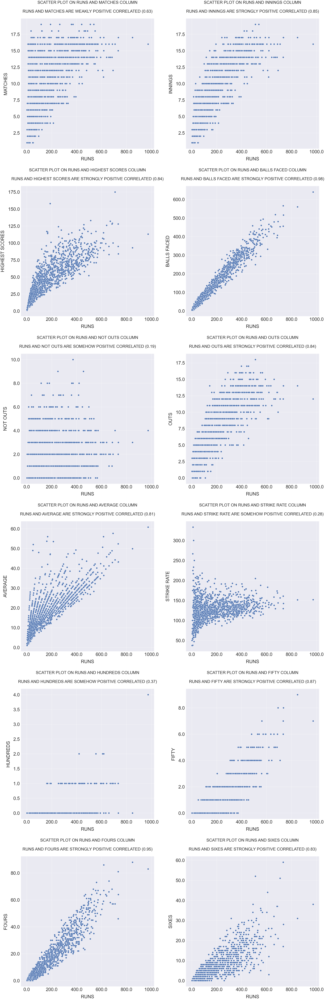

In [308]:
colors = ['Blues','Reds','Greens','Oranges','Blues','Reds','Greens','Oranges','Blues','Reds','Greens','Oranges']
independent = ['MATCHES','INNINGS','HIGHEST SCORES','BALLS FACED','NOT OUTS','OUTS','AVERAGE','STRIKE RATE','HUNDREDS','FIFTY','FOURS','SIXES']


nr_rows = 6
nr_cols = 2

fig, axs = plt.subplots(nr_rows, nr_cols, figsize=(40,120),constrained_layout=False)


for r in range(0,nr_rows):
    for c in range(0,nr_cols):
        i = r*nr_cols+c
    
        if i < len(independent):   
            
            sns.set(style="darkgrid")
            ax = sns.scatterplot(x="RUNS", y=independent[i],data=ipl_df,palette=colors[i] ,ax = axs[r][c],s=180)
            
            a = ipl_df["RUNS"].corr(ipl_df[independent[i]]) 
            
                        
            if a >= 0.70 and a <= 0.99:
                t = 'RUNS AND {} ARE STRONGLY POSITIVE CORRELATED'.format(independent[i])
            elif a >= 0.50 and a < 0.70:
                t = 'RUNS AND {} ARE WEAKLY POSITIVE CORRELATED'.format(independent[i])
            elif a <= 0.40 and a >= 0.01:
                t = 'RUNS AND {} ARE SOMEHOW POSITIVE CORRELATED'.format(independent[i])
            
            
            ax.set_title('SCATTER PLOT ON RUNS AND' + ' ' + independent[i] + ' ' + 'COLUMN' + '\n' + '\n' + t + ' ' + '(' + '{:.2f}'.format(a) + ')',size=35,pad = 50 )
                    
            ax.set_ylabel(independent[i], fontsize = 40 , labelpad = 25)
            ax.set_xlabel('RUNS', fontsize = 40 , labelpad = 25)
            
            ax.set_yticklabels(ax.get_yticks(), size = 40)
            ax.set_xticklabels(ax.get_xticks(), size = 40)
                
fig.tight_layout(pad = 5)
   
plt.show()

# What we can infer from the graph ?

- ### Strongly Positive Correlated Column :- 

    - ### RUNS AND INNINGS COLUMN IS STRONGLY LINEAR POSITIVE CORRELATED (0.85)
    - ### RUNS AND HIGHEST SCORES IS STRONGLY LINEAR POSITIVE CORRELATED (0.84)
    - ### RUNS AND BALLS FACED COLUMN IS STRONGLY LINEAR POSITIVE CORRELATED (0.98)
    - ### RUNS AND OUTS COLUMN IS STRONGLY LINEAR POSITIVE CORRELATED (0.84)
    - ### RUNS AND AVERAGE COLUMN IS STRONGLY LINEAR POSITIVE CORRELATED (0.80)
    - ### RUNS AND FIFTY COLUMN IS STRONGLY LINEAR POSITIVE CORRELATED (0.87)
    - ### RUNS AND FOURS COLUMN IS STRONGLY LINEAR POSITIVE CORRELATED (0.95)
    - ### RUNS AND SIXES COLUMN IS STRONGLY LINEAR POSITIVE CORRELATED (0.83)
    - ### RUNS AND MATHCES COLUMN IS WEAKLY LINEAR POSITIVE CORRELATED (0.64)



- ### Somehow Weakly Positive Correlated Columns :-
    
    - ### RUNS AND NOT OUTS IS SOMEHOE POSITIVE LINEAR CORRELATED (0.20)
    - ### RUNS AND STRIKE RATE COLUMN IS SOMEHOW LINEAR NEGATIVE CORRELATED (0.29)
    - ### RUNS AND HUNDREDS COLUMN IS SOMEHOW LINEAR POSITIVE CORRELATED (0.37)


-


- ### COLUMNS WHICH ARE STRONGLY CORRELATED WITH THE TARGET VARIABLE ARE IMPORTANT FEATURES.


- ### WE HAVE TO KEEP THOSE FEATURES FOR BUILDING OUR MACHINE LEARNING MODEL FOR PREDICTING THE TARGET VARIABLE.


                

            

                       
## <font color = #e80c5c><h1><center>HEAT MAP PLOT</center></h1></font>
                           

     
    
    

         

# HEAT MAP PLOT

<Figure size 1500x1000 with 0 Axes>

<AxesSubplot:>

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5]),
 [Text(0.5, 0, 'YEARS'),
  Text(1.5, 0, 'MATCHES'),
  Text(2.5, 0, 'INNINGS'),
  Text(3.5, 0, 'NOT OUTS'),
  Text(4.5, 0, 'RUNS'),
  Text(5.5, 0, 'HIGHEST SCORES'),
  Text(6.5, 0, 'AVERAGE'),
  Text(7.5, 0, 'BALLS FACED'),
  Text(8.5, 0, 'STRIKE RATE'),
  Text(9.5, 0, 'HUNDREDS'),
  Text(10.5, 0, 'FIFTY'),
  Text(11.5, 0, 'FOURS'),
  Text(12.5, 0, 'SIXES'),
  Text(13.5, 0, 'OUTS')])

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5]),
 [Text(0, 0.5, 'YEARS'),
  Text(0, 1.5, 'MATCHES'),
  Text(0, 2.5, 'INNINGS'),
  Text(0, 3.5, 'NOT OUTS'),
  Text(0, 4.5, 'RUNS'),
  Text(0, 5.5, 'HIGHEST SCORES'),
  Text(0, 6.5, 'AVERAGE'),
  Text(0, 7.5, 'BALLS FACED'),
  Text(0, 8.5, 'STRIKE RATE'),
  Text(0, 9.5, 'HUNDREDS'),
  Text(0, 10.5, 'FIFTY'),
  Text(0, 11.5, 'FOURS'),
  Text(0, 12.5, 'SIXES'),
  Text(0, 13.5, 'OUTS')])

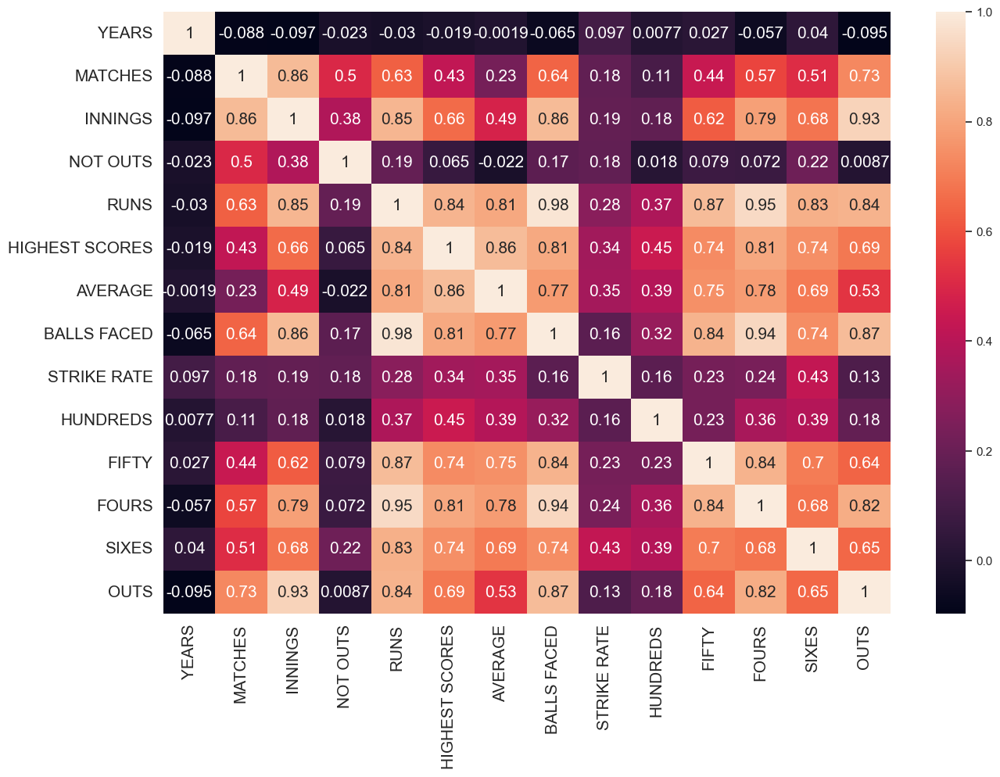

In [309]:
plt.figure(figsize=(15,10))
sns.set(style="darkgrid")
sns.heatmap(ipl_df.corr(), annot=True,annot_kws={'size': 15})
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

# From this heat map we can confirm our insights taken from scatterplot.

# <font color = #0c89cc><h1><center>ANALYSIS ON OVERALL SEASONS</center></h1></font>

                        

                             

                

## <font color = Orange><h1><center>Analysis On Most Runs Scored By A Batsman</center></h1></font>

                        

In [310]:
ipl_df.head()

,YEARS,TEAMS,PLAYERS,MATCHES,INNINGS,NOT OUTS,RUNS,HIGHEST SCORES,AVERAGE,BALLS FACED,STRIKE RATE,HUNDREDS,FIFTY,FOURS,SIXES,OUTS
0,2008,Chennai Super Kings,Suresh Raina,16,14,3,421,55,30.07,296,142.22,0,3,35,18,11
1,2008,Chennai Super Kings,MS Dhoni,16,14,4,414,65,29.57,310,133.54,0,2,38,15,10
2,2008,Chennai Super Kings,Parthiv Patel,13,13,2,302,54,23.23,297,101.68,0,2,42,3,11
3,2008,Chennai Super Kings,Albie Morkel,13,10,3,241,71,24.10,163,147.85,0,1,18,14,7
4,2008,Chennai Super Kings,Stephen Fleming,10,10,1,196,45,19.60,164,119.51,0,0,27,3,9


# Note :- Considering  Minimum 561 Runs Scored By A Players

In [311]:
# As there are more no. of players its not possible to show it in single graph.
# So I'm Filtering the players who have scored runs more than 561.

most_runs = ipl_df[ipl_df['RUNS']>561]

In [312]:
most_runs

,YEARS,TEAMS,PLAYERS,MATCHES,INNINGS,NOT OUTS,RUNS,HIGHEST SCORES,AVERAGE,BALLS FACED,STRIKE RATE,HUNDREDS,FIFTY,FOURS,SIXES,OUTS
34,2008,Kings Xi Punjab,Shaun Marsh,11,11,2,616,115,56.00,441,139.68,1,5,59,26,9
100,2009,Chennai Super Kings,Matthew Hayden,12,12,1,572,89,47.67,395,144.81,0,5,60,22,11
264,2010,Mumbai Indians,Sachin Tendulkar,15,15,2,618,89,41.20,466,132.61,0,5,86,3,13
289,2010,Royal Challengers Banglore,Jacques Kallis,16,16,4,572,89,35.75,494,115.78,0,6,67,9,12
380,2011,Royal Challengers Banglore,Chris Gayle,12,12,3,608,107,50.67,332,183.13,2,3,57,44,9
409,2012,Deccan Charges,Shikhar Dhawan,15,15,1,569,84,37.93,439,129.61,0,5,58,18,14
446,2012,Kolakata Knight Riders,Gautam Gambhir,17,17,2,590,93,34.71,411,143.55,0,6,64,17,15
491,2012,Royal Challengers Banglore,Chris Gayle,15,14,2,733,128,52.36,456,160.74,1,7,46,59,12
500,2013,Chennai Super Kings,Michael Hussey,17,17,3,733,95,43.12,566,129.50,0,6,81,17,14
589,2013,Royal Challengers Banglore,Chris Gayle,16,16,4,708,175,44.25,453,156.29,1,4,57,51,12


# Bar PLot

<Figure size 4000x2700 with 0 Axes>

Text(0.5, 1.0, 'MOST RUNS SCORED BY A PLAYER IN ONE SEASON')

Text(0.5, 0, 'TEAM NAMES')

Text(0, 0.5, 'RUNS')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16]),
 [Text(0, 0, 'Shaun Marsh'),
  Text(1, 0, 'Matthew Hayden'),
  Text(2, 0, 'Sachin Tendulkar'),
  Text(3, 0, 'Jacques Kallis'),
  Text(4, 0, 'Chris Gayle'),
  Text(5, 0, 'Shikhar Dhawan'),
  Text(6, 0, 'Gautam Gambhir'),
  Text(7, 0, 'Michael Hussey'),
  Text(8, 0, 'Virat Kohli'),
  Text(9, 0, 'Dwayne Smith'),
  Text(10, 0, 'Robin Uthappa'),
  Text(11, 0, 'David Warner'),
  Text(12, 0, 'AB de Villiers'),
  Text(13, 0, 'Ambati Rayudu'),
  Text(14, 0, 'Kane Williamson'),
  Text(15, 0, 'Rishabh Pant'),
  Text(16, 0, 'KL Rahul')])

([<matplotlib.axis.YTick at 0x155d425cac0>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

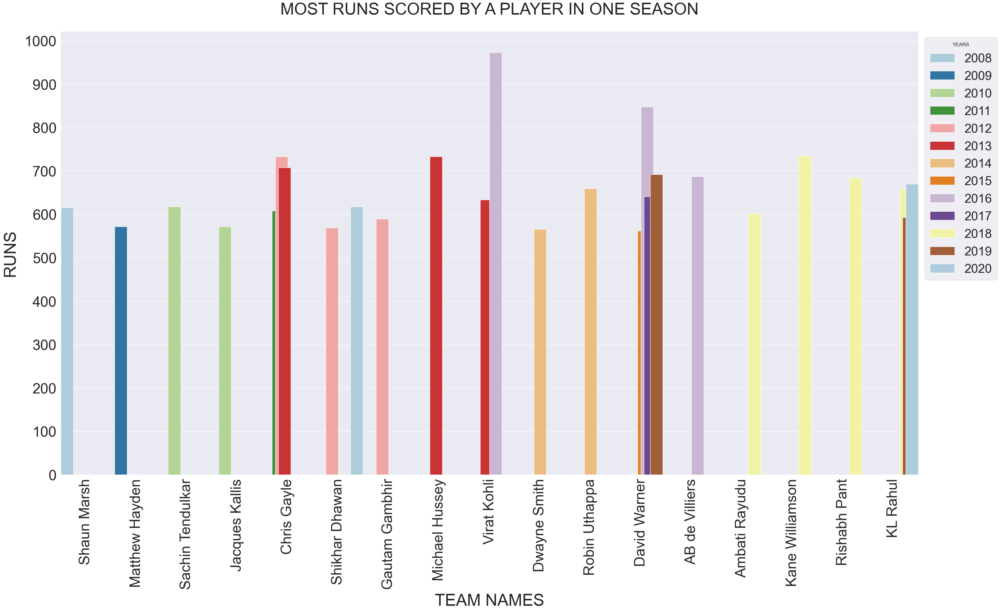

In [313]:
plt.figure(figsize=(40,27))
ax = sns.barplot(x='PLAYERS',y='RUNS',hue = 'YEARS', data=most_runs,palette='Paired',errwidth=20)
plt.title('MOST RUNS SCORED BY A PLAYER IN ONE SEASON',fontsize=40,pad=40)
plt.xlabel('TEAM NAMES',fontsize=40,labelpad =10)
plt.ylabel('RUNS',fontsize=40,labelpad=15)


y_ticks = np.arange(0, 1100, 100)

plt.xticks(rotation=90,fontsize=35)
plt.yticks(y_ticks,fontsize=35)
ax.legend(title = 'YEARS', bbox_to_anchor = (1,1),fontsize=30)


def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)

change_width(ax, .25)

ax.figure.tight_layout(pad = 20)
ax.figure.savefig("team_per.png")
plt.show()

# What we can infer from this graph ?


- ### <font color = #ebac00>ORANGE CAP WINNER</font> :-

     - ### Shaun Marsh was the orange cap winner in 2008.    
     - ### Matthew Hayden was the orange cap winner in 2009.
     - ### Sachin Tendulkar was the orange cap winner in 2010.   
     - ### Chris Gayle was the orange cap winner for 2 times ie. in 2011 and 2012.   
     - ### Michael Hussey was the orange cap winner in 2013.    
     - ### Robin Uthappa was the orange cap winner in 2014.   
     - ### David Warner was the orange cap winner for 3 times in 2015 , 2017 and 2019.   
     - ### Virat Kohli was the orange cap winner in 2016.   
     - ### Kane Williamson was the orange cap winner in 2018.
     - ### KL Rahul was the orange cap winner in 2020.
     
     
-


- ### MOST <font color = #ebac00>ORANGE CAP</font> WINNER :-

    - ### David Warner has won most number of orange cap ie. 3 <font color = #ebac00>ORANGE CAPS</font>
    - ### Chris Gayle is the runner up player in the list of most ORANGE CAP winner with 2 <font color = #ebac00>ORANGE CAPS</font>. 


# Lets check the performance of this top 5 players

In [314]:
most_runs.sort_values(by='RUNS',ascending=False).head(10)

,YEARS,TEAMS,PLAYERS,MATCHES,INNINGS,NOT OUTS,RUNS,HIGHEST SCORES,AVERAGE,BALLS FACED,STRIKE RATE,HUNDREDS,FIFTY,FOURS,SIXES,OUTS
864,2016,Royal Challengers Banglore,Virat Kohli,16,16,4,973,113,60.81,640,152.03,4,7,83,38,12
800,2016,Sunrises Hyderabad,David Warner,17,17,3,848,93,49.88,560,151.42,0,9,88,31,14
1012,2018,Sunrises Hyderabad,Kane Williamson,17,17,3,735,84,43.24,516,142.44,0,8,64,28,14
491,2012,Royal Challengers Banglore,Chris Gayle,15,14,2,733,128,52.36,456,160.74,1,7,46,59,12
500,2013,Chennai Super Kings,Michael Hussey,17,17,3,733,95,43.12,566,129.50,0,6,81,17,14
589,2013,Royal Challengers Banglore,Chris Gayle,16,16,4,708,175,44.25,453,156.29,1,4,57,51,12
1111,2019,Sunrises Hyderabad,David Warner,12,12,2,692,100,57.67,481,143.86,1,8,57,21,10
865,2016,Royal Challengers Banglore,AB de Villiers,16,16,3,687,129,42.94,407,168.79,1,6,57,37,13
1025,2018,Delhi Capitals,Rishabh Pant,14,14,1,684,128,48.86,394,173.60,1,5,68,37,13
1238,2020,Kings Xi Punjab,KL Rahul,14,14,2,670,132,47.86,518,129.34,1,5,58,23,12


In [315]:
most_runs_ms = most_runs.sort_values(by='RUNS',ascending=False).head(10)
most_runs_ms = most_runs_ms.iloc[0:5,0:]
most_runs_ms

,YEARS,TEAMS,PLAYERS,MATCHES,INNINGS,NOT OUTS,RUNS,HIGHEST SCORES,AVERAGE,BALLS FACED,STRIKE RATE,HUNDREDS,FIFTY,FOURS,SIXES,OUTS
864,2016,Royal Challengers Banglore,Virat Kohli,16,16,4,973,113,60.81,640,152.03,4,7,83,38,12
800,2016,Sunrises Hyderabad,David Warner,17,17,3,848,93,49.88,560,151.42,0,9,88,31,14
1012,2018,Sunrises Hyderabad,Kane Williamson,17,17,3,735,84,43.24,516,142.44,0,8,64,28,14
491,2012,Royal Challengers Banglore,Chris Gayle,15,14,2,733,128,52.36,456,160.74,1,7,46,59,12
500,2013,Chennai Super Kings,Michael Hussey,17,17,3,733,95,43.12,566,129.50,0,6,81,17,14


# BAR PLOT

Text(0.5, 1.0, 'PERFORMANCE OF THE TOP 5 MOST RUNS SCORED PLAYERS')

Text(0.5, 0, 'PLAYER NAMES AND RUNS SCORED')

Text(0, 0.5, 'COUNT')

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, '(Chris Gayle, 733, 2012)'),
  Text(1, 0, '(David Warner, 848, 2016)'),
  Text(2, 0, '(Kane Williamson, 735, 2018)'),
  Text(3, 0, '(Michael Hussey, 733, 2013)'),
  Text(4, 0, '(Virat Kohli, 973, 2016)')])

([<matplotlib.axis.YTick at 0x155e7d67f10>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

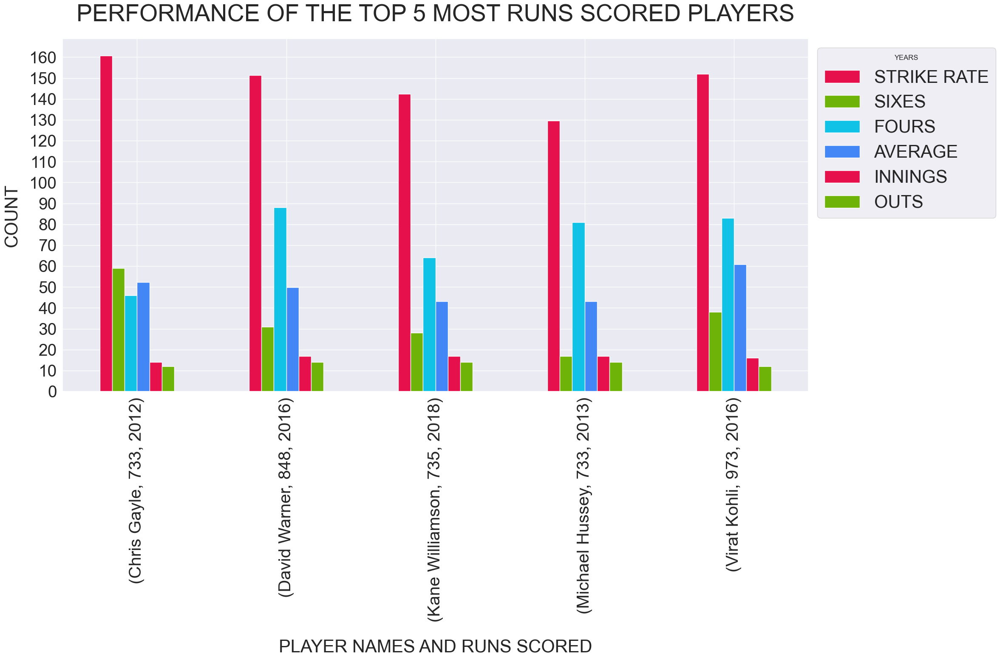

In [316]:
df = most_runs_ms.groupby(by=['PLAYERS','RUNS','YEARS'])['STRIKE RATE','SIXES','FOURS','AVERAGE','INNINGS','OUTS'].mean()

ax = df.plot(kind='bar', figsize=(30,22), color=["#e6104d",'#6eb307','#10c2e6','#4287f5'], fontsize=13)




y_ticks = np.arange(0, 170, 10)
ax.set_alpha(0.8)
plt.title('PERFORMANCE OF THE TOP 5 MOST RUNS SCORED PLAYERS',fontsize=40,pad=30)
plt.xlabel('PLAYER NAMES AND RUNS SCORED',fontsize=30,labelpad =30)
plt.ylabel('COUNT',fontsize=30,labelpad=15)
plt.xticks(rotation=90,fontsize=29)
plt.yticks(y_ticks,fontsize=28)
ax.legend(title = 'YEARS', bbox_to_anchor = (1,1),fontsize=30)


ax.figure.tight_layout(pad = 20)
#ax.figure.savefig("E:\\DATA SCIENCE\\Batch 91\\Projects\\team_per.png")
plt.show()

# What we can infer from the graph ?


- ### Virat Kohli:-

    - ### In 2016 Season Virat Kohli has scored 973 Rnus in which he has played 16 Innings in which he got out for 12 times in which his strike rate was 152.03 and he has hit 38 Sixes and 83 Fours. And in that season in each inning his Average runs Scored was 81.08 . 


- ### David Warner :-
     
     - ### In 2016 Season David Warner has scored 848 Rnus in which he has played 17 Innings in which he got out for 14 times in which his strike rate was 151.42 and he has hit 31 Sixes and 88 Fours. And in that season in each inning his Average runs Scored was 60.57 .




- ### Kane Williamson :-
    
    - ### In 2012 Season Kane Williamson has scored 735 Rnus in which he has played 17 Innings in which he got out for 14 times in which his strike rate was 142.44 and he has hit 28 Sixes and 64 Fours. And in that season in each inning his Average runs Scored was 52.50 .


- ### Chris Gayle :-
    
    - ### In 2012 Season Chris Gayle has scored 733 Rnus in which he has played 14 Innings in which he got out for 12 times in which his strike rate was 160.74 and he has hit 59 Sixes and 46 Fours. And in that season in each inning his Average runs Scored was 61.08 .
    
    
- ### Michael Hussey :-
     
     - ### In 2016 Season Michael Hussey has scored 733 Rnus in which he has played 17 Innings in which he got out for 14 times in which his strike rate was 129.50 and he has hit 17 Sixes and 81 Fours. And in that season in each inning his Average runs Scored was 52.35 .

# LET'S CHECK INDIVIDUAL PERFORMANCE OF TOP 5 MOST RUNS SCORED PLAYERS

# PIE CHART OF VIRAT KOHLI

In [317]:
most_runs_ms

,YEARS,TEAMS,PLAYERS,MATCHES,INNINGS,NOT OUTS,RUNS,HIGHEST SCORES,AVERAGE,BALLS FACED,STRIKE RATE,HUNDREDS,FIFTY,FOURS,SIXES,OUTS
864,2016,Royal Challengers Banglore,Virat Kohli,16,16,4,973,113,60.81,640,152.03,4,7,83,38,12
800,2016,Sunrises Hyderabad,David Warner,17,17,3,848,93,49.88,560,151.42,0,9,88,31,14
1012,2018,Sunrises Hyderabad,Kane Williamson,17,17,3,735,84,43.24,516,142.44,0,8,64,28,14
491,2012,Royal Challengers Banglore,Chris Gayle,15,14,2,733,128,52.36,456,160.74,1,7,46,59,12
500,2013,Chennai Super Kings,Michael Hussey,17,17,3,733,95,43.12,566,129.50,0,6,81,17,14


In [318]:
name = most_runs_ms[most_runs_ms['PLAYERS']=='Virat Kohli']

In [319]:
name

,YEARS,TEAMS,PLAYERS,MATCHES,INNINGS,NOT OUTS,RUNS,HIGHEST SCORES,AVERAGE,BALLS FACED,STRIKE RATE,HUNDREDS,FIFTY,FOURS,SIXES,OUTS
864,2016,Royal Challengers Banglore,Virat Kohli,16,16,4,973,113,60.81,640,152.03,4,7,83,38,12


In [320]:
n = name.groupby(by='PLAYERS')['RUNS','BALLS FACED','HIGHEST SCORES','STRIKE RATE','SIXES','FOURS'].sum()

In [321]:
a = n.iloc[0]
a

RUNS             973.00
BALLS FACED      640.00
HIGHEST SCORES   113.00
STRIKE RATE      152.03
SIXES             38.00
FOURS             83.00
Name: Virat Kohli, dtype: float64

<Figure size 1000x1500 with 0 Axes>

<AxesSubplot:ylabel='Virat Kohli'>

Text(0.5, 1.0, 'Virat Kohli')

(-1.3208808565197356,
 1.125042510797066,
 -1.1115010907918987,
 1.1092759805169543)

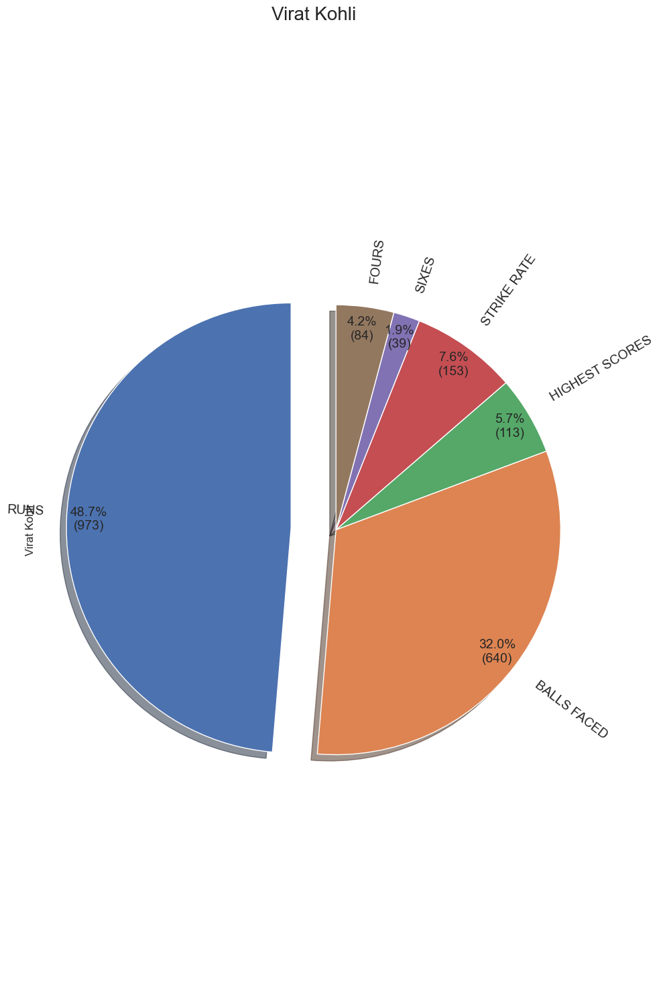

In [322]:

plt.figure(figsize=(10,15))

def func(pct, a):
    absolute = int((pct / 100)*np.sum(a))    
    return "{:.1f}%\n({:d})".format(pct, absolute+1)

a.plot.pie(autopct = lambda pct: func(pct, a),
           shadow=True,       
           startangle=90,
           explode=(0.2,0,0,0,0,0),
           textprops={'fontsize': 14},
           pctdistance=0.9,           
           rotatelabels = True)


plt.title("Virat Kohli", fontsize=20,pad=50)

import matplotlib as mpl
mpl.rcParams['font.size'] = 10


plt.axis('equal')
plt.tight_layout()
plt.show()

- ### Virat Kohli:-
    - ### In 2016 Season Virat Kohli has scored 973 Runs in 640 Balls in which his highest score is 113 , in which his strike rate was 152.03 and he has hit 39 Sixes and 84 Fours.

# LINE PLOT YEAR WISE PERFORMANCE OF VIRAT KOHLI

In [323]:
virat = ipl_df[ipl_df['PLAYERS']=='Virat Kohli']

In [324]:
virat

,YEARS,TEAMS,PLAYERS,MATCHES,INNINGS,NOT OUTS,RUNS,HIGHEST SCORES,AVERAGE,BALLS FACED,STRIKE RATE,HUNDREDS,FIFTY,FOURS,SIXES,OUTS
88,2008,Royal Challengers Banglore,Virat Kohli,13,12,1,165,38,13.75,157,105.09,0,0,18,4,11
186,2009,Royal Challengers Banglore,Virat Kohli,16,13,2,246,50,18.92,219,112.32,0,1,22,8,11
291,2010,Royal Challengers Banglore,Virat Kohli,16,13,2,307,58,23.62,212,144.81,0,1,26,12,11
381,2011,Royal Challengers Banglore,Virat Kohli,16,16,4,557,71,34.81,460,121.08,0,4,55,16,12
492,2012,Royal Challengers Banglore,Virat Kohli,16,15,2,364,73,24.27,326,111.65,0,2,33,9,13
590,2013,Royal Challengers Banglore,Virat Kohli,16,16,2,634,99,39.62,457,138.73,0,6,64,22,14
687,2014,Royal Challengers Banglore,Virat Kohli,14,14,1,359,73,25.64,294,122.10,0,2,23,16,13
786,2015,Royal Challengers Banglore,Virat Kohli,16,16,5,505,82,31.56,386,130.82,0,3,35,23,11
864,2016,Royal Challengers Banglore,Virat Kohli,16,16,4,973,113,60.81,640,152.03,4,7,83,38,12
965,2017,Royal Challengers Banglore,Virat Kohli,10,10,0,308,64,30.80,252,122.22,0,4,23,11,10


Text(0.5, 1.0, 'YEAR vs PLAYER\nVIRAT KOHLI')

Text(0.5, 0, 'YEARS')

Text(0, 0.5, 'PERFOEMANCE')

([<matplotlib.axis.XTick at 0x155e7ea0670>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

([<matplotlib.axis.YTick at 0x155e7ea0fa0>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

(array([2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018,
        2019, 2020, 2021]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

(array([  0,  10,  20,  30,  40,  50,  60,  70,  80,  90, 100, 110, 120,
        130, 140, 150, 160, 170]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

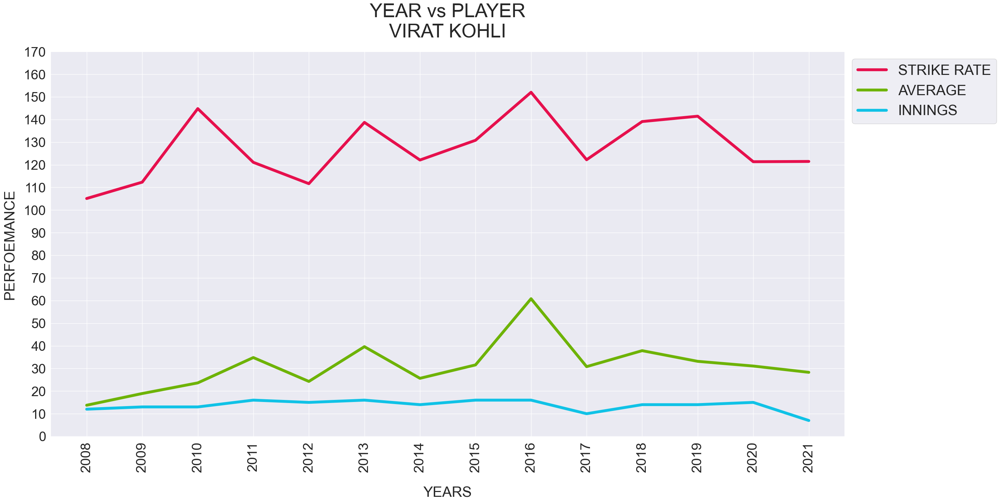

In [325]:
df = virat.groupby(by=['YEARS'])['STRIKE RATE','AVERAGE','INNINGS'].mean()

ax = df.plot(kind='line',figsize=(30,20),linewidth=6, color=["#e6104d",'#6eb307','#10c2e6','#4287f5'], fontsize=13)

ax.set_alpha(0.8)
plt.title('YEAR vs PLAYER'+'\n'+'VIRAT KOHLI',fontsize=40,pad=30)

plt.xlabel('YEARS',fontsize=30,labelpad =30)
plt.ylabel('PERFOEMANCE',fontsize=30,labelpad=15)


x_ticks = np.arange(2008, 2022, 1)
plt.xticks(x_ticks,fontsize=28)


y_ticks = np.arange(0, 180, 10)
plt.yticks(y_ticks,fontsize=28)

plt.xticks(rotation=90,fontsize=29)
plt.yticks(fontsize=28)



ax.legend(bbox_to_anchor = (1,1),fontsize=30)


ax.figure.tight_layout(pad = 20)
#ax.figure.savefig("E:\\DATA SCIENCE\\Batch 91\\Projects\\team_per.png")
plt.show()

- ### In 2016 Season Virat Kohli Performance was Good.
- ### As we can see in 2016 he played 17 innings.
- ### And his Average Runs Scored in most of the innings is around 60.81.
- ### Where his Strike Rate is around 152.03 .

# PIE PLOT OF DAVID WARNER 

In [326]:
name = most_runs_ms[most_runs_ms['PLAYERS']=='David Warner']

In [327]:
name

,YEARS,TEAMS,PLAYERS,MATCHES,INNINGS,NOT OUTS,RUNS,HIGHEST SCORES,AVERAGE,BALLS FACED,STRIKE RATE,HUNDREDS,FIFTY,FOURS,SIXES,OUTS
800,2016,Sunrises Hyderabad,David Warner,17,17,3,848,93,49.88,560,151.42,0,9,88,31,14


In [328]:
n = name.groupby(by='PLAYERS')['RUNS','BALLS FACED','HIGHEST SCORES','STRIKE RATE','SIXES','FOURS'].sum()

In [329]:
n

,RUNS,BALLS FACED,HIGHEST SCORES,STRIKE RATE,SIXES,FOURS
PLAYERS,,,,,,
David Warner,848,560,93,151.42,31,88


In [330]:
a = n.iloc[0]
a

RUNS             848.00
BALLS FACED      560.00
HIGHEST SCORES    93.00
STRIKE RATE      151.42
SIXES             31.00
FOURS             88.00
Name: David Warner, dtype: float64

<Figure size 1000x1200 with 0 Axes>

<AxesSubplot:ylabel='David Warner'>

Text(0.5, 1.0, 'DAVID WARNER')

(-1.2208347101706178,
 1.1188285816344437,
 -1.1142517449522487,
 1.1076797254924224)

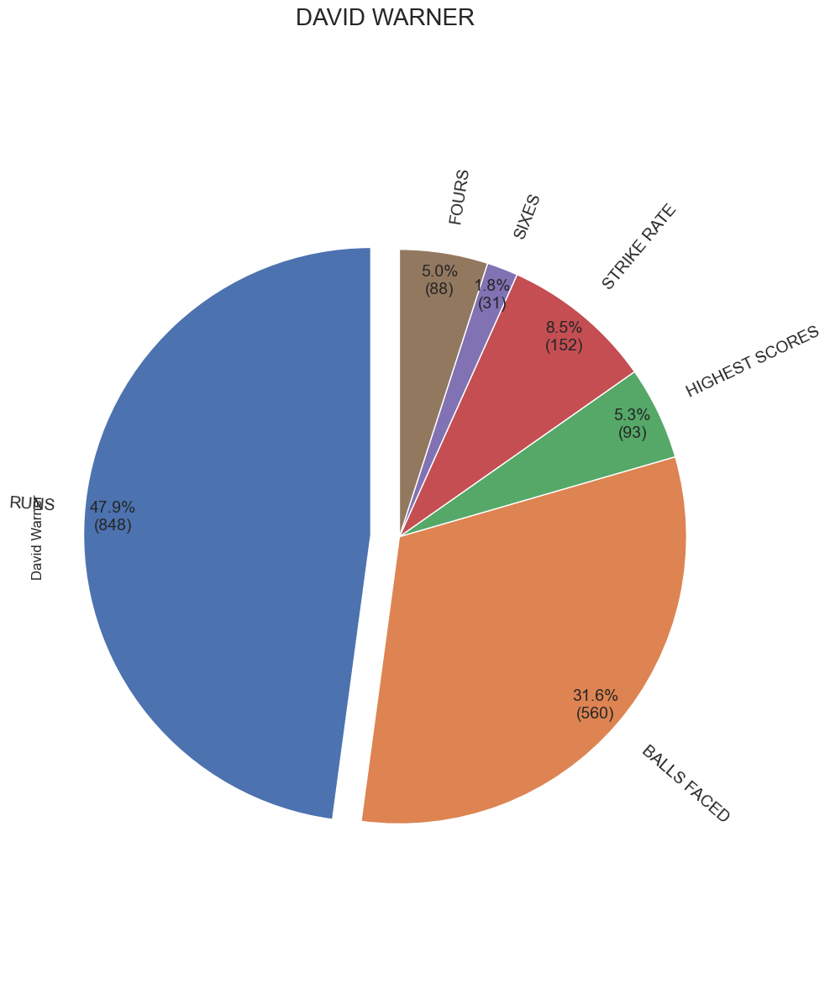

In [331]:

plt.figure(figsize=(10,12))

def func(pct, a):
    absolute = int((pct / 100)*np.sum(a))    
    return "{:.1f}%\n({:d})".format(pct, absolute+1)

a.plot.pie(autopct = lambda pct: func(pct, a),
           shadow=False,       
           startangle=90,
           explode=(0.1,0,0,0,0,0),
           textprops={'fontsize': 14},
           pctdistance=0.9,
           rotatelabels = True)
plt.title("DAVID WARNER", fontsize=20,pad=50)

import matplotlib as mpl
mpl.rcParams['font.size'] = 10


plt.axis('equal')
plt.tight_layout()
plt.show()

- ### David Warner:-

    - ### In 2016 Season David Warner has scored 848 Runs in 560 Balls in which his highest score is 93 , in which his strike rate was 152.03 and he has hit 31 Sixes and 88 Fours.

# LINE PLOT YEAR WISE PERFORMANCE OF DAVID WARNER

In [332]:
david = ipl_df[ipl_df['PLAYERS']=='David Warner']

In [333]:
david.head()

,YEARS,TEAMS,PLAYERS,MATCHES,INNINGS,NOT OUTS,RUNS,HIGHEST SCORES,AVERAGE,BALLS FACED,STRIKE RATE,HUNDREDS,FIFTY,FOURS,SIXES,OUTS
226,2010,Delhi Capitals,David Warner,11,11,1,282,107,25.64,191,147.64,1,1,27,14,10
321,2011,Delhi Capitals,David Warner,13,13,0,324,77,24.92,276,117.39,0,3,34,11,13
422,2012,Delhi Capitals,David Warner,8,8,1,256,109,32.00,156,164.10,1,1,28,14,7
523,2013,Delhi Capitals,David Warner,16,16,3,410,77,25.62,323,126.93,0,4,41,14,13
610,2014,Sunrises Hyderabad,David Warner,14,14,3,528,90,37.71,375,140.80,0,6,39,24,11


Text(0.5, 1.0, 'YEAR vs PLAYER\nDavid Warner')

Text(0.5, 0, 'YEARS')

Text(0, 0.5, 'PERFOEMANCE')

([<matplotlib.axis.XTick at 0x155f1586ca0>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

([<matplotlib.axis.YTick at 0x155f1586df0>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

(array([2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018,
        2019, 2020, 2021]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

(array([  0,  20,  40,  60,  80, 100, 120, 140, 160, 180]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

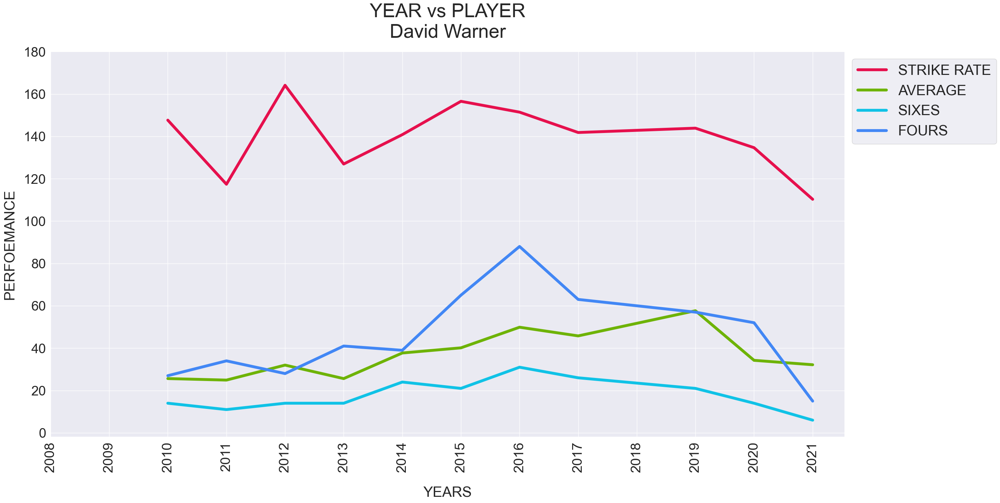

In [334]:
df = david.groupby(by='YEARS')['STRIKE RATE','AVERAGE','SIXES','FOURS'].mean()

ax = df.plot(kind='line',figsize=(30,20),linewidth=6, color=["#e6104d",'#6eb307','#10c2e6','#4287f5'], fontsize=13)

ax.set_alpha(0.8)
plt.title('YEAR vs PLAYER'+'\n'+'David Warner',fontsize=40,pad=30)

plt.xlabel('YEARS',fontsize=30,labelpad =30)
plt.ylabel('PERFOEMANCE',fontsize=30,labelpad=15)


x_ticks = np.arange(2008, 2022, 1)
plt.xticks(x_ticks,fontsize=28)


y_ticks = np.arange(0, 200, 20)
plt.yticks(y_ticks,fontsize=28)

plt.xticks(rotation=90,fontsize=29)
plt.yticks(fontsize=28)



ax.legend(bbox_to_anchor = (1,1),fontsize=30)


ax.figure.tight_layout(pad = 20)
#ax.figure.savefig("E:\\DATA SCIENCE\\Batch 91\\Projects\\team_per.png")
plt.show()

- ### In 2016 Season David Warner Performance was Good.
- ### As we can see in 2016 he played 17 innings.
- ### And his Average Runs Scored in most of the innings is around 60.57 .
- ### Where his Strike Rate is around 151.42 .

# <font color = red><h1><center>Take Player Name as a  Dynamical Input from the user to check Player Score PIE Chart </center></h1></font>

Enter Player Name To Check His Year Wise Performance : Yuvraj Singh


RUNS             2750.00
BALLS FACED      2120.00
HIGHEST SCORES    585.00
STRIKE RATE      1410.20
SIXES             149.00
FOURS             217.00
Name: Yuvraj Singh, dtype: float64

<Figure size 1000x800 with 0 Axes>

<AxesSubplot:ylabel='Yuvraj Singh'>

Text(0.5, 1.0, 'Yuvraj Singh')

(-1.3160467565427831,
 1.1123329050105002,
 -1.115944465461399,
 1.1777086422826257)

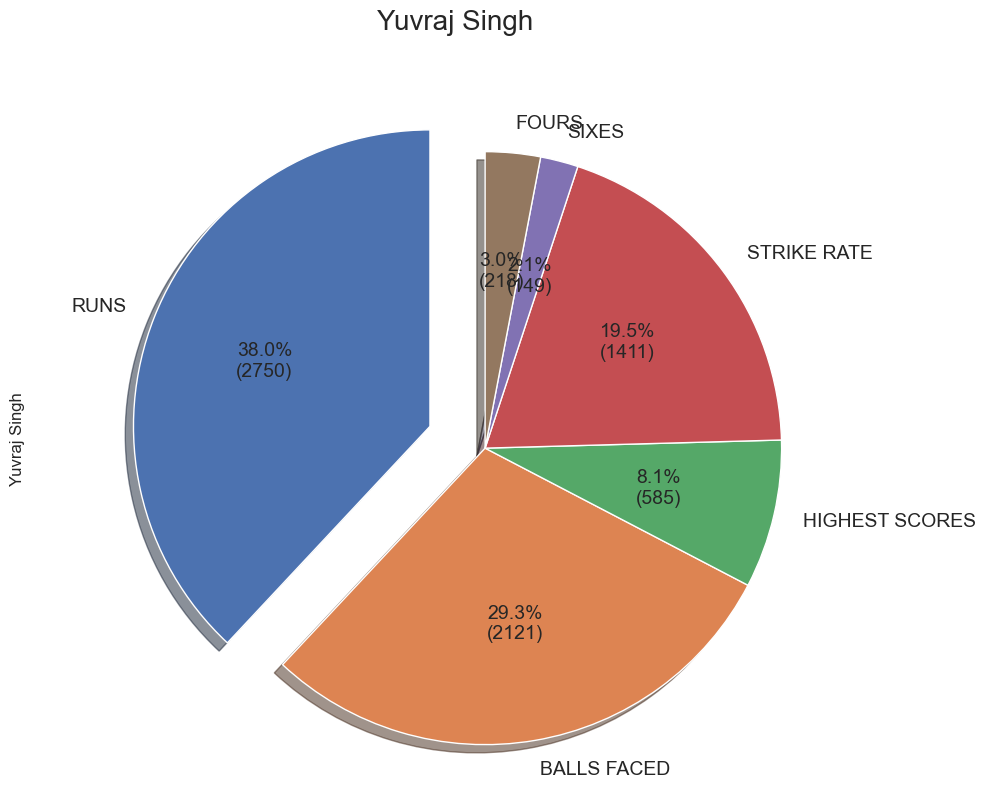

Do you want to check pie chart for more players : YES | NO  no
Thanks For Using My Application... 


In [335]:
while True:  
    
    p_name = input('Enter Player Name To Check His Year Wise Performance : ')
    player_name = ipl_df[ipl_df['PLAYERS'].str.lower() == p_name.lower()]

    n = player_name.groupby(by='PLAYERS')['RUNS','BALLS FACED','HIGHEST SCORES','STRIKE RATE','SIXES','FOURS'].sum()

    a = n.iloc[0]
    a


    plt.figure(figsize=(10,8))

    def func(pct, a):
        absolute = int((pct / 100)*np.sum(a))    
        return "{:.1f}%\n({:d})".format(pct, absolute+1)

    a.plot.pie(autopct = lambda pct: func(pct, a),
                        shadow=True,       
                         startangle=90,
                         explode=(0.2,0,0,0,0,0),
                         textprops={'fontsize': 14})
    
    plt.title(p_name , fontsize=20,pad=50)

    import matplotlib as mpl
    mpl.rcParams['font.size'] = 10


    plt.axis('equal')
    plt.tight_layout()
    plt.show()
    
    option = input('Do you want to check pie chart for more players : YES | NO  ')
    
    if option.lower() == 'no':
        print('Thanks For Using My Application... ')
        break

                        

                             

                

## <font color = Orange><h1><center>Analysis On Highest Runs Scored By A Batsman</center></h1></font>

                        

In [336]:
ipl_df_pi=joblib.load("ipl_df_pi.pkl")

In [337]:
ipl_df_pi

,YEARS,TEAMS,PLAYERS,HIGHEST SCORES,BALLS FACED,STRIKE RATE,FOURS,SIXES,AGAINST,VENUE,MATCH DATE
0,2008,Chennai Super Kings,Michael Hussey,116,54,214.81,8,9,PBKS,IS Bindra Stadium,19 April 2008
1,2008,Chennai Super Kings,Albie Morkel,71,40,177.50,6,4,RR,Chidambaram,24 May 2008
2,2008,Chennai Super Kings,Suresh Raina,55,34,161.76,4,4,PBKS,Wankhede Stadium,31 May 2008
3,2008,Chennai Super Kings,MS Dhoni,60,43,139.53,2,4,PBKS,Chidambaram,10 May 2008
4,2008,Chennai Super Kings,Suresh Raina,32,13,246.15,2,3,PBKS,IS Bindra Stadium,19 April 2008
...,...,...,...,...,...,...,...,...,...,...,...
1395,2021,Royal Challengers Banglore,Devdutt Padikkal,34,15,226.66,4,2,CSK,Wankhede Stadium,25 April 2021
1396,2021,Royal Challengers Banglore,AB de Villiers,48,27,177.77,4,2,MI,Chidambaram,09 April 2021
1397,2021,Royal Challengers Banglore,Rajat Patidar,31,22,140.90,0,2,DC,Narendra Modi Stadium,27 April 2021
1398,2021,Royal Challengers Banglore,Glenn Maxwell,39,28,139.28,3,2,MI,Chidambaram,09 April 2021


# Note :- Analysis On  Minimum 113 Highest Runs Scored By A Players

In [338]:
# As there are more no. of players its not possible to show it in single graph.
# So I'm Filtering the players who have scored Highest Runs Scored more than 113.


most_high = ipl_df_pi[ipl_df_pi['HIGHEST SCORES']>113]

In [339]:
most_high

,YEARS,TEAMS,PLAYERS,HIGHEST SCORES,BALLS FACED,STRIKE RATE,FOURS,SIXES,AGAINST,VENUE,MATCH DATE
0,2008,Chennai Super Kings,Michael Hussey,116,54,214.81,8,9,PBKS,IS Bindra Stadium,19 April 2008
16,2008,Deccan Charges,Andrew Symonds,117,53,220.75,11,7,RR,Rajiv Gandhi Intl. Cricket Stadium,24 April 2008
39,2008,Kings Xi Punjab,Shaun Marsh,115,69,166.66,11,7,RR,IS Bindra Stadium,28 May 2008
54,2008,Kolakata Knight Riders,Brendon McCullum,158,73,216.43,10,13,RCB,M. Chinnaswamy Stadium,18 April 2008
65,2008,Mumbai Indians,Sanath Jayasuriya,114,48,237.50,9,11,CSK,Wankhede Stadium,14 May 2008
184,2009,Royal Challengers Banglore,Manish Pandey,114,73,156.16,10,4,DEC,Supersport Park,21 May 2009
200,2010,Chennai Super Kings,Murali Vijay,127,56,226.78,8,11,RR,Chidambaram,03 April 2010
319,2011,Delhi Capitals,Virender Sehwag,119,56,212.50,13,6,DEC,Rajiv Gandhi Intl. Cricket Stadium,05 May 2011
342,2011,Kings Xi Punjab,Paul Valthaty,120,63,190.47,19,2,CSK,IS Bindra Stadium,13 April 2011
484,2012,Royal Challengers Banglore,Chris Gayle,128,62,206.45,7,13,DC,Arun Jaitley Stadium,17 May 2012


# BAR PLOT

<Figure size 4000x3000 with 0 Axes>

Text(0.5, 1.0, 'Most Highest Scores Scored By A Played In One Season / Year')

Text(0.5, 0, 'TEAM NAMES')

Text(0, 0.5, 'RUNS')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18]),
 [Text(0, 0, 'Michael Hussey'),
  Text(1, 0, 'Andrew Symonds'),
  Text(2, 0, 'Shaun Marsh'),
  Text(3, 0, 'Brendon McCullum'),
  Text(4, 0, 'Sanath Jayasuriya'),
  Text(5, 0, 'Manish Pandey'),
  Text(6, 0, 'Murali Vijay'),
  Text(7, 0, 'Virender Sehwag'),
  Text(8, 0, 'Paul Valthaty'),
  Text(9, 0, 'Chris Gayle'),
  Text(10, 0, 'Wriddhiman Saha'),
  Text(11, 0, 'AB de Villiers'),
  Text(12, 0, 'David Warner'),
  Text(13, 0, 'Shane Watson'),
  Text(14, 0, 'Rishabh Pant'),
  Text(15, 0, 'Jonny Bairstow'),
  Text(16, 0, 'KL Rahul'),
  Text(17, 0, 'Jos Buttler'),
  Text(18, 0, 'Sanju Samson')])

([<matplotlib.axis.YTick at 0x155f17459d0>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

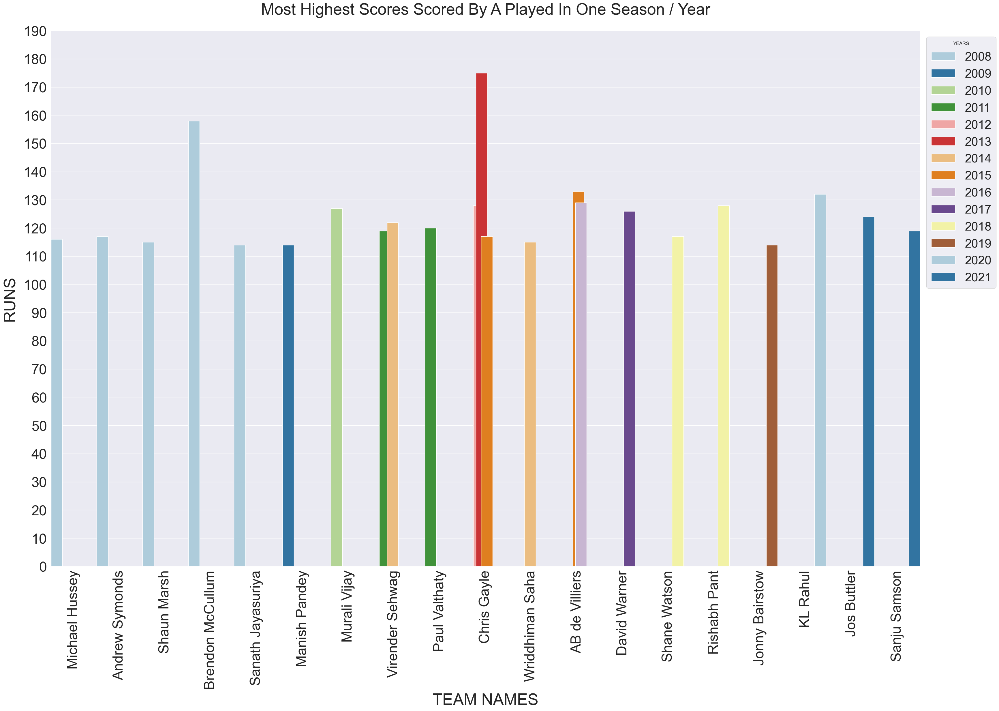

In [340]:
plt.figure(figsize=(40,30))
ax = sns.barplot(x='PLAYERS',y='HIGHEST SCORES',hue = 'YEARS', data=most_high,palette='Paired',errwidth=20)
plt.title('Most Highest Scores Scored By A Played In One Season / Year',fontsize=40,pad=40)
plt.xlabel('TEAM NAMES',fontsize=40,labelpad =10)
plt.ylabel('RUNS',fontsize=40,labelpad=15)


y_ticks = np.arange(0, 200 , 10)

plt.xticks(rotation=90,fontsize=35)
plt.yticks(y_ticks,fontsize=35)
ax.legend(title = 'YEARS', bbox_to_anchor = (1,1),fontsize=30)


def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)

change_width(ax, .25)

ax.figure.tight_layout(pad = 20)
#ax.figure.savefig("E:\\DATA SCIENCE\\Batch 91\\Projects\\team_per.png")
plt.show()

# What we can infer from this graph ?


- ### <font color = #ebac00>RUNNER UP ORANGE CAP WINNER</font> :-

     - ### Brendon McCullum was the runner-up orange cap winner in 2008.    
     - ### Sanju Samson was the runner-up orange cap winner in 2009.
     - ### Murali Vijay was the runner-up orange cap winner in 2010.   
     - ### Paul Valthaty was the runner-up orange cap winner in 2011.   
     - ### Chris Gayle was the runner-up orange cap winner for 2 times in 2012 and 2013.    
     - ### Virender Sehwag was the runner-up orange cap winner in 2014.   
     - ### AB de Villiers was the runner-up orange cap winner for 2 times in 2015 and 2016.   
     - ### David Warner was the runner-up orange cap winner in 2017.   
     - ### Rishabh Pant was the runner-up orange cap winner in 2018.    
     - ### Jonny Bairstow was the runner-up orange cap winner in 2019.
     - ### KL Rahul was the runner-up orange cap winner in 2020.
     - ### Sanju Samson was the runner-up orange cap winner in 2021.
     
     
-


- ### MOST <font color = #ebac00>RUNNER-UP ORANGE CAP</font> WINNER :-

    - ### Chris Gayle and AB de Villiers are the most RUNNER-UP ORANGE CAP winner with 2 <font color = #ebac00>RUNNER-UP ORANGE CAPS</font>. 


In [341]:
most_high

,YEARS,TEAMS,PLAYERS,HIGHEST SCORES,BALLS FACED,STRIKE RATE,FOURS,SIXES,AGAINST,VENUE,MATCH DATE
0,2008,Chennai Super Kings,Michael Hussey,116,54,214.81,8,9,PBKS,IS Bindra Stadium,19 April 2008
16,2008,Deccan Charges,Andrew Symonds,117,53,220.75,11,7,RR,Rajiv Gandhi Intl. Cricket Stadium,24 April 2008
39,2008,Kings Xi Punjab,Shaun Marsh,115,69,166.66,11,7,RR,IS Bindra Stadium,28 May 2008
54,2008,Kolakata Knight Riders,Brendon McCullum,158,73,216.43,10,13,RCB,M. Chinnaswamy Stadium,18 April 2008
65,2008,Mumbai Indians,Sanath Jayasuriya,114,48,237.50,9,11,CSK,Wankhede Stadium,14 May 2008
184,2009,Royal Challengers Banglore,Manish Pandey,114,73,156.16,10,4,DEC,Supersport Park,21 May 2009
200,2010,Chennai Super Kings,Murali Vijay,127,56,226.78,8,11,RR,Chidambaram,03 April 2010
319,2011,Delhi Capitals,Virender Sehwag,119,56,212.50,13,6,DEC,Rajiv Gandhi Intl. Cricket Stadium,05 May 2011
342,2011,Kings Xi Punjab,Paul Valthaty,120,63,190.47,19,2,CSK,IS Bindra Stadium,13 April 2011
484,2012,Royal Challengers Banglore,Chris Gayle,128,62,206.45,7,13,DC,Arun Jaitley Stadium,17 May 2012


# Now lets check the performance of the top 5 Highest Scores Players

In [342]:
most_runs_hs = most_high.sort_values(by='HIGHEST SCORES',ascending=False).head(10)
most_runs_hs = most_runs_hs.iloc[0:5,0:]
most_runs_hs

,YEARS,TEAMS,PLAYERS,HIGHEST SCORES,BALLS FACED,STRIKE RATE,FOURS,SIXES,AGAINST,VENUE,MATCH DATE
586,2013,Royal Challengers Banglore,Chris Gayle,175,66,265.15,13,17,PWI,M. Chinnaswamy Stadium,23 April 2013
54,2008,Kolakata Knight Riders,Brendon McCullum,158,73,216.43,10,13,RCB,M. Chinnaswamy Stadium,18 April 2008
787,2015,Royal Challengers Banglore,AB de Villiers,133,59,225.42,19,4,MI,Wankhede Stadium,10 May 2015
1233,2020,Kings Xi Punjab,KL Rahul,132,69,191.30,14,7,RCB,Dubai International Cricket Stadium,24 September 2020
858,2016,Royal Challengers Banglore,AB de Villiers,129,52,248.07,10,12,GL,M. Chinnaswamy Stadium,14 May 2016


# BAR PLOT

Text(0.5, 1.0, 'PERFORMANCE OF THE TOP 5 HIGHEST RUNS SCORED PLAYERS')

Text(0.5, 0, 'PLAYER NAMES AND HIGHEST RUNS SCORED')

Text(0, 0.5, 'COUNT')

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, '(AB de Villiers, 129, 2016)'),
  Text(1, 0, '(AB de Villiers, 133, 2015)'),
  Text(2, 0, '(Brendon McCullum, 158, 2008)'),
  Text(3, 0, '(Chris Gayle, 175, 2013)'),
  Text(4, 0, '(KL Rahul, 132, 2020)')])

([<matplotlib.axis.YTick at 0x155f4b5df40>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

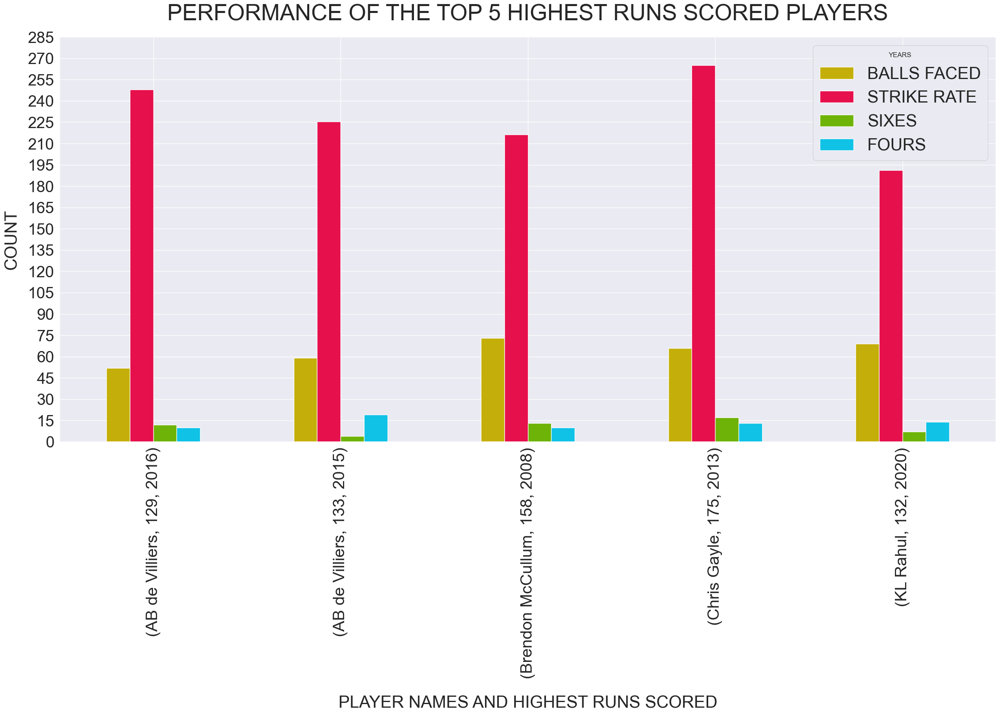

In [343]:
df = most_runs_hs.groupby(by=['PLAYERS','HIGHEST SCORES','YEARS'])['BALLS FACED','STRIKE RATE','SIXES','FOURS'].mean()

ax = df.plot(kind='bar', figsize=(30,23), color=['#c4af0a',"#e6104d",'#6eb307','#10c2e6','#4287f5'], fontsize=13,stacked=False)


y_ticks = np.arange(0, 300, 15)
ax.set_alpha(0.8)
plt.title('PERFORMANCE OF THE TOP 5 HIGHEST RUNS SCORED PLAYERS',fontsize=40,pad=30)
plt.xlabel('PLAYER NAMES AND HIGHEST RUNS SCORED',fontsize=30,labelpad =30)
plt.ylabel('COUNT',fontsize=30,labelpad=15)
plt.xticks(rotation=90,fontsize=29)
plt.yticks(y_ticks,fontsize=28)
ax.legend(title = 'YEARS', bbox_to_anchor = (1,1),fontsize=30)


ax.figure.tight_layout(pad = 20)
#ax.figure.savefig("E:\\DATA SCIENCE\\Batch 91\\Projects\\team_per.png")
plt.show()

# What we can infer from the graph ?


- ### Chris Gayle :-

    - ### In 2013 Season Chris Gayle has scored 175 Rnus in 66 Balls in which his strike rate was 265.15 and he has hit 17 Sixes and 13 Fours.


- ### Brendon McCullum :-

    - ### In 2013 Season Brendon McCullum has scored 158 Rnus in 73 Balls in which his strike rate was 216.43 and he has hit 13 Sixes and 10 Fours.

    
    
- ### AB de Villiers:-

    - ### In 2015 Season AB de Villiers has scored 133 Runs in 59 Balls , in which his strike rate was 225.42 and he has hit 4 Sixes and 19 Fours.


- ### KL Rahul:-
    - ### In 2016 Season KL Rahul has scored 132 Runs in 69 Balls , in which his strike rate was 191.30 and he has hit 7 Sixes and 14 Fours.


- ### AB de Villiers:-
    - ### In 2016 Season AB de Villiers has scored 129 Runs in 52 Balls , in which his strike rate was 248.07 and he has hit 10 Sixes and 12 Fours.



# PIE PLOT

Enter Player Name To Check His Performance using PIE chart : Chris gayle


BALLS FACED       66.00
HIGHEST SCORES   175.00
STRIKE RATE      265.15
SIXES             17.00
FOURS             13.00
Name: Chris Gayle, dtype: float64

<Figure size 1000x800 with 0 Axes>

<AxesSubplot:ylabel='Chris Gayle'>

Text(0.5, 1.0, 'Chris gayle')

(-1.3196963760923461,
 1.1425645845859866,
 -1.1334674055435545,
 1.1015936859782645)

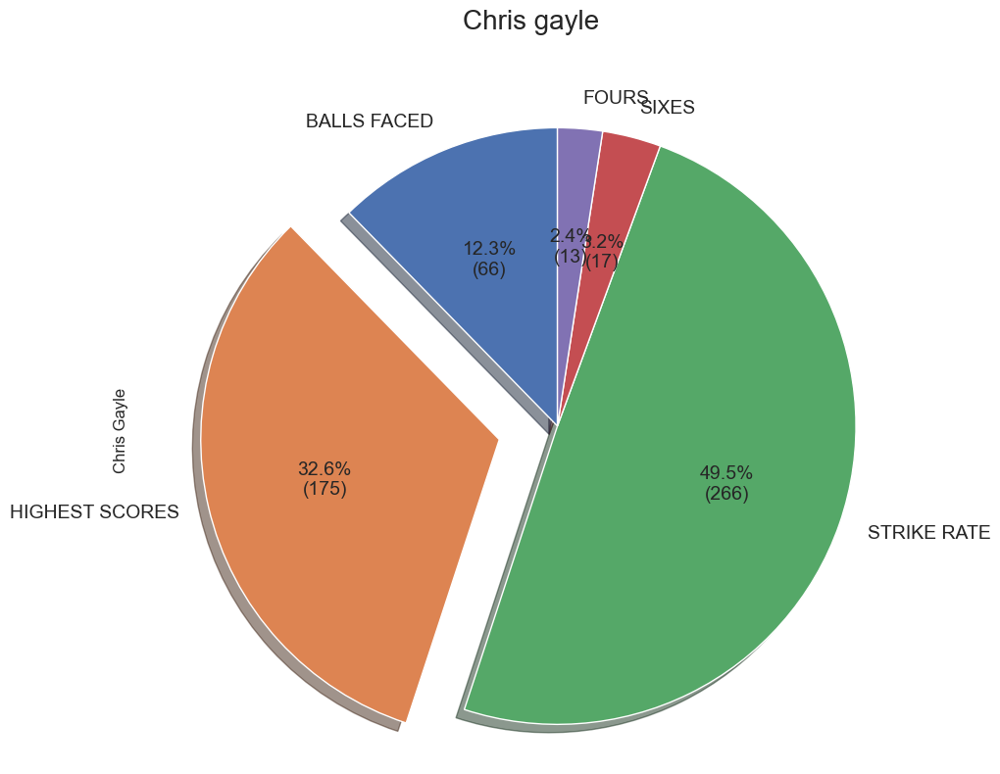

Do you want to check pie chart for more players : YES | NO  no
Thanks For Using My Application... 


In [345]:
while True:  
    
    p_name = input('Enter Player Name To Check His Performance using PIE chart : ')
    player_name = most_runs_hs[most_runs_hs['PLAYERS'].str.lower() == p_name.lower()]

    n = player_name.groupby(by='PLAYERS')['BALLS FACED','HIGHEST SCORES','STRIKE RATE','SIXES','FOURS'].sum()
    a = n.iloc[0]
    a


    plt.figure(figsize=(10,8))

    def func(pct, a):
        absolute = int((pct / 100)*np.sum(a))    
        return "{:.1f}%\n({:d})".format(pct, absolute+1)

    a.plot.pie(autopct = lambda pct: func(pct, a),
                        shadow=True,       
                         startangle=90,
                         explode=(0,0.2,0,0,0),
                         textprops={'fontsize': 14})
    
    plt.title(p_name , fontsize=20,pad=50)

    import matplotlib as mpl
    mpl.rcParams['font.size'] = 10


    plt.axis('equal')
    plt.tight_layout()
    plt.show()
    
    option = input('Do you want to check pie chart for more players : YES | NO  ')
    
    if option.lower() == 'no':
        print('Thanks For Using My Application... ')
        break

                        

                             

                

## <font color = Orange><h1><center>Analysis On Most Points Scored By A Batsman In Overall Season</center></h1></font>

                        

In [346]:
ipl_df_mvp=joblib.load("ipl_df_mvp.pkl")

In [347]:
ipl_df_mvp

,YEARS,TEAMS,PLAYERS,POINTS,MATCHES,DOTS,FOURS,SIXES,CATCHES,RUN OUT,STUMPINGS,WICKETS
0,2008,Chennai Super Kings,Albie Morkel,261.00,13,100,18,14,3,0,0,17
1,2008,Chennai Super Kings,Manpreet Gony,238.00,16,157,2,3,2,1,0,17
2,2008,Chennai Super Kings,Suresh Raina,185.00,16,4,35,18,10,2,0,1
3,2008,Chennai Super Kings,Muttiah Muralitharan,177.50,15,129,0,0,4,0,0,11
4,2008,Chennai Super Kings,MS Dhoni,164.50,16,0,38,15,6,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
1395,2021,Royal Challengers Banglore,Devdutt Padikkal,91.50,6,0,22,9,2,0,0,0
1396,2021,Royal Challengers Banglore,Yuzvendra Chahal,76.50,7,54,0,0,3,1,0,4
1397,2021,Royal Challengers Banglore,Virat Kohli,76.00,7,0,21,4,3,2,0,0
1398,2021,Royal Challengers Banglore,Washington Sundar,52.50,6,32,2,0,2,0,0,3


# Note :- Analysis On  Minimum 286 Points Scored By A Players

In [348]:
# As there are more no. of players its not possible to show it in single graph.
# So I'm Filtering the players who have scored POINTS more than 286.


most_pts = ipl_df_mvp[ipl_df_mvp['POINTS']>=286]

In [349]:
most_pts

,YEARS,TEAMS,PLAYERS,POINTS,MATCHES,DOTS,FOURS,SIXES,CATCHES,RUN OUT,STUMPINGS,WICKETS
65,2008,Mumbai Indians,Sanath Jayasuriya,309.50,14,36,58,31,2,1,0,4
78,2008,Rajasthan Royals,Shane Watson,406.50,15,158,47,19,2,0,0,17
79,2008,Rajasthan Royals,Yusuf Pathan,292.50,16,60,43,25,3,2,0,8
114,2009,Deccan Charges,Adam Gilchrist,286.50,16,0,54,29,10,5,8,0
212,2010,Deccan Charges,Andrew Symonds,329.50,16,107,35,18,12,0,0,12
290,2010,Royal Challengers Banglore,Jacques Kallis,381.00,16,118,67,9,7,1,0,13
352,2011,Mumbai Indians,Lasith Malinga,296.50,16,183,0,1,4,2,0,28
381,2011,Royal Challengers Banglore,Chris Gayle,409.50,12,80,57,44,2,0,0,8
400,2012,Chennai Super Kings,Dwayne Bravo,308.00,19,110,20,20,9,3,0,15
442,2012,Kolakata Knight Riders,Jacques Kallis,290.50,17,112,34,10,2,1,0,15


# BAR PLOT

<Figure size 4800x3000 with 0 Axes>

Text(0.5, 1.0, 'TOP 10 MOST POINTS SCORED BY A PLAYER IN ONE SEASON')

Text(0.5, 0, 'PLAYER NAMES')

Text(0, 0.5, 'POINTS')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27]),
 [Text(0, 0, 'Sanath Jayasuriya'),
  Text(1, 0, 'Shane Watson'),
  Text(2, 0, 'Yusuf Pathan'),
  Text(3, 0, 'Adam Gilchrist'),
  Text(4, 0, 'Andrew Symonds'),
  Text(5, 0, 'Jacques Kallis'),
  Text(6, 0, 'Lasith Malinga'),
  Text(7, 0, 'Chris Gayle'),
  Text(8, 0, 'Dwayne Bravo'),
  Text(9, 0, 'Michael Hussey'),
  Text(10, 0, 'Dale Steyn'),
  Text(11, 0, 'Thisara Perera'),
  Text(12, 0, 'Harbhajan Singh'),
  Text(13, 0, 'Mitchell Johnson'),
  Text(14, 0, 'Kieron Pollard'),
  Text(15, 0, 'James Faulkner'),
  Text(16, 0, 'Glenn Maxwell'),
  Text(17, 0, 'Andre Russell'),
  Text(18, 0, 'David Warner'),
  Text(19, 0, 'Virat Kohli'),
  Text(20, 0, 'AB de Villiers'),
  Text(21, 0, 'Sunil Narine'),
  Text(22, 0, 'Rashid Khan'),
  Text(23, 0, 'Rishabh Pant'),
  Text(24, 0, 'KL Rahul'),
  Text(25, 0, 'Hardik Pandya'),
  Text(26, 0, 'Kagiso Rabada'),
  Text(27, 0, 'Jof

([<matplotlib.axis.YTick at 0x155f4c49670>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

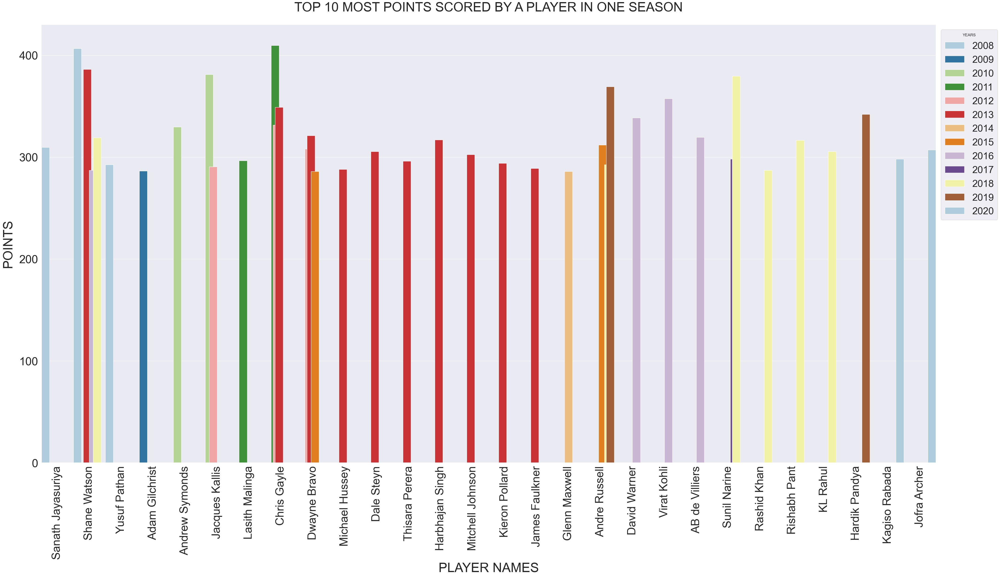

In [350]:
plt.figure(figsize=(48,30))
ax = sns.barplot(x='PLAYERS',y='POINTS',hue = 'YEARS', data=most_pts,palette='Paired',errwidth=20)
plt.title('TOP 10 MOST POINTS SCORED BY A PLAYER IN ONE SEASON',fontsize=40,pad=40)
plt.xlabel('PLAYER NAMES',fontsize=40,labelpad =10)
plt.ylabel('POINTS',fontsize=40,labelpad=15)


y_ticks = np.arange(0, 410 , 100)

plt.xticks(rotation=90,fontsize=35)
plt.yticks(y_ticks,fontsize=35)
ax.legend(title = 'YEARS', bbox_to_anchor = (1,1),fontsize=30)


def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)

change_width(ax, .25)

ax.figure.tight_layout(pad = 20)
#ax.figure.savefig("E:\\DATA SCIENCE\\Batch 91\\Projects\\team_per.png")
plt.show()

# What we can infer from this graph ?


## <font color =Blue>This Are The Top 10 Most Valuable Players Of Overall Seasons.</font>



### - Shane Watson was the <font color = #3193de>Man Of The Tournament</font> In 2008 and 2013.


### - Adam Gilchrist was the <font color = #3193de>Man Of The Tournament</font> In 2009.


### - Jacques Kallis was the <font color = #3193de>Man Of The Tournament</font> In 2010.


### - Chris Gayle was the <font color = #3193de>Man Of The Tournament</font> In 2011 and 2012.


### - Glenn Maxwell was the <font color = #3193de>Man Of The Tournament</font> In 2014.


### - Andre Russell was the <font color = #3193de>Man Of The Tournament</font> In 2015 and 2019.


### - Virat Kohli was the <font color = #3193de>Man Of The Tournament</font> In 2016.


### - Sunil Narine was the <font color = #3193de>Man Of The Tournament</font> In 2017 and 2018.


### - Jofra Archer was the <font color = #3193de>Man Of The Tournament</font> In 2020.


### Shane Watson , Chris Gayle , Andre Russell and Sunil Narine Won 2 times Man Of The Tournament Awards.
### And Rest Of The Players Won 1 Man of the Tournament Award.



# Now lets check the performance of the top 5 Points Scored Players

In [351]:
most_pts_pt = most_pts.sort_values(by='POINTS',ascending=False).head(10)
most_pts_pt = most_pts_pt.iloc[0:5,0:]
most_pts_pt

,YEARS,TEAMS,PLAYERS,POINTS,MATCHES,DOTS,FOURS,SIXES,CATCHES,RUN OUT,STUMPINGS,WICKETS
381,2011,Royal Challengers Banglore,Chris Gayle,409.50,12,80,57,44,2,0,0,8
78,2008,Rajasthan Royals,Shane Watson,406.50,15,158,47,19,2,0,0,17
579,2013,Rajasthan Royals,Shane Watson,386.00,16,101,59,22,6,0,0,13
290,2010,Royal Challengers Banglore,Jacques Kallis,381.00,16,118,67,9,7,1,0,13
1049,2018,Kolakata Knight Riders,Sunil Narine,379.50,16,137,40,23,1,0,0,17


# BAR PLOT

Text(0.5, 1.0, 'PERFORMANCE OF THE TOP 5 HIGHEST POINTS SCORED PLAYERS')

Text(0.5, 0, 'PLAYER NAMES AND POINTS SCORED')

Text(0, 0.5, 'COUNT')

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, '(Chris Gayle, 409.5)'),
  Text(1, 0, '(Jacques Kallis, 381.0)'),
  Text(2, 0, '(Shane Watson, 386.0)'),
  Text(3, 0, '(Shane Watson, 406.5)'),
  Text(4, 0, '(Sunil Narine, 379.5)')])

(array([  0.,  50., 100., 150., 200., 250., 300.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

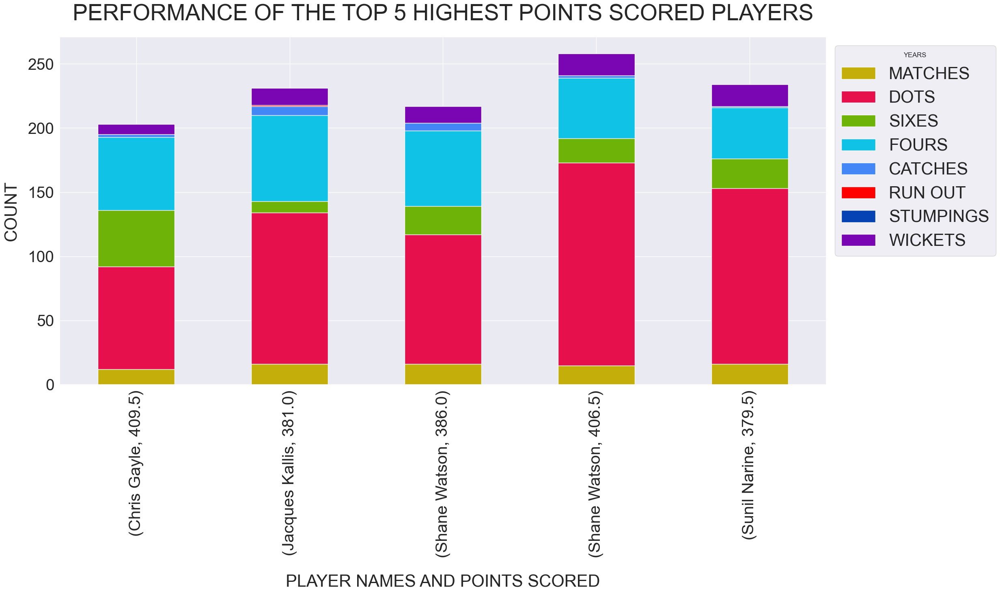

In [352]:
df = most_pts_pt.groupby(by=['PLAYERS','POINTS'])['MATCHES','DOTS','SIXES','FOURS','CATCHES','RUN OUT','STUMPINGS','WICKETS'].mean()

ax = df.plot(kind='bar', figsize=(30,20), color=['#c4af0a',"#e6104d",'#6eb307','#10c2e6','#4287f5','Red','#0542b3','#7905b3'], fontsize=13,stacked=True)

ax.set_alpha(0.8)
plt.title('PERFORMANCE OF THE TOP 5 HIGHEST POINTS SCORED PLAYERS',fontsize=40,pad=30)
plt.xlabel('PLAYER NAMES AND POINTS SCORED',fontsize=30,labelpad =30)
plt.ylabel('COUNT',fontsize=30,labelpad=15)
plt.xticks(rotation=90,fontsize=29)
plt.yticks(fontsize=28)
ax.legend(title = 'YEARS', bbox_to_anchor = (1,1),fontsize=30)


ax.figure.tight_layout(pad = 20)
#ax.figure.savefig("E:\\DATA SCIENCE\\Batch 91\\Projects\\team_per.png")
plt.show()

                        

                             

                

## <font color = Orange><h1><center>Analysis On Most Sixes Hits By A Batsman In Overall Season</center></h1></font>

                        

In [353]:
ipl_df

,YEARS,TEAMS,PLAYERS,MATCHES,INNINGS,NOT OUTS,RUNS,HIGHEST SCORES,AVERAGE,BALLS FACED,STRIKE RATE,HUNDREDS,FIFTY,FOURS,SIXES,OUTS
0,2008,Chennai Super Kings,Suresh Raina,16,14,3,421,55,30.07,296,142.22,0,3,35,18,11
1,2008,Chennai Super Kings,MS Dhoni,16,14,4,414,65,29.57,310,133.54,0,2,38,15,10
2,2008,Chennai Super Kings,Parthiv Patel,13,13,2,302,54,23.23,297,101.68,0,2,42,3,11
3,2008,Chennai Super Kings,Albie Morkel,13,10,3,241,71,24.10,163,147.85,0,1,18,14,7
4,2008,Chennai Super Kings,Stephen Fleming,10,10,1,196,45,19.60,164,119.51,0,0,27,3,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1395,2021,Royal Challengers Banglore,Mohammed Siraj,7,3,3,12,12,4.00,16,75.00,0,0,0,1,0
1396,2021,Royal Challengers Banglore,Yuzvendra Chahal,7,1,1,8,8,8.00,21,38.09,0,0,0,0,0
1397,2021,Royal Challengers Banglore,Daniel Sams,2,2,1,6,3,6.00,6,100.00,0,0,0,0,1
1398,2021,Royal Challengers Banglore,Dan Christian,3,3,0,3,1,1.00,8,37.50,0,0,0,0,3


# Note :- Analysis On  Minimum 29 Sixes Scored By A PLayers

In [354]:
# As there are more no. of players its not possible to show it in single graph.
# So I'm Filtering the players who had Hits more than 29 Sixes.


most_6 = ipl_df[ipl_df['SIXES']>=29]

In [355]:
most_6

,YEARS,TEAMS,PLAYERS,MATCHES,INNINGS,NOT OUTS,RUNS,HIGHEST SCORES,AVERAGE,BALLS FACED,STRIKE RATE,HUNDREDS,FIFTY,FOURS,SIXES,OUTS
60,2008,Mumbai Indians,Sanath Jayasuriya,14,14,2,518,114,37.00,309,167.63,1,2,58,31,12
113,2009,Deccan Charges,Adam Gilchrist,16,16,0,495,85,30.94,325,152.30,0,3,54,29,16
380,2011,Royal Challengers Banglore,Chris Gayle,12,12,3,608,107,50.67,332,183.13,2,3,57,44,9
491,2012,Royal Challengers Banglore,Chris Gayle,15,14,2,733,128,52.36,456,160.74,1,7,46,59,12
559,2013,Mumbai Indians,Kieron Pollard,18,18,8,420,66,23.33,281,149.46,0,3,27,29,10
589,2013,Royal Challengers Banglore,Chris Gayle,16,16,4,708,175,44.25,453,156.29,1,4,57,51,12
600,2014,Chennai Super Kings,Dwayne Smith,16,16,0,566,79,35.38,416,136.05,0,5,50,34,16
635,2014,Kings Xi Punjab,Glenn Maxwell,16,16,0,552,95,34.50,294,187.75,0,4,48,36,16
787,2015,Royal Challengers Banglore,Chris Gayle,14,14,2,491,117,35.07,333,147.44,1,2,39,38,12
800,2016,Sunrises Hyderabad,David Warner,17,17,3,848,93,49.88,560,151.42,0,9,88,31,14


# BAR PLOT

<Figure size 4000x3000 with 0 Axes>

Text(0.5, 1.0, 'MOST NUMBER OF SIXES HIT BY A PLAYER IN OVERALL SEASON')

Text(0.5, 0, 'TEAM NAMES')

Text(0, 0.5, 'RUNS')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16]),
 [Text(0, 0, 'Sanath Jayasuriya'),
  Text(1, 0, 'Adam Gilchrist'),
  Text(2, 0, 'Chris Gayle'),
  Text(3, 0, 'Kieron Pollard'),
  Text(4, 0, 'Dwayne Smith'),
  Text(5, 0, 'Glenn Maxwell'),
  Text(6, 0, 'David Warner'),
  Text(7, 0, 'Virat Kohli'),
  Text(8, 0, 'AB de Villiers'),
  Text(9, 0, 'Ambati Rayudu'),
  Text(10, 0, 'Shane Watson'),
  Text(11, 0, 'MS Dhoni'),
  Text(12, 0, 'Rishabh Pant'),
  Text(13, 0, 'KL Rahul'),
  Text(14, 0, 'Andre Russell'),
  Text(15, 0, 'Hardik Pandya'),
  Text(16, 0, 'Ishan Kishan')])

([<matplotlib.axis.YTick at 0x155f72e7c70>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

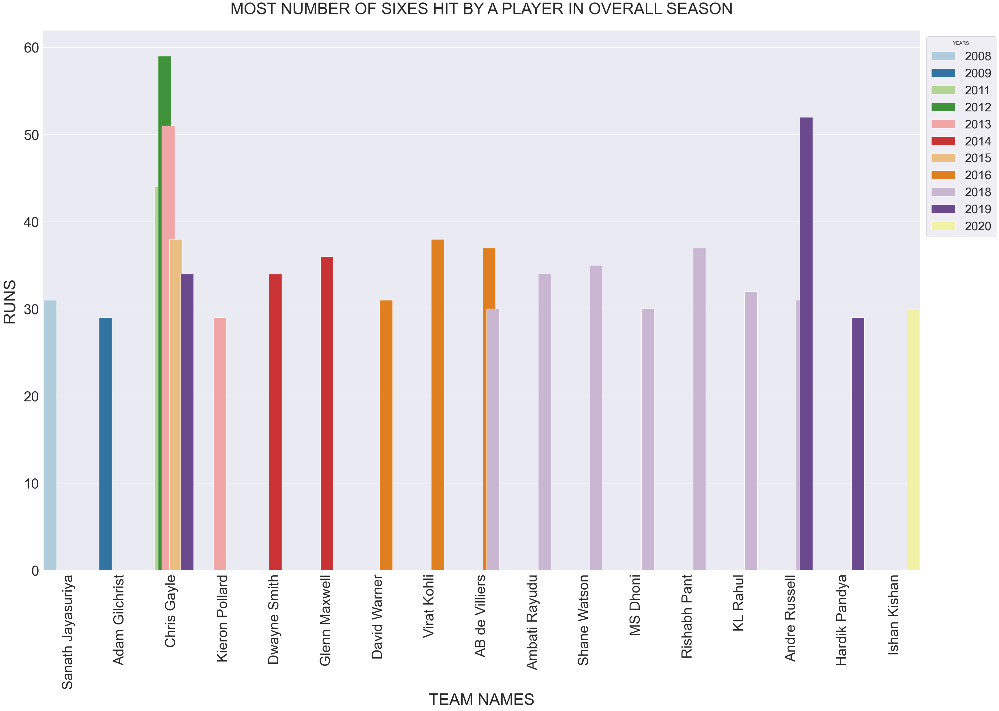

In [356]:
plt.figure(figsize=(40,30))
ax = sns.barplot(x='PLAYERS',y='SIXES',hue = 'YEARS', data=most_6,palette='Paired',errwidth=20)
plt.title('MOST NUMBER OF SIXES HIT BY A PLAYER IN OVERALL SEASON',fontsize=40,pad=40)
plt.xlabel('TEAM NAMES',fontsize=40,labelpad =10)
plt.ylabel('RUNS',fontsize=40,labelpad=15)


y_ticks = np.arange(0, 70 , 10)

plt.xticks(rotation=90,fontsize=35)
plt.yticks(y_ticks,fontsize=35)
ax.legend(title = 'YEARS', bbox_to_anchor = (1,1),fontsize=30)


def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)

change_width(ax, .25)

ax.figure.tight_layout(pad = 20)
#ax.figure.savefig("E:\\DATA SCIENCE\\Batch 91\\Projects\\team_per.png")
plt.show()

# What we can infer from this graph ?


## <font color =Blue>This Are The Top 10 Most Sixes Hiter Players Of Overall Seasons.</font>


- ### Chris Gayle was the <font color = #3193de> Winners Of Maximum Sixes Awards</font> In 2011 ( 44 Sixes ) , 2012 ( 59 Sixes ) , 2013 ( 51 Sixes ) , 2015 ( 38 Sixes ).


- ### Sanath Jayasuriya was the <font color = #3193de> Winner Of Maximum Sixes Awards</font> In 2008.( 31 Sixes )


- ### Adam Gilchrist was the <font color = #3193de> Winner Of Maximum Sixes Awards</font> In 2009. ( 29 Sixes )


- ### Glenn Maxwell was the <font color = #3193de> Winner Of Maximum Sixes Awards</font> In 2014. ( 36 Sixes)


- ### Virat Kohli was the <font color = #3193de> Winner Of Maximum Sixes Awards</font> In 2016. ( 38 Sixes )


- ### Rishabh Pant was the <font color = #3193de>Winner Of Maximum Sixes Awards</font> In 2018. ( 37 Sixes )


- ### Andre Russell was the <font color = #3193de>Winner Of Maximum Sixes Awards</font> In 2019. ( 52 Sixes )



- ### Ishan Kishan was the <font color = #3193de>Winner Of Maximum Sixes Awards</font> In 2020. ( 30 Sixes )


### Chris Gayle  Was 4 times Winner Of Maximum Sixes Awards.
### And Rest Of The Players Won 1 Maximum Sixes Awards.



                        

                             

                

## <font color = Orange><h1><center>Analysis On Most Centuries Scored By A Batsman In Overall Season</center></h1></font>

                        

In [357]:
ipl_df

,YEARS,TEAMS,PLAYERS,MATCHES,INNINGS,NOT OUTS,RUNS,HIGHEST SCORES,AVERAGE,BALLS FACED,STRIKE RATE,HUNDREDS,FIFTY,FOURS,SIXES,OUTS
0,2008,Chennai Super Kings,Suresh Raina,16,14,3,421,55,30.07,296,142.22,0,3,35,18,11
1,2008,Chennai Super Kings,MS Dhoni,16,14,4,414,65,29.57,310,133.54,0,2,38,15,10
2,2008,Chennai Super Kings,Parthiv Patel,13,13,2,302,54,23.23,297,101.68,0,2,42,3,11
3,2008,Chennai Super Kings,Albie Morkel,13,10,3,241,71,24.10,163,147.85,0,1,18,14,7
4,2008,Chennai Super Kings,Stephen Fleming,10,10,1,196,45,19.60,164,119.51,0,0,27,3,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1395,2021,Royal Challengers Banglore,Mohammed Siraj,7,3,3,12,12,4.00,16,75.00,0,0,0,1,0
1396,2021,Royal Challengers Banglore,Yuzvendra Chahal,7,1,1,8,8,8.00,21,38.09,0,0,0,0,0
1397,2021,Royal Challengers Banglore,Daniel Sams,2,2,1,6,3,6.00,6,100.00,0,0,0,0,1
1398,2021,Royal Challengers Banglore,Dan Christian,3,3,0,3,1,1.00,8,37.50,0,0,0,0,3


In [358]:
# As there are more no. of players its not possible to show it in single graph.
# So I'm Filtering the players who had Scored Century more than 1.


most_hd = ipl_df[ipl_df['HUNDREDS']>1]

In [359]:
most_hd

,YEARS,TEAMS,PLAYERS,MATCHES,INNINGS,NOT OUTS,RUNS,HIGHEST SCORES,AVERAGE,BALLS FACED,STRIKE RATE,HUNDREDS,FIFTY,FOURS,SIXES,OUTS
380,2011,Royal Challengers Banglore,Chris Gayle,12,12,3,608,107,50.67,332,183.13,2,3,57,44,9
864,2016,Royal Challengers Banglore,Virat Kohli,16,16,4,973,113,60.81,640,152.03,4,7,83,38,12
924,2017,Kings Xi Punjab,Hashim Amla,10,10,3,420,104,42.00,288,145.83,2,2,40,17,7
1001,2018,Chennai Super Kings,Shane Watson,15,15,1,555,117,37.00,359,154.59,2,2,44,35,14
1225,2020,Delhi Capitals,Shikhar Dhawan,17,17,3,618,106,36.35,427,144.73,2,4,67,12,14


# BAR PLOT

<Figure size 5000x3000 with 0 Axes>

Text(0.5, 1.0, 'MOST NUMBER OF HUNDREDS SCORED BY A PLAYER IN OVERALL SEASON')

Text(0.5, 0, 'TEAM NAMES')

Text(0, 0.5, 'RUNS')

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'Chris Gayle'),
  Text(1, 0, 'Virat Kohli'),
  Text(2, 0, 'Hashim Amla'),
  Text(3, 0, 'Shane Watson'),
  Text(4, 0, 'Shikhar Dhawan')])

([<matplotlib.axis.YTick at 0x155fc612700>,
 [Text(0, 0, ''), Text(0, 0, ''), Text(0, 0, ''), Text(0, 0, '')])

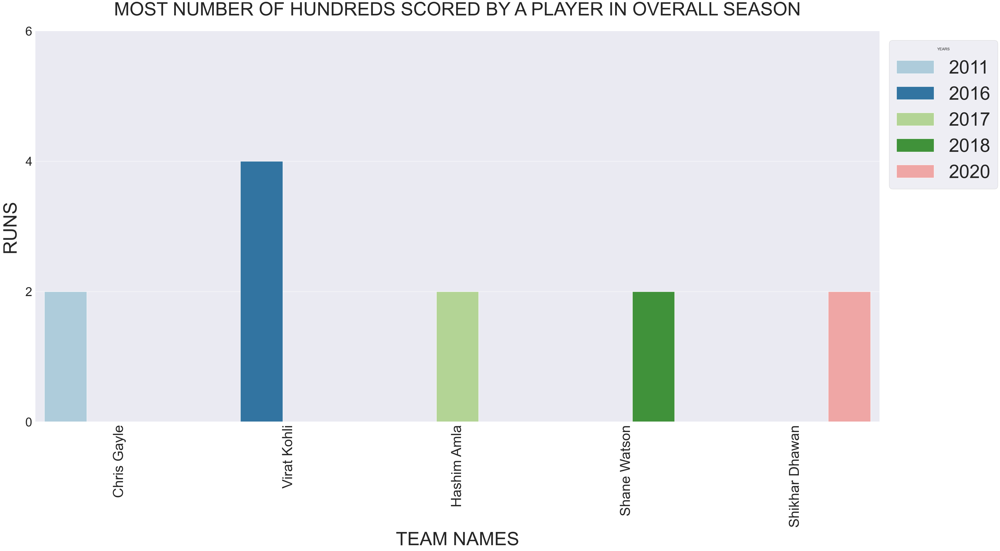

In [360]:
plt.figure(figsize=(50,30))
ax = sns.barplot(x='PLAYERS',y='HUNDREDS',hue = 'YEARS', data=most_hd,palette='Paired',errwidth=20)


plt.title('MOST NUMBER OF HUNDREDS SCORED BY A PLAYER IN OVERALL SEASON',fontsize=60,pad=50)
plt.xlabel('TEAM NAMES',fontsize=60,labelpad =15)
plt.ylabel('RUNS',fontsize=60,labelpad=20)


y_ticks = np.arange(0, 8 , 2)

plt.xticks(rotation=90,fontsize=45)
plt.yticks(y_ticks,fontsize=40)
ax.legend(title = 'YEARS', bbox_to_anchor = (1,1),fontsize=60)


def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)

change_width(ax, .25) 

ax.figure.tight_layout(pad = 20)
#ax.figure.savefig("E:\\DATA SCIENCE\\Batch 91\\Projects\\team_per.png")
plt.show()

# What we can infer from this graph ?


- ### This are the Top 5 Players who have scored More than 1 Centuries In One season.


- ### Where Virat Kohli is the only Player who has scored 4 Centuries In on Season.

# Now lets check the performance of the top 5 Hundreds Scored By A Players

# BOX PLOT

Text(0.5, 1.0, 'PERFORMANCE OF THE TOP 5 HUNDRED SCORED BY A PLAYERS')

Text(0.5, 0, 'PLAYER NAMES AND HUNDRED')

Text(0, 0.5, 'COUNT')

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, '(Chris Gayle, 2)'),
  Text(1, 0, '(Hashim Amla, 2)'),
  Text(2, 0, '(Shane Watson, 2)'),
  Text(3, 0, '(Shikhar Dhawan, 2)'),
  Text(4, 0, '(Virat Kohli, 4)')])

(array([  0.,  25.,  50.,  75., 100., 125., 150., 175., 200.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

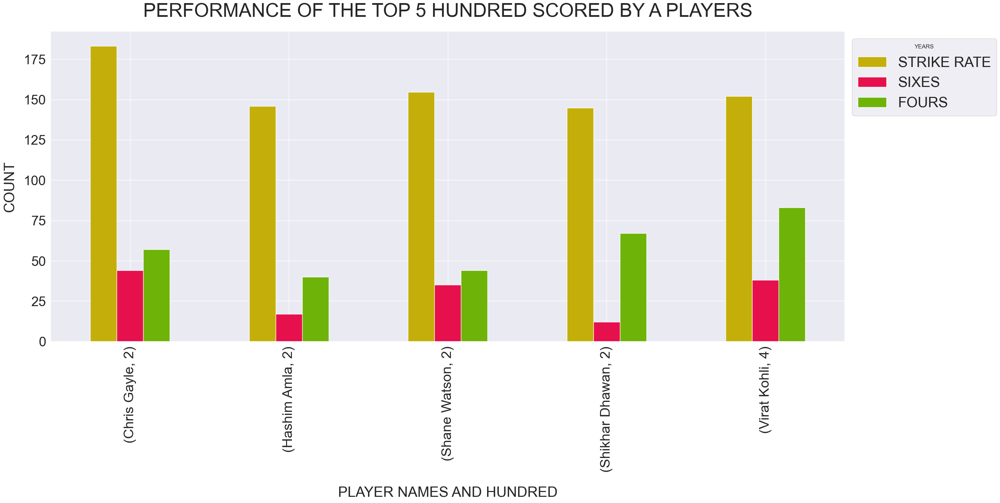

In [361]:
df = most_hd.groupby(by=['PLAYERS','HUNDREDS'])['STRIKE RATE','SIXES','FOURS'].mean()

ax = df.plot(kind='bar', figsize=(30,20), color=['#c4af0a',"#e6104d",'#6eb307','#10c2e6','#4287f5'], fontsize=13,stacked=False)

ax.set_alpha(0.8)
plt.title('PERFORMANCE OF THE TOP 5 HUNDRED SCORED BY A PLAYERS',fontsize=40,pad=30)
plt.xlabel('PLAYER NAMES AND HUNDRED',fontsize=30,labelpad =30)
plt.ylabel('COUNT',fontsize=30,labelpad=15)
plt.xticks(rotation=90,fontsize=29)
plt.yticks(fontsize=28)
ax.legend(title = 'YEARS', bbox_to_anchor = (1,1),fontsize=30)


ax.figure.tight_layout(pad = 20)
#ax.figure.savefig("E:\\DATA SCIENCE\\Batch 91\\Projects\\team_per.png")
plt.show()

                        

                             

                

## <font color = Orange><h1><center>Analysis On Most Fifties Scored By A Batsman In Overall Season</center></h1></font>

                        

In [362]:
ipl_df

,YEARS,TEAMS,PLAYERS,MATCHES,INNINGS,NOT OUTS,RUNS,HIGHEST SCORES,AVERAGE,BALLS FACED,STRIKE RATE,HUNDREDS,FIFTY,FOURS,SIXES,OUTS
0,2008,Chennai Super Kings,Suresh Raina,16,14,3,421,55,30.07,296,142.22,0,3,35,18,11
1,2008,Chennai Super Kings,MS Dhoni,16,14,4,414,65,29.57,310,133.54,0,2,38,15,10
2,2008,Chennai Super Kings,Parthiv Patel,13,13,2,302,54,23.23,297,101.68,0,2,42,3,11
3,2008,Chennai Super Kings,Albie Morkel,13,10,3,241,71,24.10,163,147.85,0,1,18,14,7
4,2008,Chennai Super Kings,Stephen Fleming,10,10,1,196,45,19.60,164,119.51,0,0,27,3,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1395,2021,Royal Challengers Banglore,Mohammed Siraj,7,3,3,12,12,4.00,16,75.00,0,0,0,1,0
1396,2021,Royal Challengers Banglore,Yuzvendra Chahal,7,1,1,8,8,8.00,21,38.09,0,0,0,0,0
1397,2021,Royal Challengers Banglore,Daniel Sams,2,2,1,6,3,6.00,6,100.00,0,0,0,0,1
1398,2021,Royal Challengers Banglore,Dan Christian,3,3,0,3,1,1.00,8,37.50,0,0,0,0,3


# Note :- Analysis On  Minimum 5 Fifties Scored By A PLayers

In [363]:
# As there are more no. of players its not possible to show it in single graph.
# So I'm Filtering the players who had Scored Fifty more than 5.


most_ff = ipl_df[ipl_df['FIFTY']>5]

In [364]:
most_ff

,YEARS,TEAMS,PLAYERS,MATCHES,INNINGS,NOT OUTS,RUNS,HIGHEST SCORES,AVERAGE,BALLS FACED,STRIKE RATE,HUNDREDS,FIFTY,FOURS,SIXES,OUTS
289,2010,Royal Challengers Banglore,Jacques Kallis,16,16,4,572,89,35.75,494,115.78,0,6,67,9,12
446,2012,Kolakata Knight Riders,Gautam Gambhir,17,17,2,590,93,34.71,411,143.55,0,6,64,17,15
491,2012,Royal Challengers Banglore,Chris Gayle,15,14,2,733,128,52.36,456,160.74,1,7,46,59,12
500,2013,Chennai Super Kings,Michael Hussey,17,17,3,733,95,43.12,566,129.50,0,6,81,17,14
590,2013,Royal Challengers Banglore,Virat Kohli,16,16,2,634,99,39.62,457,138.73,0,6,64,22,14
610,2014,Sunrises Hyderabad,David Warner,14,14,3,528,90,37.71,375,140.80,0,6,39,24,11
711,2015,Sunrises Hyderabad,David Warner,14,14,1,562,91,40.14,359,156.54,0,7,65,21,13
762,2015,Mumbai Indians,Lendl Simmons,13,13,1,540,71,41.54,441,122.44,0,6,56,21,12
800,2016,Sunrises Hyderabad,David Warner,17,17,3,848,93,49.88,560,151.42,0,9,88,31,14
864,2016,Royal Challengers Banglore,Virat Kohli,16,16,4,973,113,60.81,640,152.03,4,7,83,38,12


# BAR PLOT

<Figure size 4000x3000 with 0 Axes>

Text(0.5, 1.0, 'MOST NUMBER OF FIFTIES SCORED BY A PLAYER IN OVERALL SEASON')

Text(0.5, 0, 'TEAM NAMES')

Text(0, 0.5, 'RUNS')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'Jacques Kallis'),
  Text(1, 0, 'Gautam Gambhir'),
  Text(2, 0, 'Chris Gayle'),
  Text(3, 0, 'Michael Hussey'),
  Text(4, 0, 'Virat Kohli'),
  Text(5, 0, 'David Warner'),
  Text(6, 0, 'Lendl Simmons'),
  Text(7, 0, 'AB de Villiers'),
  Text(8, 0, 'Ajinkya Rahane'),
  Text(9, 0, 'Kane Williamson'),
  Text(10, 0, 'KL Rahul')])

([<matplotlib.axis.YTick at 0x1560023c3d0>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

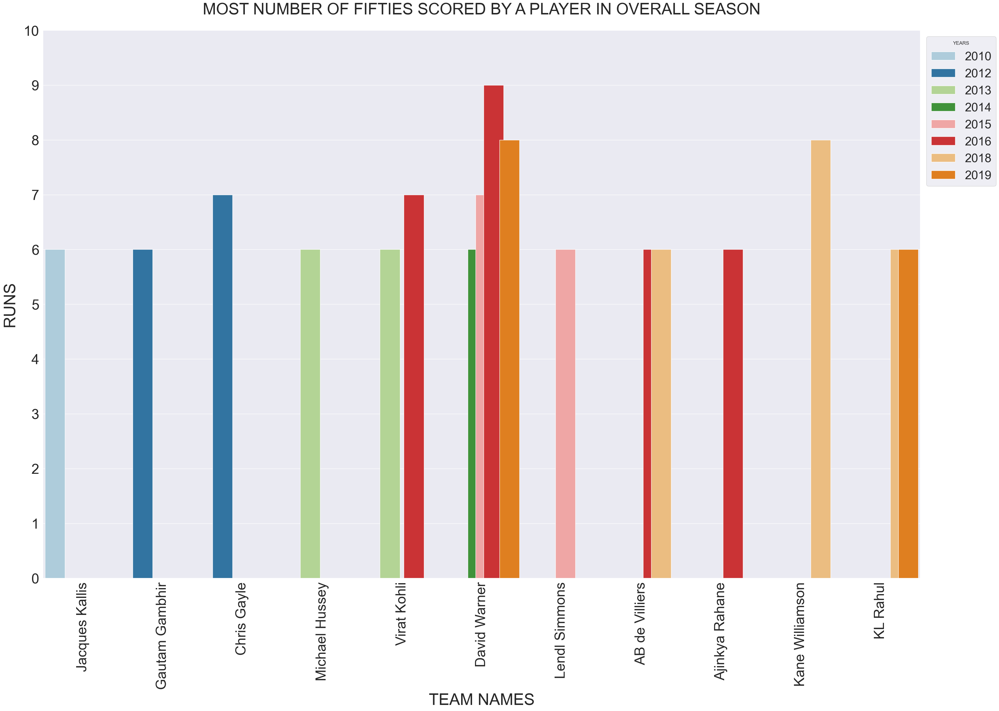

In [365]:
plt.figure(figsize=(40,30))
ax = sns.barplot(x='PLAYERS',y='FIFTY',hue = 'YEARS', data=most_ff,palette='Paired',errwidth=20)
plt.title('MOST NUMBER OF FIFTIES SCORED BY A PLAYER IN OVERALL SEASON',fontsize=40,pad=40)
plt.xlabel('TEAM NAMES',fontsize=40,labelpad =10)
plt.ylabel('RUNS',fontsize=40,labelpad=15)


y_ticks = np.arange(0, 11 , 1)

plt.xticks(rotation=90,fontsize=35)
plt.yticks(y_ticks,fontsize=35)
ax.legend(title = 'YEARS', bbox_to_anchor = (1,1),fontsize=30)


def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)

change_width(ax, .25)

ax.figure.tight_layout(pad = 20)
#ax.figure.savefig("E:\\DATA SCIENCE\\Batch 91\\Projects\\team_per.png")
plt.show()

### David Warner Has Set the record of scoring more number of fifties in one season with ( 9 Fifties ).

                        

                             

                

## <font color = Orange><h1><center>Analysis On Most Fours Hitten By A Batsman In Overall Season</center></h1></font>

                        

In [366]:
ipl_df

,YEARS,TEAMS,PLAYERS,MATCHES,INNINGS,NOT OUTS,RUNS,HIGHEST SCORES,AVERAGE,BALLS FACED,STRIKE RATE,HUNDREDS,FIFTY,FOURS,SIXES,OUTS
0,2008,Chennai Super Kings,Suresh Raina,16,14,3,421,55,30.07,296,142.22,0,3,35,18,11
1,2008,Chennai Super Kings,MS Dhoni,16,14,4,414,65,29.57,310,133.54,0,2,38,15,10
2,2008,Chennai Super Kings,Parthiv Patel,13,13,2,302,54,23.23,297,101.68,0,2,42,3,11
3,2008,Chennai Super Kings,Albie Morkel,13,10,3,241,71,24.10,163,147.85,0,1,18,14,7
4,2008,Chennai Super Kings,Stephen Fleming,10,10,1,196,45,19.60,164,119.51,0,0,27,3,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1395,2021,Royal Challengers Banglore,Mohammed Siraj,7,3,3,12,12,4.00,16,75.00,0,0,0,1,0
1396,2021,Royal Challengers Banglore,Yuzvendra Chahal,7,1,1,8,8,8.00,21,38.09,0,0,0,0,0
1397,2021,Royal Challengers Banglore,Daniel Sams,2,2,1,6,3,6.00,6,100.00,0,0,0,0,1
1398,2021,Royal Challengers Banglore,Dan Christian,3,3,0,3,1,1.00,8,37.50,0,0,0,0,3


# Note :- Analysis On  Minimum 65 Fours Scored By A PLayers

In [367]:
# As there are more no. of players its not possible to show it in single graph.
# So I'm Filtering the players who had Hits  more than 65 Fours.


most_4 = ipl_df[ipl_df['FOURS']>65]

In [368]:
most_4

,YEARS,TEAMS,PLAYERS,MATCHES,INNINGS,NOT OUTS,RUNS,HIGHEST SCORES,AVERAGE,BALLS FACED,STRIKE RATE,HUNDREDS,FIFTY,FOURS,SIXES,OUTS
23,2008,Delhi Capitals,Gautam Gambhir,14,14,1,534,86,38.14,379,140.89,0,5,68,8,13
264,2010,Mumbai Indians,Sachin Tendulkar,15,15,2,618,89,41.20,466,132.61,0,5,86,3,13
289,2010,Royal Challengers Banglore,Jacques Kallis,16,16,4,572,89,35.75,494,115.78,0,6,67,9,12
350,2011,Mumbai Indians,Sachin Tendulkar,16,16,3,553,100,34.56,488,113.31,1,2,67,5,13
481,2012,Rajasthan Royals,Ajinkya Rahane,16,16,2,560,103,35.00,433,129.33,1,3,73,10,14
500,2013,Chennai Super Kings,Michael Hussey,17,17,3,733,95,43.12,566,129.50,0,6,81,17,14
647,2014,Kolakata Knight Riders,Robin Uthappa,16,16,1,660,83,41.25,479,137.78,0,5,74,18,15
800,2016,Sunrises Hyderabad,David Warner,17,17,3,848,93,49.88,560,151.42,0,9,88,31,14
864,2016,Royal Challengers Banglore,Virat Kohli,16,16,4,973,113,60.81,640,152.03,4,7,83,38,12
1025,2018,Delhi Capitals,Rishabh Pant,14,14,1,684,128,48.86,394,173.60,1,5,68,37,13


# BOX PLOT

<Figure size 4000x3000 with 0 Axes>

Text(0.5, 1.0, 'MOST NUMBER OF FOURS HIT BY A PLAYER IN OVERALL SEASON')

Text(0.5, 0, 'TEAM NAMES')

Text(0, 0.5, 'RUNS')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'Gautam Gambhir'),
  Text(1, 0, 'Sachin Tendulkar'),
  Text(2, 0, 'Jacques Kallis'),
  Text(3, 0, 'Ajinkya Rahane'),
  Text(4, 0, 'Michael Hussey'),
  Text(5, 0, 'Robin Uthappa'),
  Text(6, 0, 'David Warner'),
  Text(7, 0, 'Virat Kohli'),
  Text(8, 0, 'Rishabh Pant'),
  Text(9, 0, 'KL Rahul'),
  Text(10, 0, 'Shikhar Dhawan')])

([<matplotlib.axis.YTick at 0x155e7de2ca0>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

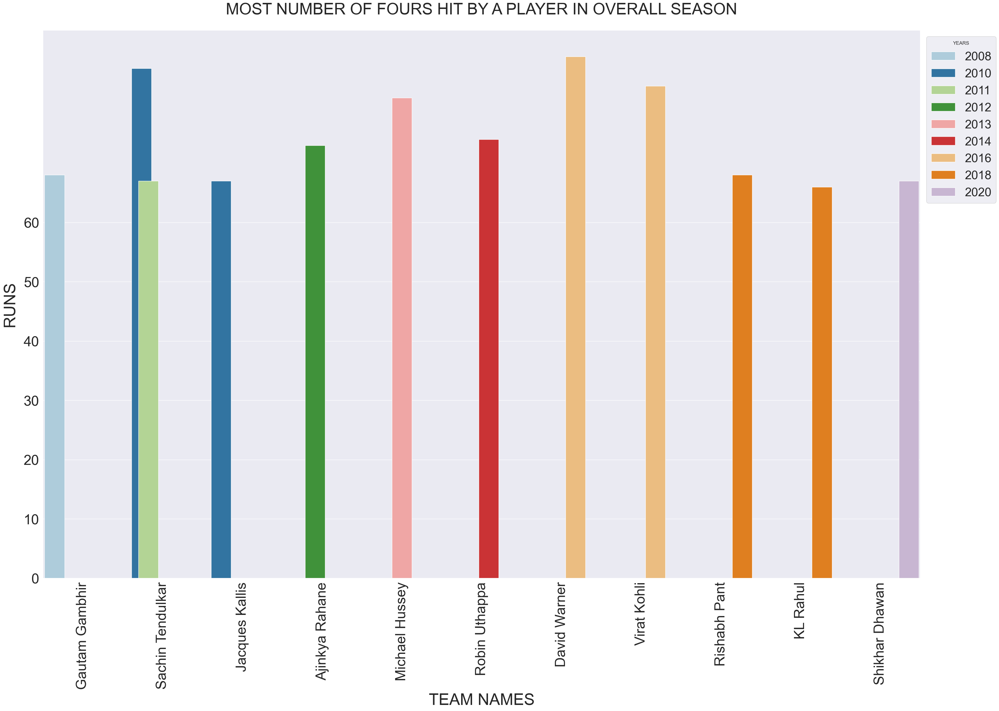

In [369]:
plt.figure(figsize=(40,30))
ax = sns.barplot(x='PLAYERS',y='FOURS',hue = 'YEARS', data=most_4,palette='Paired',errwidth=20)
plt.title('MOST NUMBER OF FOURS HIT BY A PLAYER IN OVERALL SEASON',fontsize=40,pad=40)
plt.xlabel('TEAM NAMES',fontsize=40,labelpad =10)
plt.ylabel('RUNS',fontsize=40,labelpad=15)


y_ticks = np.arange(0, 70 , 10)

plt.xticks(rotation=90,fontsize=35)
plt.yticks(y_ticks,fontsize=35)
ax.legend(title = 'YEARS', bbox_to_anchor = (1,1),fontsize=30)


def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)

change_width(ax, .25)

ax.figure.tight_layout(pad = 20)
#ax.figure.savefig("E:\\DATA SCIENCE\\Batch 91\\Projects\\team_per.png")
plt.show()

### David Warner Has Set the record of hitting more number of fours in one season with ( 88 Fours).

# <font color = #0c89cc><h1><center>ANALYSIS ON ENTIRE SEASONS</center></h1></font>

                        

                             

                

## <font color = Orange><h1><center>Analysis On Most Runs Scored By A Batsman</center></h1></font>

                        

In [370]:
final_df

,PLAYERS,MATCHES,INNINGS,RUNS,BALLS FACED,HUNDREDS,FIFTY,FOURS,SIXES,HIGHEST SCORES,STRIKE RATE,AVERAGE,NOT OUTS,OUTS
0,AB de Villiers,161,149,4591,2963,2,37,367,233,55,154,39.92,154,115
1,Aakash Chopra,7,6,53,71,0,0,7,0,65,74,8.83,74,6
2,Aaron Finch,86,84,1984,1549,0,14,204,74,54,128,25.77,128,77
3,Abdul Samad,16,12,147,91,0,0,9,9,71,161,18.38,161,8
4,Abhimanyu Mithun,12,6,27,20,0,0,3,1,45,135,9.00,135,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
382,Yogesh Takawale,5,5,104,91,0,0,17,1,65,114,20.80,114,5
383,Yusuf Pathan,174,154,3204,2241,1,13,262,158,59,142,29.13,142,110
384,Yuvraj Singh,132,126,2750,2120,0,13,217,149,42,129,24.77,129,111
385,Yuzvendra Chahal,7,1,8,21,0,0,0,0,41,38,inf,38,0


# Note :- Analysis On  Minimum 3000 Runs Scored By A Players

In [371]:
# As there are more no. of players its not possible to show it in single graph.
# So I'm Filtering the players who have scored runs more than 3000.

final_runs = final_df[final_df['RUNS']>3000]

In [372]:
final_runs

,PLAYERS,MATCHES,INNINGS,RUNS,BALLS FACED,HUNDREDS,FIFTY,FOURS,SIXES,HIGHEST SCORES,STRIKE RATE,AVERAGE,NOT OUTS,OUTS
0,AB de Villiers,161,149,4591,2963,2,37,367,233,55,154,39.92,154,115
16,Ajinkya Rahane,149,139,3937,3231,2,28,416,76,36,121,32.01,121,123
24,Ambati Rayudu,166,156,3795,2970,1,20,314,145,94,127,29.65,127,128
69,Chris Gayle,140,139,4950,3312,6,31,404,357,19,149,40.24,149,123
87,David Warner,141,141,5284,3755,4,49,509,196,54,140,43.31,140,122
97,Dinesh Karthik,188,171,3658,2821,0,18,370,100,16,129,25.58,129,143
111,Gautam Gambhir,139,137,3931,3126,0,35,459,57,13,125,32.22,125,122
169,Kieron Pollard,171,154,3191,2115,0,16,207,211,62,150,30.68,150,104
187,MS Dhoni,211,186,4669,3417,0,23,317,217,66,136,40.25,136,116
193,Manish Pandey,148,138,3458,2833,1,20,300,101,32,122,30.88,122,112


# Bar PLot

<Figure size 4000x2700 with 0 Axes>

Text(0.5, 1.0, 'MOST RUNS SCORED BY A PLAYER')

Text(0.5, 0, 'PLAYER NAMES')

Text(0, 0.5, 'RUNS')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16]),
 [Text(0, 0, 'AB de Villiers'),
  Text(1, 0, 'Ajinkya Rahane'),
  Text(2, 0, 'Ambati Rayudu'),
  Text(3, 0, 'Chris Gayle'),
  Text(4, 0, 'David Warner'),
  Text(5, 0, 'Dinesh Karthik'),
  Text(6, 0, 'Gautam Gambhir'),
  Text(7, 0, 'Kieron Pollard'),
  Text(8, 0, 'MS Dhoni'),
  Text(9, 0, 'Manish Pandey'),
  Text(10, 0, 'Robin Uthappa'),
  Text(11, 0, 'Rohit Sharma'),
  Text(12, 0, 'Shane Watson'),
  Text(13, 0, 'Shikhar Dhawan'),
  Text(14, 0, 'Suresh Raina'),
  Text(15, 0, 'Virat Kohli'),
  Text(16, 0, 'Yusuf Pathan')])

([<matplotlib.axis.YTick at 0x155f4edbb80>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


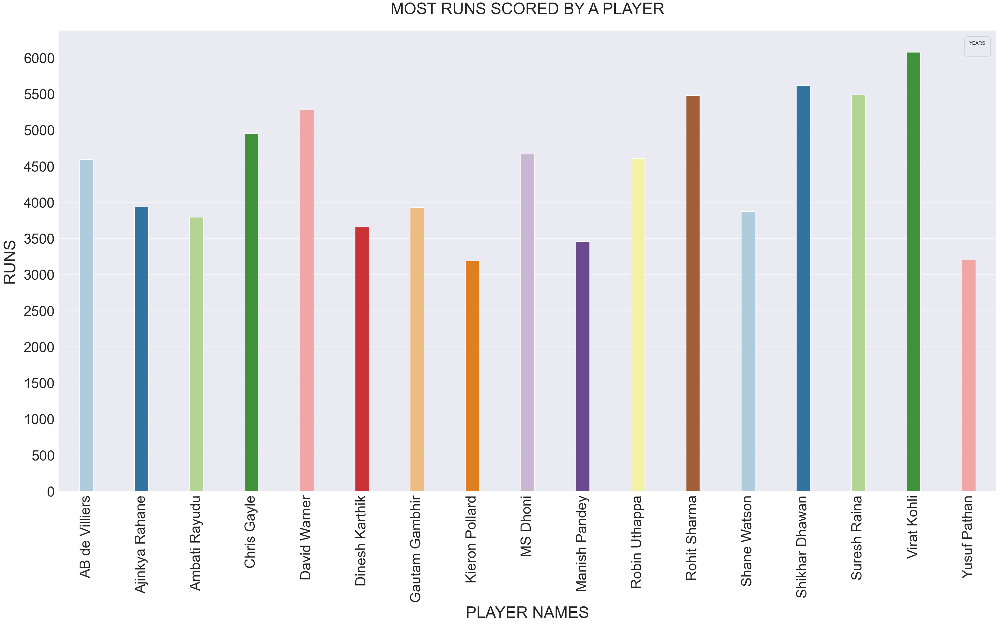

In [373]:
plt.figure(figsize=(40,27))
ax = sns.barplot(x='PLAYERS',y='RUNS',data=final_runs,palette='Paired',errwidth=20)
plt.title('MOST RUNS SCORED BY A PLAYER',fontsize=40,pad=40)
plt.xlabel('PLAYER NAMES',fontsize=40,labelpad =10)
plt.ylabel('RUNS',fontsize=40,labelpad=15)


y_ticks = np.arange(0, 6500, 500)

plt.xticks(rotation=90,fontsize=35)
plt.yticks(y_ticks,fontsize=35)
ax.legend(title = 'YEARS', bbox_to_anchor = (1,1),fontsize=30)


def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)

change_width(ax, .25)

ax.figure.tight_layout(pad = 20)
#ax.figure.savefig("E:\\DATA SCIENCE\\Batch 91\\Projects\\team_per.png")
plt.show()

# What we can infer from this graph ?


- ### As we can see from the above graph , Virat Kohli has scored the highest number of runs ( 6029 Runs ) for the entire IPL SEASON.


- ### Shikhar Dhawan ( 5496 Runs ) is the second-highest run scorer.


- ### Suresh Raina ( 5472 Runs ) is the third-highest run scorer.


- ### Rohit Sharma ( 5431 Runs ) is the fourth-highest run scorer.


### Shikhar Dhawan , Suresh Raina , and Rohit Sharma there is a big competition between them. Let's who will win the race.

In [374]:
final_runs.sort_values(by='RUNS',ascending=False).head(10)

,PLAYERS,MATCHES,INNINGS,RUNS,BALLS FACED,HUNDREDS,FIFTY,FOURS,SIXES,HIGHEST SCORES,STRIKE RATE,AVERAGE,NOT OUTS,OUTS
370,Virat Kohli,199,191,6076,4659,5,40,524,205,16,130,37.98,130,160
320,Shikhar Dhawan,189,187,5617,4424,2,44,637,116,60,126,34.67,126,162
345,Suresh Raina,200,195,5491,4011,1,39,502,202,66,136,33.08,136,166
287,Rohit Sharma,207,202,5480,4199,1,40,476,224,26,130,31.49,130,174
87,David Warner,141,141,5284,3755,4,49,509,196,54,140,43.31,140,122
69,Chris Gayle,140,139,4950,3312,6,31,404,357,19,149,40.24,149,123
187,MS Dhoni,211,186,4669,3417,0,23,317,217,66,136,40.25,136,116
284,Robin Uthappa,189,182,4607,3544,0,24,454,163,45,129,27.92,129,165
0,AB de Villiers,161,149,4591,2963,2,37,367,233,55,154,39.92,154,115
16,Ajinkya Rahane,149,139,3937,3231,2,28,416,76,36,121,32.01,121,123


# Lets check the performance of this top 5 players

In [375]:
final_runs_ms = final_runs.sort_values(by='RUNS',ascending=False).head(10)
final_runs_ms = final_runs_ms.iloc[0:5,0:]
final_runs_ms

,PLAYERS,MATCHES,INNINGS,RUNS,BALLS FACED,HUNDREDS,FIFTY,FOURS,SIXES,HIGHEST SCORES,STRIKE RATE,AVERAGE,NOT OUTS,OUTS
370,Virat Kohli,199,191,6076,4659,5,40,524,205,16,130,37.98,130,160
320,Shikhar Dhawan,189,187,5617,4424,2,44,637,116,60,126,34.67,126,162
345,Suresh Raina,200,195,5491,4011,1,39,502,202,66,136,33.08,136,166
287,Rohit Sharma,207,202,5480,4199,1,40,476,224,26,130,31.49,130,174
87,David Warner,141,141,5284,3755,4,49,509,196,54,140,43.31,140,122


# BAR PLOT

Text(0.5, 1.0, 'PERFORMANCE OF THE TOP 5 MOST RUNS SCORED PLAYERS')

Text(0.5, 0, 'PLAYER NAMES AND RUNS SCORED')

Text(0, 0.5, 'COUNT')

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, '(David Warner, 5284)'),
  Text(1, 0, '(Rohit Sharma, 5480)'),
  Text(2, 0, '(Shikhar Dhawan, 5617)'),
  Text(3, 0, '(Suresh Raina, 5491)'),
  Text(4, 0, '(Virat Kohli, 6076)')])

([<matplotlib.axis.YTick at 0x155f4fa04f0>,
 [Text(0, 0, ''), Text(0, 0, '')])

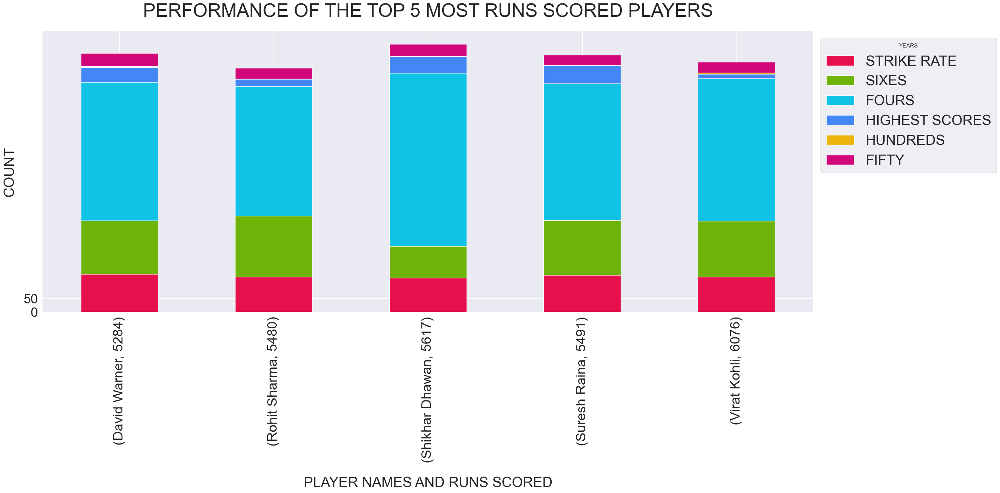

In [376]:
df = final_runs_ms.groupby(by=['PLAYERS','RUNS'])['STRIKE RATE','SIXES','FOURS','HIGHEST SCORES','HUNDREDS','FIFTY'].mean()

ax = df.plot(kind='bar', figsize=(35,20), color=["#e6104d",'#6eb307','#10c2e6','#4287f5','#ebb609','#d10679'], fontsize=13,stacked=True)


y_ticks = np.arange(0, 100 , 50)
ax.set_alpha(0.8)
plt.title('PERFORMANCE OF THE TOP 5 MOST RUNS SCORED PLAYERS',fontsize=40,pad=30)
plt.xlabel('PLAYER NAMES AND RUNS SCORED',fontsize=30,labelpad =30)
plt.ylabel('COUNT',fontsize=30,labelpad=15)
plt.xticks(rotation=90,fontsize=29)
plt.yticks(y_ticks,fontsize=28)
ax.legend(title = 'YEARS', bbox_to_anchor = (1,1),fontsize=30)





ax.figure.tight_layout(pad = 20)
#ax.figure.savefig("E:\\DATA SCIENCE\\Batch 91\\Projects\\team_per.png")
plt.show()

# PIE PLOT

In [377]:
final_runs_ms

,PLAYERS,MATCHES,INNINGS,RUNS,BALLS FACED,HUNDREDS,FIFTY,FOURS,SIXES,HIGHEST SCORES,STRIKE RATE,AVERAGE,NOT OUTS,OUTS
370,Virat Kohli,199,191,6076,4659,5,40,524,205,16,130,37.98,130,160
320,Shikhar Dhawan,189,187,5617,4424,2,44,637,116,60,126,34.67,126,162
345,Suresh Raina,200,195,5491,4011,1,39,502,202,66,136,33.08,136,166
287,Rohit Sharma,207,202,5480,4199,1,40,476,224,26,130,31.49,130,174
87,David Warner,141,141,5284,3755,4,49,509,196,54,140,43.31,140,122


In [378]:
name = final_runs_ms[final_runs_ms['PLAYERS']=='Virat Kohli']

In [379]:
name

,PLAYERS,MATCHES,INNINGS,RUNS,BALLS FACED,HUNDREDS,FIFTY,FOURS,SIXES,HIGHEST SCORES,STRIKE RATE,AVERAGE,NOT OUTS,OUTS
370,Virat Kohli,199,191,6076,4659,5,40,524,205,16,130,37.98,130,160


In [380]:
n = name.groupby(by='PLAYERS')['RUNS','BALLS FACED','HIGHEST SCORES','STRIKE RATE','SIXES','FOURS'].sum()

In [381]:
a = n.iloc[0]
a

RUNS              6076
BALLS FACED       4659
HIGHEST SCORES      16
STRIKE RATE        130
SIXES              205
FOURS              524
Name: Virat Kohli, dtype: int32

<Figure size 1100x1500 with 0 Axes>

<AxesSubplot:ylabel='Virat Kohli'>

Text(0.5, 1.0, 'Virat Kohli')

(-1.1088122124689217,
 1.1225688268879677,
 -1.1098247360268196,
 1.1004678487757162)

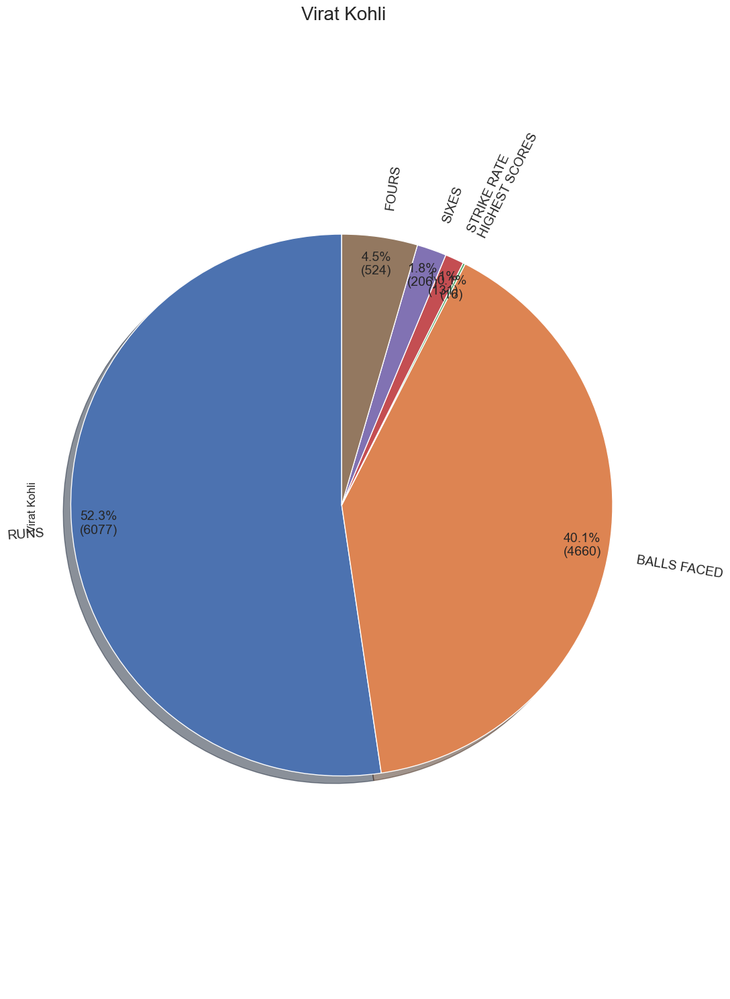

In [382]:

plt.figure(figsize=(11,15))

def func(pct, a):
    absolute = int((pct / 100)*np.sum(a))    
    return "{:.1f}%\n({:d})".format(pct, absolute+1)

a.plot.pie(autopct = lambda pct: func(pct, a),
           shadow=True,       
           startangle=90,
           explode=(0,0,0,0,0,0),
           textprops={'fontsize': 14},
           pctdistance=0.9,
          rotatelabels = True)

plt.title("Virat Kohli", fontsize=20,pad=1)

import matplotlib as mpl
mpl.rcParams['font.size'] = 10


plt.axis('equal')
plt.tight_layout()
plt.show()

- ### Virat Kohli:-
    - ###  Virat Kohli has scored 6041 Runs in 4625 Balls in which his highest score is 113 , in which his strike rate was 31 and he has hit 204 Sixes and 521 Fours.

# LINE PLOT YEAR WISE PERFORMANCE IN ENTIRE SEASON  OF VIRAT KOHLI

In [383]:
virat = ipl_df[ipl_df['PLAYERS']=='Virat Kohli']

In [384]:
virat

,YEARS,TEAMS,PLAYERS,MATCHES,INNINGS,NOT OUTS,RUNS,HIGHEST SCORES,AVERAGE,BALLS FACED,STRIKE RATE,HUNDREDS,FIFTY,FOURS,SIXES,OUTS
88,2008,Royal Challengers Banglore,Virat Kohli,13,12,1,165,38,13.75,157,105.09,0,0,18,4,11
186,2009,Royal Challengers Banglore,Virat Kohli,16,13,2,246,50,18.92,219,112.32,0,1,22,8,11
291,2010,Royal Challengers Banglore,Virat Kohli,16,13,2,307,58,23.62,212,144.81,0,1,26,12,11
381,2011,Royal Challengers Banglore,Virat Kohli,16,16,4,557,71,34.81,460,121.08,0,4,55,16,12
492,2012,Royal Challengers Banglore,Virat Kohli,16,15,2,364,73,24.27,326,111.65,0,2,33,9,13
590,2013,Royal Challengers Banglore,Virat Kohli,16,16,2,634,99,39.62,457,138.73,0,6,64,22,14
687,2014,Royal Challengers Banglore,Virat Kohli,14,14,1,359,73,25.64,294,122.10,0,2,23,16,13
786,2015,Royal Challengers Banglore,Virat Kohli,16,16,5,505,82,31.56,386,130.82,0,3,35,23,11
864,2016,Royal Challengers Banglore,Virat Kohli,16,16,4,973,113,60.81,640,152.03,4,7,83,38,12
965,2017,Royal Challengers Banglore,Virat Kohli,10,10,0,308,64,30.80,252,122.22,0,4,23,11,10


Text(0.5, 1.0, 'YEAR vs PLAYER\nVIRAT KOHLI')

Text(0.5, 0, 'YEARS')

Text(0, 0.5, 'PERFOEMANCE')

([<matplotlib.axis.XTick at 0x155f50b9f70>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

([<matplotlib.axis.YTick at 0x155f50be9a0>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

(array([2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018,
        2019, 2020, 2021]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

(array([  0,  10,  20,  30,  40,  50,  60,  70,  80,  90, 100, 110, 120,
        130, 140, 150, 160, 170]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

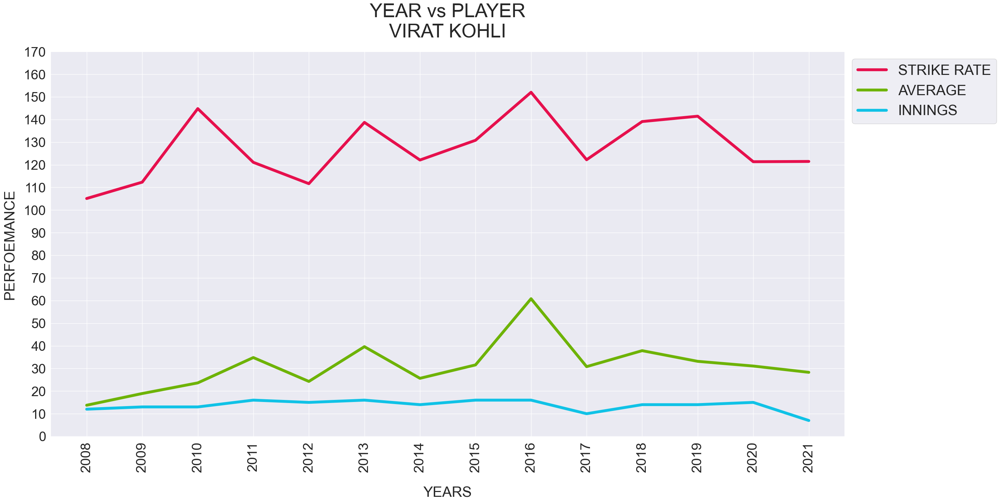

In [385]:
df = virat.groupby(by=['YEARS'])['STRIKE RATE','AVERAGE','INNINGS'].mean()

ax = df.plot(kind='line',figsize=(30,20),linewidth=6, color=["#e6104d",'#6eb307','#10c2e6','#4287f5'], fontsize=13)

ax.set_alpha(0.8)
plt.title('YEAR vs PLAYER'+'\n'+'VIRAT KOHLI',fontsize=40,pad=30)

plt.xlabel('YEARS',fontsize=30,labelpad =30)
plt.ylabel('PERFOEMANCE',fontsize=30,labelpad=15)


x_ticks = np.arange(2008, 2022, 1)
plt.xticks(x_ticks,fontsize=28)


y_ticks = np.arange(0, 180, 10)
plt.yticks(y_ticks,fontsize=28)

plt.xticks(rotation=90,fontsize=29)
plt.yticks(fontsize=28)



ax.legend(bbox_to_anchor = (1,1),fontsize=30)


ax.figure.tight_layout(pad = 20)
ax.figure.savefig("team_per.png")
plt.show()

- ### In 2016 Season Virat Kohli Performance was Good.
- ### As we can see in 2016 he played 17 innings.
- ### And his Average Runs Scored in most of the innings is around 60.81.
- ### Where his Strike Rate is around 152.03 .

# <font color = red><h1><center>Take Player Name as a  Dynamical Input from the user to check Player Performance in PIE chart</center></h1></font>

Enter Player Name To Check His Year Wise Performance : Virat Kohli


RUNS              6076
BALLS FACED       4659
HIGHEST SCORES      16
STRIKE RATE        130
SIXES              205
FOURS              524
Name: Virat Kohli, dtype: int32

<Figure size 1000x800 with 0 Axes>

<AxesSubplot:ylabel='Virat Kohli'>

Text(0.5, 1.0, 'Virat Kohli')

(-1.3182478360897985,
 1.1325419518222952,
 -1.1252104293337366,
 1.1012005008379504)

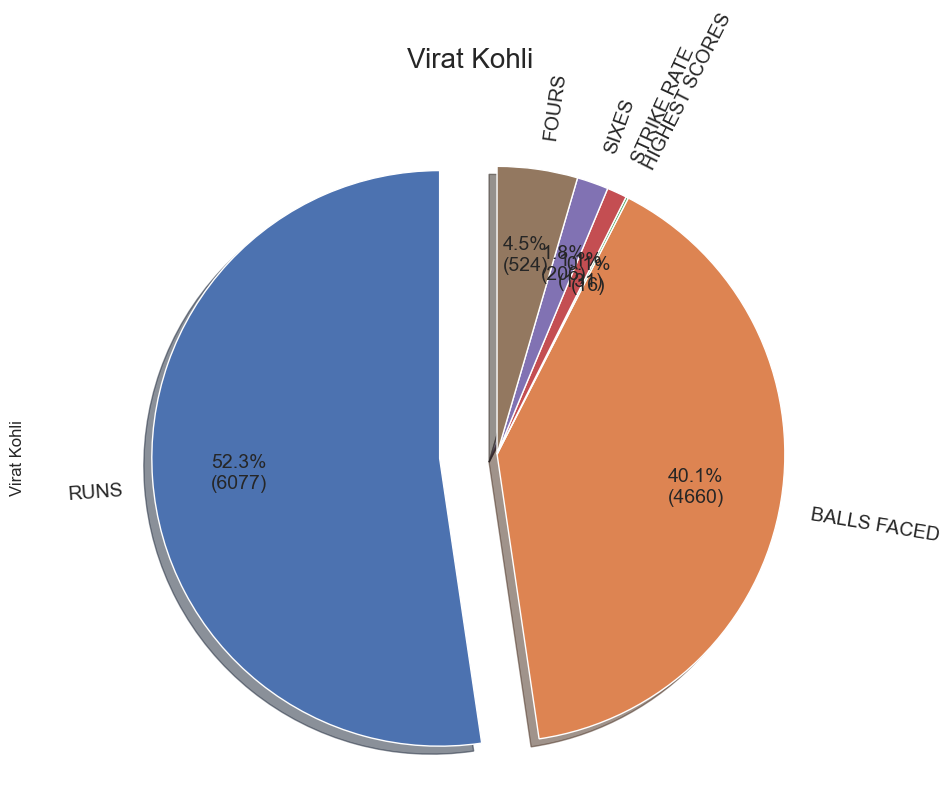

Do you want to check pie chart for more players : YES | NO  no
Thank For Using My Application !!!!


In [386]:
while True:   
    
    p_name = input('Enter Player Name To Check His Year Wise Performance : ')
    player_name = final_df[final_df['PLAYERS'].str.lower() == p_name.lower()]
    
    n = player_name.groupby(by='PLAYERS')['RUNS','BALLS FACED','HIGHEST SCORES','STRIKE RATE','SIXES','FOURS'].sum()

    a = n.iloc[0]
    a


    plt.figure(figsize=(10,8))

    def func(pct, a):
        absolute = int((pct / 100)*np.sum(a))    
        return "{:.1f}%\n({:d})".format(pct, absolute+1)

    a.plot.pie(autopct = lambda pct: func(pct, a),
                        shadow=True,       
                         startangle=90,
                         explode=(0.2,0,0,0,0,0),
                         textprops={'fontsize': 14},
                         pctdistance=0.7,
                         rotatelabels = True)
    
    plt.title(p_name , fontsize=20,pad=50)

    import matplotlib as mpl
    mpl.rcParams['font.size'] = 10


    plt.axis('equal')
    plt.tight_layout()
    plt.show()
    
    option = input('Do you want to check pie chart for more players : YES | NO  ')
    
    if option.lower() == 'no':
        print('Thank For Using My Application !!!!')
        break

# <font color = red><h1><center>Take Player Name as a  Dynamical Input from the user to check Player Performance Year Wise</center></h1></font>

Enter Player Name To Check His Year Wise Performance : David Warner


Text(0.5, 1.0, 'YEAR vs PLAYER\ndavid warner')

Text(0.5, 0, 'YEARS')

Text(0, 0.5, 'PERFOEMANCE')

([<matplotlib.axis.XTick at 0x155f5865a00>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

([<matplotlib.axis.YTick at 0x155f5194490>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

(array([2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018,
        2019, 2020, 2021]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

(array([  0,  10,  20,  30,  40,  50,  60,  70,  80,  90, 100, 110, 120,
        130, 140, 150, 160, 170]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

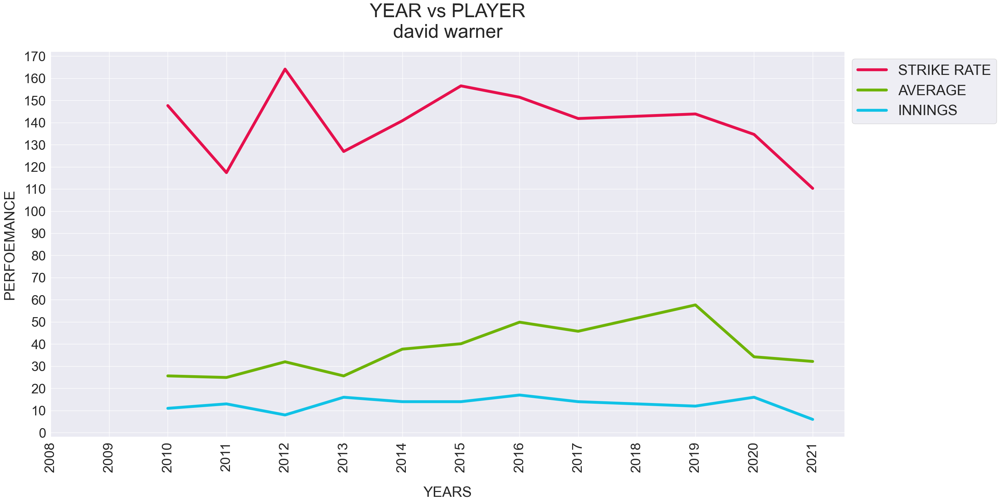

Do You Want To Check For Another Player: YES | NO no
Thanks For Using This Application !!!


In [387]:
while True:
    
    p_name = input('Enter Player Name To Check His Year Wise Performance : ').lower()
    player_name = ipl_df[ipl_df['PLAYERS'].str.lower() == p_name]
    
    df = player_name.groupby(by=['YEARS'])['STRIKE RATE','AVERAGE','INNINGS'].mean()

    ax = df.plot(kind='line',figsize=(30,20),linewidth=6, color=["#e6104d",'#6eb307','#10c2e6','#4287f5'], fontsize=13)

    ax.set_alpha(0.8)
    plt.title('YEAR vs PLAYER'+'\n'+p_name,fontsize=40,pad=30)

    plt.xlabel('YEARS',fontsize=30,labelpad =30)
    plt.ylabel('PERFOEMANCE',fontsize=30,labelpad=15)


    x_ticks = np.arange(2008, 2022, 1)
    plt.xticks(x_ticks,fontsize=28)


    y_ticks = np.arange(0, 180, 10)
    plt.yticks(y_ticks,fontsize=28)

    plt.xticks(rotation=90,fontsize=29)
    plt.yticks(fontsize=28)



    ax.legend(bbox_to_anchor = (1,1),fontsize=30)


    ax.figure.tight_layout(pad = 20)
#     ax.figure.savefig("E:\\DATA SCIENCE\\Batch 91\\Projects\\team_per.png")
    plt.show()
                   
    option = input('Do You Want To Check For Another Player: YES | NO ')
    
    if option.lower() == 'no':
        print('Thanks For Using This Application !!!')
        break
                   

                        

                             

                

## <font color = Orange><h1><center>Analysis On Most Sixes Hits By A Batsman In Overall Season</center></h1></font>

                        

In [388]:
final_df

,PLAYERS,MATCHES,INNINGS,RUNS,BALLS FACED,HUNDREDS,FIFTY,FOURS,SIXES,HIGHEST SCORES,STRIKE RATE,AVERAGE,NOT OUTS,OUTS
0,AB de Villiers,161,149,4591,2963,2,37,367,233,55,154,39.92,154,115
1,Aakash Chopra,7,6,53,71,0,0,7,0,65,74,8.83,74,6
2,Aaron Finch,86,84,1984,1549,0,14,204,74,54,128,25.77,128,77
3,Abdul Samad,16,12,147,91,0,0,9,9,71,161,18.38,161,8
4,Abhimanyu Mithun,12,6,27,20,0,0,3,1,45,135,9.00,135,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
382,Yogesh Takawale,5,5,104,91,0,0,17,1,65,114,20.80,114,5
383,Yusuf Pathan,174,154,3204,2241,1,13,262,158,59,142,29.13,142,110
384,Yuvraj Singh,132,126,2750,2120,0,13,217,149,42,129,24.77,129,111
385,Yuzvendra Chahal,7,1,8,21,0,0,0,0,41,38,inf,38,0


# Note :- Analysis On  Minimum 150 Sixes Scored By A PLayers

In [389]:
# As there are more no. of players its not possible to show it in single graph.
# So I'm Filtering the players who had Hits  more than 150 Sixes.


final_most_6 = final_df[final_df['SIXES']>150]

In [390]:
final_most_6

,PLAYERS,MATCHES,INNINGS,RUNS,BALLS FACED,HUNDREDS,FIFTY,FOURS,SIXES,HIGHEST SCORES,STRIKE RATE,AVERAGE,NOT OUTS,OUTS
0,AB de Villiers,161,149,4591,2963,2,37,367,233,55,154,39.92,154,115
69,Chris Gayle,140,139,4950,3312,6,31,404,357,19,149,40.24,149,123
87,David Warner,141,141,5284,3755,4,49,509,196,54,140,43.31,140,122
169,Kieron Pollard,171,154,3191,2115,0,16,207,211,62,150,30.68,150,104
187,MS Dhoni,211,186,4669,3417,0,23,317,217,66,136,40.25,136,116
284,Robin Uthappa,189,182,4607,3544,0,24,454,163,45,129,27.92,129,165
287,Rohit Sharma,207,202,5480,4199,1,40,476,224,26,130,31.49,130,174
313,Shane Watson,145,141,3874,2809,4,21,376,190,30,137,30.99,137,125
345,Suresh Raina,200,195,5491,4011,1,39,502,202,66,136,33.08,136,166
370,Virat Kohli,199,191,6076,4659,5,40,524,205,16,130,37.98,130,160


# BOX PLOT

<Figure size 4000x3000 with 0 Axes>

Text(0.5, 1.0, 'MOST NUMBER OF SIXES HIT BY A PLAYER')

Text(0.5, 0, 'TEAM NAMES')

Text(0, 0.5, 'Sixes')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'AB de Villiers'),
  Text(1, 0, 'Chris Gayle'),
  Text(2, 0, 'David Warner'),
  Text(3, 0, 'Kieron Pollard'),
  Text(4, 0, 'MS Dhoni'),
  Text(5, 0, 'Robin Uthappa'),
  Text(6, 0, 'Rohit Sharma'),
  Text(7, 0, 'Shane Watson'),
  Text(8, 0, 'Suresh Raina'),
  Text(9, 0, 'Virat Kohli'),
  Text(10, 0, 'Yusuf Pathan')])

([<matplotlib.axis.YTick at 0x155f5244d30>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


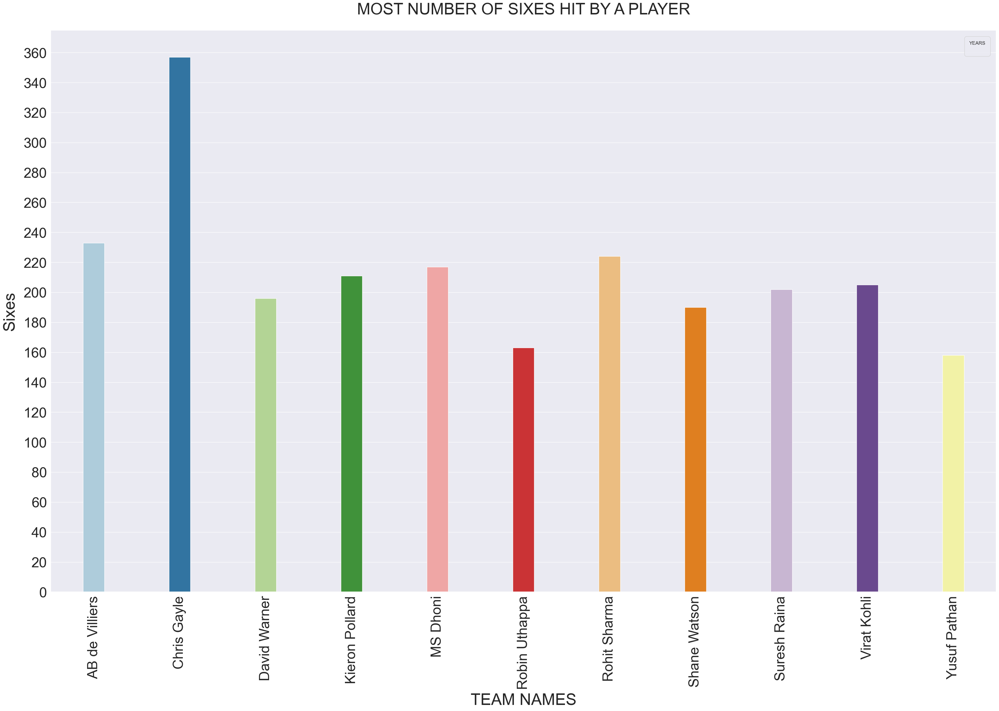

In [391]:
plt.figure(figsize=(40,30))
ax = sns.barplot(x='PLAYERS',y='SIXES',data=final_most_6,palette='Paired',errwidth=20)
plt.title('MOST NUMBER OF SIXES HIT BY A PLAYER',fontsize=40,pad=40)
plt.xlabel('TEAM NAMES',fontsize=40,labelpad =10)
plt.ylabel('Sixes',fontsize=40,labelpad=15)


y_ticks = np.arange(0, 380 , 20)

plt.xticks(rotation=90,fontsize=35)
plt.yticks(y_ticks,fontsize=35)
ax.legend(title = 'YEARS', bbox_to_anchor = (1,1),fontsize=30)


def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)

change_width(ax, .25)

ax.figure.tight_layout(pad = 20)
#ax.figure.savefig("E:\\DATA SCIENCE\\Batch 91\\Projects\\team_per.png")
plt.show()

### Chris Gayle is at the Top In Most Sixes Hits List with ( 354 Sixes In the Entire IPL Season )
### AB de Villiers is at the second position In Most Sixes Hits List with ( 228 Sixes In the Entire IPL Season )
### Rohit Sharma is at the third position In Most Sixes Hits List with ( 222 Sixes In the Entire IPL Season )


                        

                             

                

## <font color = Orange><h1><center>Analysis On Most Centuries Scored By A Batsman In Overall Season</center></h1></font>

                        

In [392]:
final_df

,PLAYERS,MATCHES,INNINGS,RUNS,BALLS FACED,HUNDREDS,FIFTY,FOURS,SIXES,HIGHEST SCORES,STRIKE RATE,AVERAGE,NOT OUTS,OUTS
0,AB de Villiers,161,149,4591,2963,2,37,367,233,55,154,39.92,154,115
1,Aakash Chopra,7,6,53,71,0,0,7,0,65,74,8.83,74,6
2,Aaron Finch,86,84,1984,1549,0,14,204,74,54,128,25.77,128,77
3,Abdul Samad,16,12,147,91,0,0,9,9,71,161,18.38,161,8
4,Abhimanyu Mithun,12,6,27,20,0,0,3,1,45,135,9.00,135,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
382,Yogesh Takawale,5,5,104,91,0,0,17,1,65,114,20.80,114,5
383,Yusuf Pathan,174,154,3204,2241,1,13,262,158,59,142,29.13,142,110
384,Yuvraj Singh,132,126,2750,2120,0,13,217,149,42,129,24.77,129,111
385,Yuzvendra Chahal,7,1,8,21,0,0,0,0,41,38,inf,38,0


In [393]:
# As there are more no. of players its not possible to show it in single graph.
# So I'm Filtering the players who had Scored Century more than 1.


final_most_hd = final_df[final_df['HUNDREDS']>1]

In [394]:
final_most_hd

,PLAYERS,MATCHES,INNINGS,RUNS,BALLS FACED,HUNDREDS,FIFTY,FOURS,SIXES,HIGHEST SCORES,STRIKE RATE,AVERAGE,NOT OUTS,OUTS
0,AB de Villiers,161,149,4591,2963,2,37,367,233,55,154,39.92,154,115
10,Adam Gilchrist,80,80,2069,1495,2,11,239,92,109,138,27.22,138,76
16,Ajinkya Rahane,149,139,3937,3231,2,28,416,76,36,121,32.01,121,123
54,Ben Stokes,42,41,920,681,2,2,79,32,20,135,26.29,135,35
61,Brendon McCullum,108,108,2874,2179,2,13,292,130,48,131,27.90,131,103
69,Chris Gayle,140,139,4950,3312,6,31,404,357,19,149,40.24,149,123
87,David Warner,141,141,5284,3755,4,49,509,196,54,140,43.31,140,122
122,Hashim Amla,16,16,577,407,2,3,60,21,20,141,44.38,141,13
156,KL Rahul,83,77,2958,2176,2,25,257,120,62,135,47.71,135,62
227,Murali Vijay,105,105,2607,2139,2,13,247,90,69,121,26.07,121,100


# BAR PLOT

<Figure size 5000x3000 with 0 Axes>

Text(0.5, 1.0, 'MOST NUMBER OF HUNDREDS SCORED BY A PLAYER')

Text(0.5, 0, 'TEAM NAMES')

Text(0, 0.5, 'HUNDREDS')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 [Text(0, 0, 'AB de Villiers'),
  Text(1, 0, 'Adam Gilchrist'),
  Text(2, 0, 'Ajinkya Rahane'),
  Text(3, 0, 'Ben Stokes'),
  Text(4, 0, 'Brendon McCullum'),
  Text(5, 0, 'Chris Gayle'),
  Text(6, 0, 'David Warner'),
  Text(7, 0, 'Hashim Amla'),
  Text(8, 0, 'KL Rahul'),
  Text(9, 0, 'Murali Vijay'),
  Text(10, 0, 'Sanju Samson'),
  Text(11, 0, 'Shane Watson'),
  Text(12, 0, 'Shikhar Dhawan'),
  Text(13, 0, 'Virat Kohli'),
  Text(14, 0, 'Virender Sehwag')])

([<matplotlib.axis.YTick at 0x155f5302820>,
 [Text(0, 0, ''), Text(0, 0, ''), Text(0, 0, ''), Text(0, 0, '')])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


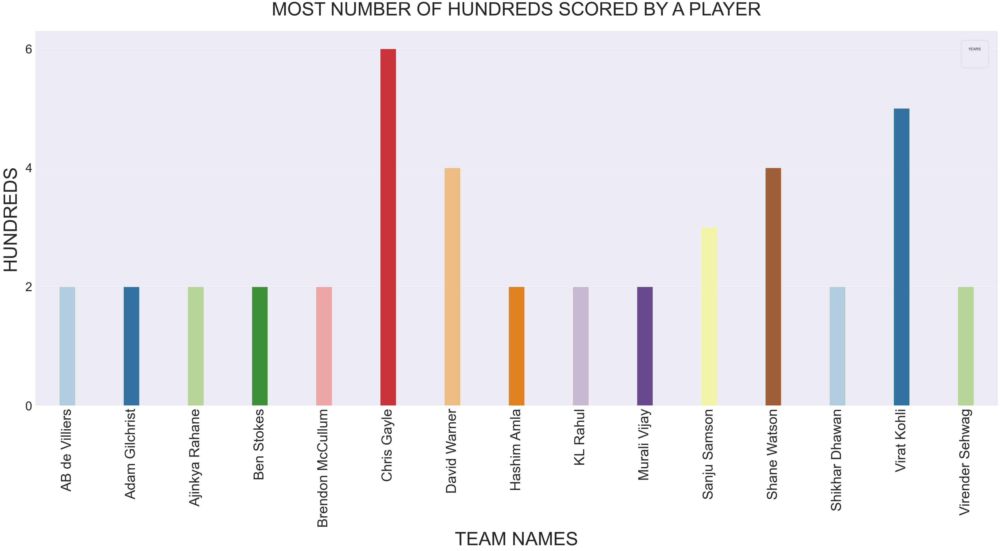

In [395]:
plt.figure(figsize=(50,30))
ax = sns.barplot(x='PLAYERS',y='HUNDREDS',data=final_most_hd,palette='Paired',errwidth=20)


plt.title('MOST NUMBER OF HUNDREDS SCORED BY A PLAYER',fontsize=60,pad=50)
plt.xlabel('TEAM NAMES',fontsize=60,labelpad =15)
plt.ylabel('HUNDREDS',fontsize=60,labelpad=20)


y_ticks = np.arange(0, 8 , 2)

plt.xticks(rotation=90,fontsize=45)
plt.yticks(y_ticks,fontsize=40)
ax.legend(title = 'YEARS', bbox_to_anchor = (1,1),fontsize=60)


def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)

change_width(ax, .25) 

ax.figure.tight_layout(pad = 20)
#ax.figure.savefig("E:\\DATA SCIENCE\\Batch 91\\Projects\\team_per.png")
plt.show()

### Chris Gayle is at the Top In Most Centuries List with ( 6 Centuries In the Entire IPL Season )
### Virat Kohli is at the second position In Most Centuries List with ( 5 Centuries In the Entire IPL Season )
### Shane Watson and David Warner is at the third position In Most Centuries List with ( 4 Centuries In the Entire IPL Season )

# Now lets check the performance of the top 5 Hundreds Scored By A Players

# BOX PLOT

Text(0.5, 1.0, 'PERFORMANCE OF THE TOP 5 HUNDRED SCORED BY A PLAYERS')

Text(0.5, 0, 'PLAYER NAMES AND HUNDRED')

Text(0, 0.5, 'COUNT')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 [Text(0, 0, '(AB de Villiers, 2)'),
  Text(1, 0, '(Adam Gilchrist, 2)'),
  Text(2, 0, '(Ajinkya Rahane, 2)'),
  Text(3, 0, '(Ben Stokes, 2)'),
  Text(4, 0, '(Brendon McCullum, 2)'),
  Text(5, 0, '(Chris Gayle, 6)'),
  Text(6, 0, '(David Warner, 4)'),
  Text(7, 0, '(Hashim Amla, 2)'),
  Text(8, 0, '(KL Rahul, 2)'),
  Text(9, 0, '(Murali Vijay, 2)'),
  Text(10, 0, '(Sanju Samson, 3)'),
  Text(11, 0, '(Shane Watson, 4)'),
  Text(12, 0, '(Shikhar Dhawan, 2)'),
  Text(13, 0, '(Virat Kohli, 5)'),
  Text(14, 0, '(Virender Sehwag, 2)')])

(array([  0., 100., 200., 300., 400., 500., 600., 700.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

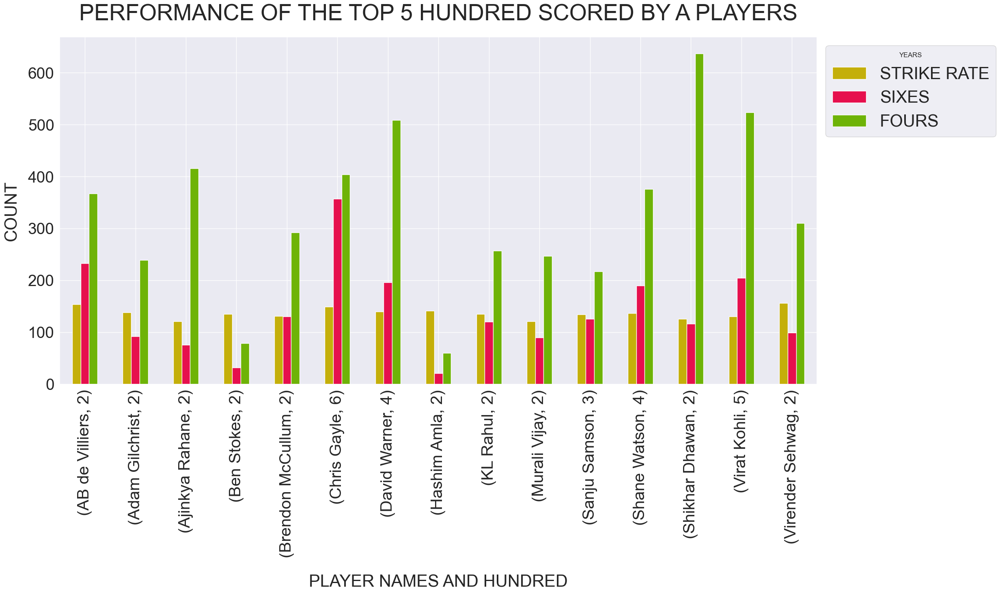

In [396]:
df = final_most_hd.groupby(by=['PLAYERS','HUNDREDS'])['STRIKE RATE','SIXES','FOURS'].mean()

ax = df.plot(kind='bar', figsize=(30,20), color=['#c4af0a',"#e6104d",'#6eb307','#10c2e6','#4287f5'], fontsize=13,stacked=False)

ax.set_alpha(0.8)
plt.title('PERFORMANCE OF THE TOP 5 HUNDRED SCORED BY A PLAYERS',fontsize=40,pad=30)
plt.xlabel('PLAYER NAMES AND HUNDRED',fontsize=30,labelpad =30)
plt.ylabel('COUNT',fontsize=30,labelpad=15)
plt.xticks(rotation=90,fontsize=29)
plt.yticks(fontsize=28)
ax.legend(title = 'YEARS', bbox_to_anchor = (1,1),fontsize=30)


ax.figure.tight_layout(pad = 20)
#ax.figure.savefig("E:\\DATA SCIENCE\\Batch 91\\Projects\\team_per.png")
plt.show()

                        

                             

                

## <font color = Orange><h1><center>Analysis On Most Fifties Scored By A Batsman In Overall Season</center></h1></font>

                        

In [397]:
final_df

,PLAYERS,MATCHES,INNINGS,RUNS,BALLS FACED,HUNDREDS,FIFTY,FOURS,SIXES,HIGHEST SCORES,STRIKE RATE,AVERAGE,NOT OUTS,OUTS
0,AB de Villiers,161,149,4591,2963,2,37,367,233,55,154,39.92,154,115
1,Aakash Chopra,7,6,53,71,0,0,7,0,65,74,8.83,74,6
2,Aaron Finch,86,84,1984,1549,0,14,204,74,54,128,25.77,128,77
3,Abdul Samad,16,12,147,91,0,0,9,9,71,161,18.38,161,8
4,Abhimanyu Mithun,12,6,27,20,0,0,3,1,45,135,9.00,135,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
382,Yogesh Takawale,5,5,104,91,0,0,17,1,65,114,20.80,114,5
383,Yusuf Pathan,174,154,3204,2241,1,13,262,158,59,142,29.13,142,110
384,Yuvraj Singh,132,126,2750,2120,0,13,217,149,42,129,24.77,129,111
385,Yuzvendra Chahal,7,1,8,21,0,0,0,0,41,38,inf,38,0


# Note :- Analysis On  Minimum 20 Fifties Scored By A PLayers

In [398]:
# As there are more no. of players its not possible to show it in single graph.
# So I'm Filtering the players who had Scored Fifty more than 20.


final_most_ff = final_df[final_df['FIFTY']>20]

In [399]:
final_most_ff

,PLAYERS,MATCHES,INNINGS,RUNS,BALLS FACED,HUNDREDS,FIFTY,FOURS,SIXES,HIGHEST SCORES,STRIKE RATE,AVERAGE,NOT OUTS,OUTS
0,AB de Villiers,161,149,4591,2963,2,37,367,233,55,154,39.92,154,115
16,Ajinkya Rahane,149,139,3937,3231,2,28,416,76,36,121,32.01,121,123
69,Chris Gayle,140,139,4950,3312,6,31,404,357,19,149,40.24,149,123
87,David Warner,141,141,5284,3755,4,49,509,196,54,140,43.31,140,122
111,Gautam Gambhir,139,137,3931,3126,0,35,459,57,13,125,32.22,125,122
156,KL Rahul,83,77,2958,2176,2,25,257,120,62,135,47.71,135,62
187,MS Dhoni,211,186,4669,3417,0,23,317,217,66,136,40.25,136,116
284,Robin Uthappa,189,182,4607,3544,0,24,454,163,45,129,27.92,129,165
287,Rohit Sharma,207,202,5480,4199,1,40,476,224,26,130,31.49,130,174
313,Shane Watson,145,141,3874,2809,4,21,376,190,30,137,30.99,137,125


# BAR PLOT

<Figure size 4000x3000 with 0 Axes>

Text(0.5, 1.0, 'MOST NUMBER OF FIFTIES SCORED BY A PLAYER IN OVERALL SEASON')

Text(0.5, 0, 'TEAM NAMES')

Text(0, 0.5, 'FIFTY')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
 [Text(0, 0, 'AB de Villiers'),
  Text(1, 0, 'Ajinkya Rahane'),
  Text(2, 0, 'Chris Gayle'),
  Text(3, 0, 'David Warner'),
  Text(4, 0, 'Gautam Gambhir'),
  Text(5, 0, 'KL Rahul'),
  Text(6, 0, 'MS Dhoni'),
  Text(7, 0, 'Robin Uthappa'),
  Text(8, 0, 'Rohit Sharma'),
  Text(9, 0, 'Shane Watson'),
  Text(10, 0, 'Shikhar Dhawan'),
  Text(11, 0, 'Suresh Raina'),
  Text(12, 0, 'Virat Kohli')])

([<matplotlib.axis.YTick at 0x155f5487be0>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


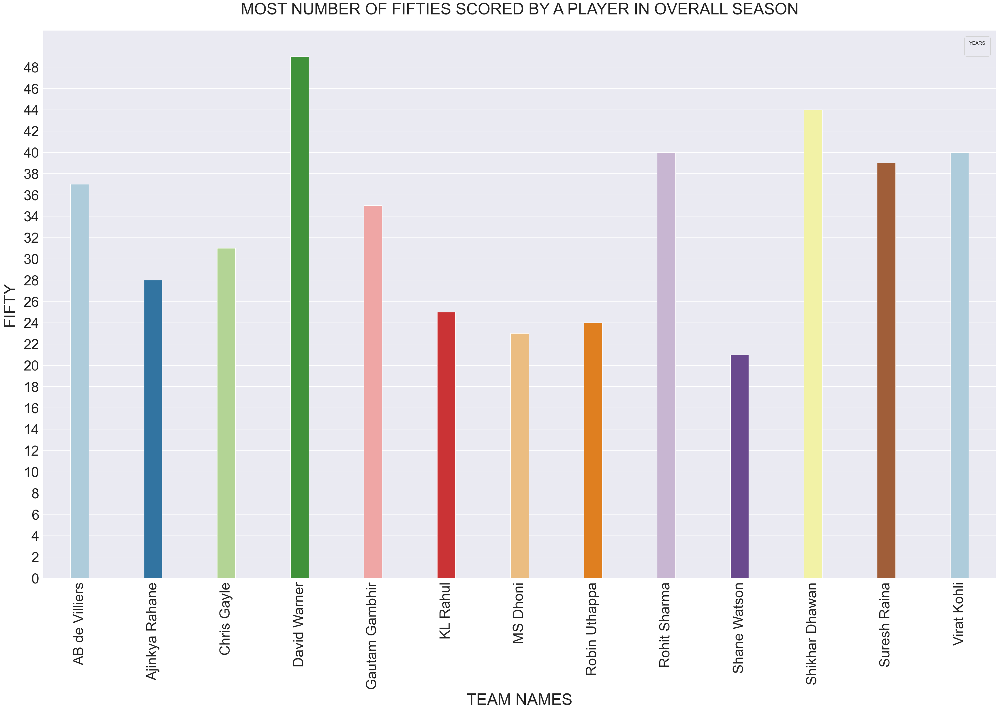

In [400]:
plt.figure(figsize=(40,30))
ax = sns.barplot(x='PLAYERS',y='FIFTY',data=final_most_ff,palette='Paired',errwidth=20)
plt.title('MOST NUMBER OF FIFTIES SCORED BY A PLAYER IN OVERALL SEASON',fontsize=40,pad=40)
plt.xlabel('TEAM NAMES',fontsize=40,labelpad =10)
plt.ylabel('FIFTY',fontsize=40,labelpad=15)


y_ticks = np.arange(0, 50 , 2)

plt.xticks(rotation=90,fontsize=35)
plt.yticks(y_ticks,fontsize=35)
ax.legend(title = 'YEARS', bbox_to_anchor = (1,1),fontsize=30)


def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)

change_width(ax, .25)

ax.figure.tight_layout(pad = 20)
#ax.figure.savefig("E:\\DATA SCIENCE\\Batch 91\\Projects\\team_per.png")
plt.show()

### David Warner is at the Top In Most Fifty List with ( 48 Fiftites In the Entire IPL Season )
### Shikhar Dhawan is at the second position In Most Fifty List with ( 43 Fiftites In the Entire IPL Season )
### Virat Kohli is at the third position In Most Fifty List with ( 40 Fiftites In the Entire IPL Season )

                        

                             

                

## <font color = Orange><h1><center>Analysis On Most Fours Hitten By A Batsman In Overall Season</center></h1></font>

                        

In [401]:
final_df

,PLAYERS,MATCHES,INNINGS,RUNS,BALLS FACED,HUNDREDS,FIFTY,FOURS,SIXES,HIGHEST SCORES,STRIKE RATE,AVERAGE,NOT OUTS,OUTS
0,AB de Villiers,161,149,4591,2963,2,37,367,233,55,154,39.92,154,115
1,Aakash Chopra,7,6,53,71,0,0,7,0,65,74,8.83,74,6
2,Aaron Finch,86,84,1984,1549,0,14,204,74,54,128,25.77,128,77
3,Abdul Samad,16,12,147,91,0,0,9,9,71,161,18.38,161,8
4,Abhimanyu Mithun,12,6,27,20,0,0,3,1,45,135,9.00,135,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
382,Yogesh Takawale,5,5,104,91,0,0,17,1,65,114,20.80,114,5
383,Yusuf Pathan,174,154,3204,2241,1,13,262,158,59,142,29.13,142,110
384,Yuvraj Singh,132,126,2750,2120,0,13,217,149,42,129,24.77,129,111
385,Yuzvendra Chahal,7,1,8,21,0,0,0,0,41,38,inf,38,0


# Note :- Analysis On  Minimum 280 Sixes Scored By A PLayers

In [402]:
# As there are more no. of players its not possible to show it in single graph.
# So I'm Filtering the players who had Hits  more than 280 Sixes.


final_most_4 = final_df[final_df['FOURS']>280]

In [403]:
final_most_4

,PLAYERS,MATCHES,INNINGS,RUNS,BALLS FACED,HUNDREDS,FIFTY,FOURS,SIXES,HIGHEST SCORES,STRIKE RATE,AVERAGE,NOT OUTS,OUTS
0,AB de Villiers,161,149,4591,2963,2,37,367,233,55,154,39.92,154,115
16,Ajinkya Rahane,149,139,3937,3231,2,28,416,76,36,121,32.01,121,123
24,Ambati Rayudu,166,156,3795,2970,1,20,314,145,94,127,29.65,127,128
61,Brendon McCullum,108,108,2874,2179,2,13,292,130,48,131,27.90,131,103
69,Chris Gayle,140,139,4950,3312,6,31,404,357,19,149,40.24,149,123
87,David Warner,141,141,5284,3755,4,49,509,196,54,140,43.31,140,122
97,Dinesh Karthik,188,171,3658,2821,0,18,370,100,16,129,25.58,129,143
111,Gautam Gambhir,139,137,3931,3126,0,35,459,57,13,125,32.22,125,122
187,MS Dhoni,211,186,4669,3417,0,23,317,217,66,136,40.25,136,116
193,Manish Pandey,148,138,3458,2833,1,20,300,101,32,122,30.88,122,112


# BOX PLOT

<Figure size 4000x3000 with 0 Axes>

Text(0.5, 1.0, 'MOST NUMBER OF FOURS HIT BY A PLAYER IN OVERALL SEASON')

Text(0.5, 0, 'TEAM NAMES')

Text(0, 0.5, 'FOURS')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18]),
 [Text(0, 0, 'AB de Villiers'),
  Text(1, 0, 'Ajinkya Rahane'),
  Text(2, 0, 'Ambati Rayudu'),
  Text(3, 0, 'Brendon McCullum'),
  Text(4, 0, 'Chris Gayle'),
  Text(5, 0, 'David Warner'),
  Text(6, 0, 'Dinesh Karthik'),
  Text(7, 0, 'Gautam Gambhir'),
  Text(8, 0, 'MS Dhoni'),
  Text(9, 0, 'Manish Pandey'),
  Text(10, 0, 'Parthiv Patel'),
  Text(11, 0, 'Robin Uthappa'),
  Text(12, 0, 'Rohit Sharma'),
  Text(13, 0, 'Sachin Tendulkar'),
  Text(14, 0, 'Shane Watson'),
  Text(15, 0, 'Shikhar Dhawan'),
  Text(16, 0, 'Suresh Raina'),
  Text(17, 0, 'Virat Kohli'),
  Text(18, 0, 'Virender Sehwag')])

([<matplotlib.axis.YTick at 0x155f58e1400>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


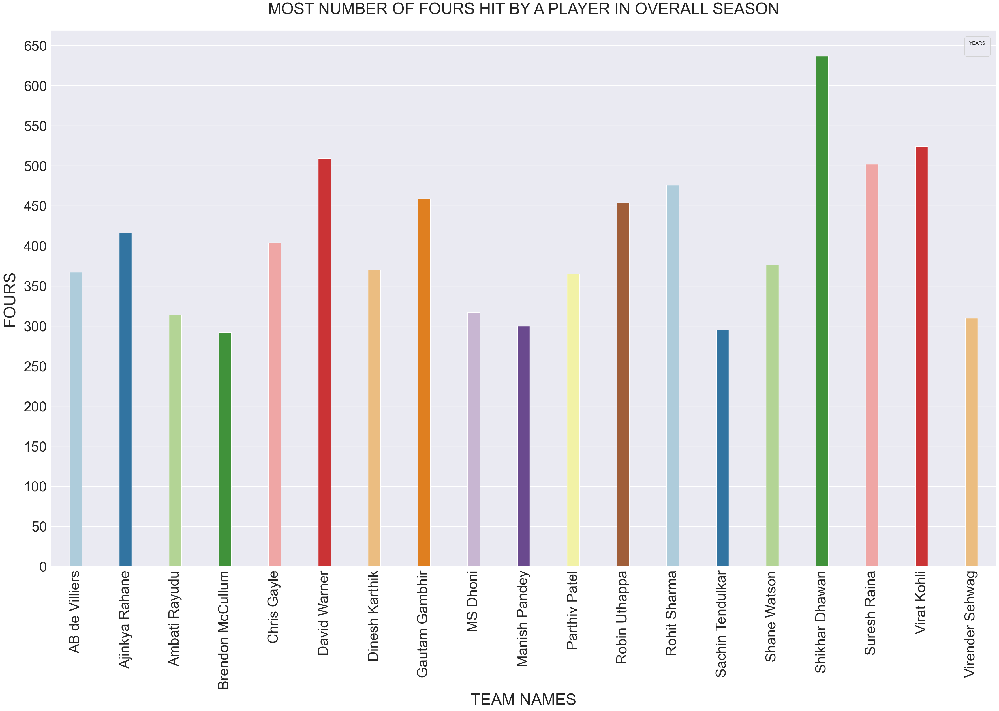

In [404]:
plt.figure(figsize=(40,30))
ax = sns.barplot(x='PLAYERS',y='FOURS',data=final_most_4,palette='Paired',errwidth=20)
plt.title('MOST NUMBER OF FOURS HIT BY A PLAYER IN OVERALL SEASON',fontsize=40,pad=40)
plt.xlabel('TEAM NAMES',fontsize=40,labelpad =10)
plt.ylabel('FOURS',fontsize=40,labelpad=15)


y_ticks = np.arange(0, 700 , 50)

plt.xticks(rotation=90,fontsize=35)
plt.yticks(y_ticks,fontsize=35)
ax.legend(title = 'YEARS', bbox_to_anchor = (1,1),fontsize=30)


def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)

change_width(ax, .25)

ax.figure.tight_layout(pad = 20)
#ax.figure.savefig("E:\\DATA SCIENCE\\Batch 91\\Projects\\team_per.png")
plt.show()

### Shikhar Dhawan is at the Top In Most Fours Hits List with ( 626 Fours In the Entire IPL Season )
### Virat Kohli is at the second position with (  519 Fours In The Entire IPL Season )
### David Warner is at the third position with ( 506 Fours In The Entire IPL Season )